<img src="https://upload.wikimedia.org/wikipedia/commons/5/56/Globant-LightBG-Color%403x.png" alt="Globant" width="400" style="float: right;">

# __Tech Partners - Smart CV Project__

## __DataFrame Generator v.3__

## NLTK's VADER module
VADER is an NLTK module that provides sentiment scores based on words used ("completely" boosts a score, while "slightly" reduces it), on capitalization & punctuation ("GREAT!!!" is stronger than "great."), and negations (words like "isn't" and "doesn't" affect the outcome).
<br>To view the source code visit https://www.nltk.org/_modules/nltk/sentiment/vader.html

In [1]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [2]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\jorgeantonio.lopez\AppData\Roaming\nltk_data.
[nltk_data]     ..
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [3]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

VADER's `SentimentIntensityAnalyzer()` takes in a string and returns a dictionary of scores in each of four categories:
* negative
* neutral
* positive
* compound *(computed by normalizing the scores above)*

In [4]:
a = 'This was a good movie.'
sid.polarity_scores(a)

{'neg': 0.0, 'neu': 0.508, 'pos': 0.492, 'compound': 0.4404}

In [5]:
data = pd.read_csv('data_assessment.csv',sep=',', encoding='utf-8')
print('shape:',data.shape)
data.head(5)

shape: (51808, 3)


,Unnamed: 0,text,tag
0,0,the incongruity of it all is funny for a while...,neg
1,1,"seeing oscar as someone he could trust , charl...",pos
2,2,it has a vivid soundmix .,neg
3,3,"like the first scream , craven and screenwrite...",pos
4,4,"if you're a fan of contemporary , edgy music ,...",pos


In [6]:
print('shape before:',data.shape)
data.drop(['Unnamed: 0'], axis=1, inplace=True)
#data['tag'].value_counts()
data = data[(data['tag'] == 'pos') | (data['tag'] == 'neg')]
print(data['tag'].value_counts())

# REMOVE NaN VALUES AND EMPTY STRINGS:
data.dropna(inplace=True)

blanks = []  # start with an empty list

for i,lb,rv in data.itertuples():  # iterate over the DataFrame
    if type(rv)==str:            # avoid NaN values
        if rv.isspace():         # test 'review' for whitespace
            blanks.append(i)     # add matching index numbers to the list

data.drop(blanks, inplace=True)
print('*'*80)
print('shape after:',data.shape)
print(data['tag'].value_counts())

shape before: (51808, 3)
pos    26366
neg    25434
Name: tag, dtype: int64
********************************************************************************
shape after: (51783, 2)
pos    26355
neg    25428
Name: tag, dtype: int64


## Let's run the first review through VADER

In [7]:
row = 22
print(sid.polarity_scores(data.loc[row]['text']))
print('*'*80)
print(data.loc[row]['tag'])
print('*'*80)
data.loc[row][0]

{'neg': 0.074, 'neu': 0.895, 'pos': 0.031, 'compound': -0.4019}
********************************************************************************
pos
********************************************************************************


'a lot of criticism has gone against this film ( from what i have read so far , anyway--yep , all two reviews ) , and it makes me wonder why these types of films are automatically dismissed as gory , laughable pieces of trash .'

In [8]:
data['scores'] = data['text'].apply(lambda text: sid.polarity_scores(text))
data['compound']  = data['scores'].apply(lambda score_dict: score_dict['compound'])
data['comp_score'] = data['compound'].apply(lambda c: 'pos' if c >=0 else 'neg')
data.head()

,text,tag,scores,compound,comp_score
0,the incongruity of it all is funny for a while...,neg,"{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'comp...",0.6887,pos
1,"seeing oscar as someone he could trust , charl...",pos,"{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'comp...",0.6908,pos
2,it has a vivid soundmix .,neg,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,pos
3,"like the first scream , craven and screenwrite...",pos,"{'neg': 0.167, 'neu': 0.679, 'pos': 0.154, 'co...",-0.0516,neg
4,"if you're a fan of contemporary , edgy music ,...",pos,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3182,pos


In [9]:
data['neg']  = data['scores'].apply(lambda score_dict: score_dict['neg'])
data['neu']  = data['scores'].apply(lambda score_dict: score_dict['neu'])
data['pos']  = data['scores'].apply(lambda score_dict: score_dict['pos'])
data.head()

,text,tag,scores,compound,comp_score,neg,neu,pos
0,the incongruity of it all is funny for a while...,neg,"{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'comp...",0.6887,pos,0.000,0.849,0.151
1,"seeing oscar as someone he could trust , charl...",pos,"{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'comp...",0.6908,pos,0.000,0.826,0.174
2,it has a vivid soundmix .,neg,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,pos,0.000,1.000,0.000
3,"like the first scream , craven and screenwrite...",pos,"{'neg': 0.167, 'neu': 0.679, 'pos': 0.154, 'co...",-0.0516,neg,0.167,0.679,0.154
4,"if you're a fan of contemporary , edgy music ,...",pos,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3182,pos,0.000,0.839,0.161


In [10]:
data['max_score'] = data[['neg','pos']].idxmax(axis=1) #'score_neu',
print(data['max_score'].value_counts())
data.head()

neg    28432
pos    23351
Name: max_score, dtype: int64


,text,tag,scores,compound,comp_score,neg,neu,pos,max_score
0,the incongruity of it all is funny for a while...,neg,"{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'comp...",0.6887,pos,0.000,0.849,0.151,pos
1,"seeing oscar as someone he could trust , charl...",pos,"{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'comp...",0.6908,pos,0.000,0.826,0.174,pos
2,it has a vivid soundmix .,neg,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,pos,0.000,1.000,0.000,neg
3,"like the first scream , craven and screenwrite...",pos,"{'neg': 0.167, 'neu': 0.679, 'pos': 0.154, 'co...",-0.0516,neg,0.167,0.679,0.154,neg
4,"if you're a fan of contemporary , edgy music ,...",pos,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3182,pos,0.000,0.839,0.161,pos


In [11]:
pd.crosstab(data.tag, data.max_score)#,normalize=True)

max_score,neg,pos
tag,,
neg,15268,10160
pos,13164,13191


In [12]:
data[(data['tag'] == data['max_score'])]['tag'].count()

28459

In [237]:
#data.drop(['comp_score'], axis=1, inplace=True)
#data['comp_score'] = data['compound'].apply(lambda c: 'pos' if c >= 0.1 else 'neg')
#pd.crosstab(data.tag, data.comp_score)#,normalize=True)

Se necesita mejorar la calidad de las etiquetas, por lo que se propone utilizar los campos max_score y tag para crea un nuevo campo llamado tag_vf con las siguientes reglas:

1.- 'neg' si tag y max_score son neg

2.- 'pos' si tag y max_score son pos

Luego verificar los demás registros que son diferentes 23,324 (10,160+13,164), para etiquetarlos.

In [13]:
data[(data['tag'] != data['max_score']) & (data['neu'] == 1)].sort_values(by=['neg'], ascending= False )['neu'].value_counts()

1.0    5510
Name: neu, dtype: int64

Se observan algunos puntos para los 23,204 casos:

* 5,510 presentan el campo neutral (neu) igual a 1, por lo que se propone etiquetar tag_vf como 'neu'

Entonces restan 17,814 casos por ser re-etiquetados

In [14]:
umbral = 0.7

In [15]:
print('casos restantes con score neutro < 1:',data[(data['tag'] != data['max_score']) & (data['neu'] < 1)]['neu'].count())
print('numero de registros con score negativo = 1:',data[(data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['neg'] >= umbral) & (data['pos'] < umbral)]['neg'].count())
print('numero de registros con score positivo = 1:',data[(data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['pos'] >= umbral) & (data['neg'] < umbral)]['pos'].count())

casos restantes con score neutro < 1: 17814
numero de registros con score negativo = 1: 50
numero de registros con score positivo = 1: 152


Para los 17,814 casos Se tiene que:

* numero de registros con score negativo = 1: 50
* numero de registros con score positivo = 1: 152


In [16]:
data[(data['tag'] != data['max_score']) & (data['neu'] == 0) \
    ] \
    .sort_values(by=['neg'], ascending= False ).shape

(167, 9)

In [17]:
# neutrales - 17540 (4257 + 6523  + 6760)
# (data['pos'] == 0) & (data['neg'] > 0) -> 4257 - neg
# (data['pos'] > 0) & (data['neg'] == 0) -> 6523 - pos
# (data['pos'] > 0) & (data['neg'] > 0) -> 6760 neu

data[(data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['neu'] > 0) \
    & (data['neg'] < umbral) & (data['pos'] < umbral) \
    #& (data['pos'] > 0) & (data['neg'] > 0)
    ] \
    .sort_values(by=['neg'], ascending= False ).shape

(17540, 9)

In [18]:
row = 34662
print(sid.polarity_scores(data.loc[row]['text']))
print('*'*80)
print(data.loc[row]['tag'])
print('*'*80)
data.loc[row][0]

{'neg': 0.0, 'neu': 0.818, 'pos': 0.182, 'compound': 0.5994}
********************************************************************************
neg
********************************************************************************


'the story is a straight shoplift of red rock west , a cult favorite a few years back from john dahl , maker of the phenomenal the last seduction .'

# Revisar desde aqui

In [34]:
# Análisis filtro 3
# 64 filas, deben ser negativos
data[(data['tag'] != data['max_score']) & (data['neu'] == 0) & (data['neg'] == 0) & (data['pos'] == 0)].head(50)

,text,tag,scores,compound,comp_score,neg,neu,pos,max_score,tag_vf
123,.,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
1685,.,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
2641,e .,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
4294,.,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
5117,.,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
7094,: - ) ) .,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
7339,.,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
7994,- * - * - * - * - * - * - * - * -,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
8639,.,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu
9415,o . j .,pos,"{'neg': 0.0, 'neu': 0.0, 'pos': 0.0, 'compound...",0.0,pos,0.0,0.0,0.0,neg,neu


In [29]:
# Análisis filtro 3
# 22 filas, deben ser negativos
data[(data['tag'] != data['max_score']) & (data['neu'] == 0) & (data['neg'] > 0) & (data['pos'] == 0)]

,text,tag,scores,compound,comp_score,neg,neu,pos,max_score,tag_vf
1401,hell no .,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.7783,neg,1.0,0.0,0.0,neg,neu
1662,nasty .,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.5574,neg,1.0,0.0,0.0,neg,neu
4364,sorry .,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.0772,neg,1.0,0.0,0.0,neg,neu
5586,hopelessness ?,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.6249,neg,1.0,0.0,0.0,neg,neu
11479,revenge .,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.5267,neg,1.0,0.0,0.0,neg,neu
11876,heh !,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.2244,neg,1.0,0.0,0.0,neg,neu
15536,""" no !",pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.3595,neg,1.0,0.0,0.0,neg,neu
15885,"hell , no !",pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.7959,neg,1.0,0.0,0.0,neg,neu
16182,scream 2 !,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.4574,neg,1.0,0.0,0.0,neg,neu
16512,confused ?,pos,"{'neg': 1.0, 'neu': 0.0, 'pos': 0.0, 'compound...",-0.3182,neg,1.0,0.0,0.0,neg,neu


In [39]:
# Análisis filtro 3
# 73 filas, deben ser negativos
#data[(data['tag'] != data['max_score']) & (data['neu'] == 0) & (data['neg'] == 0) & (data['pos'] > 0)][0:50]
data[(data['tag'] != data['max_score']) & (data['neu'] == 0) & (data['neg'] == 0) & (data['pos'] > 0)][51:73]

,text,tag,scores,compound,comp_score,neg,neu,pos,max_score,tag_vf
37333,justified ?,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.4019,pos,0.0,0.0,1.0,pos,neu
37683,ok . . .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.2960,pos,0.0,0.0,1.0,pos,neu
39013,beauty .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.5859,pos,0.0,0.0,1.0,pos,neu
39559,a romantic interest .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.6908,pos,0.0,0.0,1.0,pos,neu
40147,a funny joke .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.6249,pos,0.0,0.0,1.0,pos,neu
41147,wow .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.5859,pos,0.0,0.0,1.0,pos,neu
41379,honestly .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.4588,pos,0.0,0.0,1.0,pos,neu
41608,"funny ! """,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.4926,pos,0.0,0.0,1.0,pos,neu
42018,wow .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.5859,pos,0.0,0.0,1.0,pos,neu
43649,yes .,neg,"{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound...",0.4019,pos,0.0,0.0,1.0,pos,neu


In [44]:
# Análisis filtro 6
# 6,760 filas, deben ser negativos, pero propongo no usarlos para entrenar el modelo, pues muchos de estos comentarios son random.
data[(data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['neu'] > 0) & (data['neg'] < umbral) & (data['pos'] < umbral) & \
            (data['pos'] > 0) & (data['neg'] > 0) ].sort_values(by=['pos'], ascending= False )[900:950]

,text,tag,scores,compound,comp_score,neg,neu,pos,max_score,tag_vf
29805,those who want to see the movie will see it no...,neg,"{'neg': 0.101, 'neu': 0.645, 'pos': 0.253, 'co...",0.3182,pos,0.101,0.645,0.253,pos,neu
50797,his much younger wife played by julianne moore...,neg,"{'neg': 0.22, 'neu': 0.526, 'pos': 0.253, 'com...",0.0000,pos,0.220,0.526,0.253,pos,neu
3332,"he's not quintessential , he's not horrible , ...",neg,"{'neg': 0.214, 'neu': 0.533, 'pos': 0.253, 'co...",0.1139,pos,0.214,0.533,0.253,pos,neu
22061,"they started out with a simple , innocent litt...",neg,"{'neg': 0.153, 'neu': 0.594, 'pos': 0.253, 'co...",0.2532,pos,0.153,0.594,0.253,pos,neu
19288,"there's even a jet ski chase like "" hard rain . """,neg,"{'neg': 0.141, 'neu': 0.606, 'pos': 0.253, 'co...",0.2732,pos,0.141,0.606,0.253,pos,neu
5792,"using flawless special effects , the climax is...",pos,"{'neg': 0.283, 'neu': 0.464, 'pos': 0.253, 'co...",0.0772,pos,0.283,0.464,0.253,neg,neu
33691,they come off as what could best be described ...,neg,"{'neg': 0.084, 'neu': 0.663, 'pos': 0.253, 'co...",0.7655,pos,0.084,0.663,0.253,pos,neu
16510,"as a bad movie , it is unintentionally funny e...",neg,"{'neg': 0.158, 'neu': 0.588, 'pos': 0.253, 'co...",0.2732,pos,0.158,0.588,0.253,pos,neu
27821,i was a huge fan of norm macdonald's sarcastic...,neg,"{'neg': 0.071, 'neu': 0.676, 'pos': 0.253, 'co...",0.6249,pos,0.071,0.676,0.253,pos,neu
7458,failed to really get the joke .,pos,"{'neg': 0.338, 'neu': 0.41, 'pos': 0.252, 'com...",-0.2111,neg,0.338,0.410,0.252,neg,neu


In [20]:
#filtro_p_n = pos y neg
filtro_p_n = ((data['tag'] == data['max_score']))
#filtro_0 = neu > si es neutral (5 mil casos)
filtro_0 = ((data['tag'] != data['max_score']) & (data['neu'] == 1))
#filtro_1 = neg
filtro_1 = ((data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['neg'] >= umbral) & (data['pos'] < umbral) )
#filtro_2 = pos
filtro_2 = ((data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['pos'] >= umbral) & (data['neg'] < umbral) )

#filtro_3 = neg -> no es neutral, ver análisis arriba
filtro_3 = ((data['tag'] != data['max_score']) & (data['neu'] == 0))
#filtro_3_i = neg
#filtro_3_0 = ((data['tag'] != data['max_score']) & (data['neu'] == 0) & (data['neg'] == 0) & (data['pos'] == 0)) # 64 filas
#filtro_3_1 = ((data['tag'] != data['max_score']) & (data['neu'] == 0) & (data['neg']  > 0) & (data['pos'] == 0)) # 22 filas, 
#filtro_3_2 = ((data['tag'] != data['max_score']) & (data['neu'] == 0) & (data['neg'] == 0) & (data['pos']  > 0)) # 73 filas,

#filtro_4 = neg
filtro_4 = ((data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['neu'] > 0) & (data['neg'] < umbral) & (data['pos'] < umbral) & \
            (data['pos'] == 0) & (data['neg'] > 0) )
#filtro_5 = pos
filtro_5 = ((data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['neu'] > 0) & (data['neg'] < umbral) & (data['pos'] < umbral) & \
            (data['pos'] > 0) & (data['neg'] == 0) )
#filtro_6 = neu > no es neutral, deben ser negativos 
filtro_6 = ((data['tag'] != data['max_score']) & (data['neu'] < 1) & (data['neu'] > 0) & (data['neg'] < umbral) & (data['pos'] < umbral) & \
            (data['pos'] > 0) & (data['neg'] > 0) )

In [21]:
#data.drop(['tag_vf'], axis=1, inplace=True)

data[['tag_vf']] = 'vacio'
data.loc[filtro_p_n, 'tag_vf'] = data['tag']
data.loc[filtro_0, 'tag_vf'] = 'neu'
data.loc[filtro_1, 'tag_vf'] = 'neg'
data.loc[filtro_2, 'tag_vf'] = 'pos'
data.loc[filtro_3, 'tag_vf'] = 'neu'
data.loc[filtro_4, 'tag_vf'] = 'neg'
data.loc[filtro_5, 'tag_vf'] = 'pos'
data.loc[filtro_6, 'tag_vf'] = 'neu'

pc_tag_vf = pd.DataFrame(data.tag_vf.value_counts(normalize=False))
print('Tag vf')
print(pc_tag_vf)
data.head(3)
print('*'*20)
print('shape df:', data.shape)

Tag vf
     tag_vf
pos   19793
neg   19553
neu   12437
********************
shape df: (51783, 10)


In [514]:
pd.crosstab(data.tag, data.tag_vf, margins =True)#,normalize=True)

tag_vf,neg,neu,pos,All
tag,,,,
neg,15268,3558,6602,25428
pos,4285,8879,13191,26355
All,19553,12437,19793,51783


In [519]:
data


,text,tag,scores,compound,neg,neu,pos,max_score,comp_score,tag_vf
0,the incongruity of it all is funny for a while...,neg,"{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'comp...",0.6887,0.000,0.849,0.151,pos,pos,pos
1,"seeing oscar as someone he could trust , charl...",pos,"{'neg': 0.0, 'neu': 0.826, 'pos': 0.174, 'comp...",0.6908,0.000,0.826,0.174,pos,pos,pos
2,it has a vivid soundmix .,neg,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,0.000,1.000,0.000,neg,neg,neg
3,"like the first scream , craven and screenwrite...",pos,"{'neg': 0.167, 'neu': 0.679, 'pos': 0.154, 'co...",-0.0516,0.167,0.679,0.154,neg,neg,neu
4,"if you're a fan of contemporary , edgy music ,...",pos,"{'neg': 0.0, 'neu': 0.839, 'pos': 0.161, 'comp...",0.3182,0.000,0.839,0.161,pos,pos,pos
...,...,...,...,...,...,...,...,...,...,...
51803,"and did basinger lose some of her acting "" tal...",neg,"{'neg': 0.103, 'neu': 0.646, 'pos': 0.251, 'co...",0.5994,0.103,0.646,0.251,pos,pos,neu
51804,"unfortunately , she has sided with yeung seung .",pos,"{'neg': 0.286, 'neu': 0.714, 'pos': 0.0, 'comp...",-0.3400,0.286,0.714,0.000,neg,neg,neg
51805,they're on another planet that was filmed in e...,neg,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",0.0000,0.000,1.000,0.000,neg,neg,neg
51806,price contacts dunne and convinces him to come...,pos,"{'neg': 0.0, 'neu': 0.957, 'pos': 0.043, 'comp...",0.1779,0.000,0.957,0.043,pos,pos,pos


In [522]:
row = 0
print(sid.polarity_scores(data.loc[row]['text']))
print('*'*80)
print(data.loc[row]['tag'])
print('*'*80)
data.loc[row][0]

{'neg': 0.0, 'neu': 0.849, 'pos': 0.151, 'compound': 0.6887}
********************************************************************************
neg
********************************************************************************


'the incongruity of it all is funny for a while , with three burly black men discussing higher math in ghetto language and white-bread carrey mouthing said language with an entirely too-pleasant smile on his face .'

In [527]:
#data
print(data.shape)
data.to_csv(r'data_assessment_v2.csv')

(51783, 10)


## Adding Scores and Labels to the DataFrame
In this next section we'll add columns to the original DataFrame to store polarity_score dictionaries, extracted compound scores, and new "pos/neg" labels derived from the compound score. We'll use this last column to perform an accuracy test.

# Pycaret

In [1]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy
numpy.version.version

'1.20.3'

In [11]:
data = pd.read_csv('data_assessment.csv',sep=',', encoding='utf-8')
print('shape:',data.shape)
data.head(5)

shape: (51808, 3)


,Unnamed: 0,text,tag
0,0,the incongruity of it all is funny for a while...,neg
1,1,"seeing oscar as someone he could trust , charl...",pos
2,2,it has a vivid soundmix .,neg
3,3,"like the first scream , craven and screenwrite...",pos
4,4,"if you're a fan of contemporary , edgy music ,...",pos


In [12]:
y = [data['tag']]
y

[0        neg
 1        pos
 2        neg
 3        pos
 4        pos
         ... 
 51803    neg
 51804    pos
 51805    neg
 51806    pos
 51807    pos
 Name: tag, Length: 51808, dtype: object]

In [13]:
data

,Unnamed: 0,text,tag
0,0,the incongruity of it all is funny for a while...,neg
1,1,"seeing oscar as someone he could trust , charl...",pos
2,2,it has a vivid soundmix .,neg
3,3,"like the first scream , craven and screenwrite...",pos
4,4,"if you're a fan of contemporary , edgy music ,...",pos
...,...,...,...
51803,51803,"and did basinger lose some of her acting "" tal...",neg
51804,51804,"unfortunately , she has sided with yeung seung .",pos
51805,51805,they're on another planet that was filmed in e...,neg
51806,51806,price contacts dunne and convinces him to come...,pos


In [14]:
X = data.drop('tag', axis=1)
X

,Unnamed: 0,text
0,0,the incongruity of it all is funny for a while...
1,1,"seeing oscar as someone he could trust , charl..."
2,2,it has a vivid soundmix .
3,3,"like the first scream , craven and screenwrite..."
4,4,"if you're a fan of contemporary , edgy music ,..."
...,...,...
51803,51803,"and did basinger lose some of her acting "" tal..."
51804,51804,"unfortunately , she has sided with yeung seung ."
51805,51805,they're on another planet that was filmed in e...
51806,51806,price contacts dunne and convinces him to come...


In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

ValueError: Found input variables with inconsistent numbers of samples: [51808, 1]

In [7]:
print('shape before:',data.shape)
data.drop(['Unnamed: 0'], axis=1, inplace=True)
data.dropna(inplace=True)
print('shape after:',data.shape)
data['tag'].value_counts()
data = data[(data['tag'] == 'pos') | (data['tag'] == 'neg')]
print(data['tag'].value_counts())
#df['text'].value_counts()


shape before: (51808, 3)
shape after: (51783, 2)
pos    26355
neg    25428
Name: tag, dtype: int64


In [10]:
data.head(5000)

,text,tag
0,the incongruity of it all is funny for a while...,neg
1,"seeing oscar as someone he could trust , charl...",pos
2,it has a vivid soundmix .,neg
3,"like the first scream , craven and screenwrite...",pos
4,"if you're a fan of contemporary , edgy music ,...",pos
...,...,...
4996,"of course there must be a villain , but even t...",neg
4997,"it could have been a clever whodunit , but dis...",neg
4998,"exposition : a simple one - a bellhop , ted ( ...",neg
4999,gives us more -- much more .,neg


In [6]:
from pycaret.nlp import *

In [42]:
from pycaret.nlp import *
exp_nlp101 = setup(data = data.head(7000), target = 'text', session_id = 123)
#exp_nlp101 = setup(data = data, target = 'text', session_id = 123)

Description,Value
session_id,123
Documents,7000
Vocab Size,8961
Custom Stopwords,False


# Existen los siguientes modelos:

* 'lda' - Latent Dirichlet Allocation         
* 'lsi' - Latent Semantic Indexing           
* 'hdp' - Hierarchical Dirichlet Process
* 'rp' - Random Projections
* 'nmf' - Non-Negative Matrix Factorization

In [29]:
lsi = create_model('lsi', multi_core = True, chunksize = 100)
print(lsi)

LsiModel(num_terms=7585, num_topics=4, decay=1.0, chunksize=100)


# Probar lo de abajo

In [30]:
lsi_results = assign_model(lsi)
lsi_results.head()

IntProgress(value=0, description='Processing: ', max=5005)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,13:41:47
Status,. . . . . . . . . . . . . . . . . .,Extracting Topics from Model


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [31]:
tuned_unsupervised_lsi = tune_model(model = 'lsi', multi_core = True)
##############################(136 minutos) -> 5:51

IntProgress(value=0, description='Processing: ', max=25)

Output()

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

'hdp' - Hierarchical Dirichlet Process

In [37]:
hdp = create_model('hdp', multi_core = True)

In [39]:
print(hdp)

In [40]:
# 5 mil rows
tuned_unsupervised_hdp = tune_model(model = 'hdp', multi_core = True)
##############################(136 minutos) -> 5:51

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 2 | Coherence: 0.7723


In [41]:
# 5 mil rows
plot_model(hdp, plot = 'tsne')

In [25]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_10mil = data.loc[0:10000]
data_top_10mil

from pycaret.nlp import *
exp_nlp101 = setup(data = data_top_10mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_0_10mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 10mil_20mil rows
tuned_unsupervised_hdp_t1 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 4 | Coherence: 0.5519


In [26]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_10mil_20mil = data.loc[10001:20000]
data_top_10mil_20mil

from pycaret.nlp import *
exp_nlp101 = setup(data = data_top_10mil_20mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_10mil_20mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 10mil_20mil rows
tuned_unsupervised_hdp_t2 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 2 | Coherence: 0.6279


In [27]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_20mil_30mil = data.loc[20001:30000]
data_top_20mil_30mil

from pycaret.nlp import *
exp_nlp101 = setup(data = data_top_20mil_30mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_20mil_30mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 20mil_30mil rows
tuned_unsupervised_hdp_t3 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 4 | Coherence: 0.6351


In [28]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_30mil_40mil = data.loc[30001:40000]
data_top_30mil_40mil

exp_nlp101 = setup(data = data_top_30mil_40mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_30mil_40mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 30mil_40mil rows
tuned_unsupervised_hdp_t4 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 16 | Coherence: 0.5689


In [29]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_40mil_50mil = data.loc[40001:50000]
data_top_40mil_50mil

exp_nlp101 = setup(data = data_top_40mil_50mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_40mil_50mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 40mil_50mil rows
tuned_unsupervised_hdp_t5 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 4 | Coherence: 0.612


In [30]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_50mil_end = data.loc[50001:]
data_top_50mil_end

exp_nlp101 = setup(data = data_top_50mil_end, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_50mil_end')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 40mil_50mil rows
tuned_unsupervised_hdp_t6 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 2 | Coherence: 0.855


In [31]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_20mil = data.loc[0:20000]
data_top_20mil

from pycaret.nlp import *
exp_nlp101 = setup(data = data_top_20mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_0_20mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 0_20mil rows
tuned_unsupervised_hdp_t7 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 400 | Coherence: 0.3523


In [32]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_30mil = data.loc[0:30000]
data_top_30mil

from pycaret.nlp import *
exp_nlp101 = setup(data = data_top_30mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_0_30mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 0_30mil rows
tuned_unsupervised_hdp_t8 = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 400 | Coherence: 0.2966


In [11]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_30mil = data.loc[0:30000]
data_top_30mil

,text,tag
0,the incongruity of it all is funny for a while...,neg
1,"seeing oscar as someone he could trust , charl...",pos
2,it has a vivid soundmix .,neg
3,"like the first scream , craven and screenwrite...",pos
4,"if you're a fan of contemporary , edgy music ,...",pos
...,...,...
29996,"for children , it offers imaginative visuals ,...",pos
29997,the plot is pathetic garbage strung together b...,neg
29998,"depending on who you ask , the original sin wa...",neg
29999,"the trouble is , the animation may please the ...",neg


# Ejecutando este

In [12]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_30mil = data.loc[0:30000]
data_top_30mil

from pycaret.nlp import *
exp_nlp101 = setup(data = data_top_30mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_0_30mil_tuneo')
#hdp = create_model('hdp',  num_topics = 4, multi_core = True,) # chunksize = 100
#print(hdp)

# 0_30mil rows
tuned_hdp_t9, tuner_hdp_t9 = tune_model(model = 'hdp',  supervised_target = 'tag', multi_core = True,)#, search_library = 'optuna', return_tuner=True) #optimize = 'MAE'


# Ejecutando este en la noche del 5 de octubre

In [8]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_30mil = data.loc[0:30000]
data_top_30mil

from pycaret.nlp import *
exp_name = setup(data = data_top_30mil, target = 'text', session_id = 123,)
lda = create_model('lda')
tuned_lda_v1 = tune_model(model = 'lda', supervised_target = 'tag')

IntProgress(value=0, description='Processing: ', max=25)

Output()

KeyError: "['tag'] not found in axis"

In [ ]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_30mil = data.loc[0:30000]
data_top_30mil

from pycaret.nlp import *
exp_name = setup(data = data_top_30mil, target = 'text', session_id = 123,)
hdp = create_model('hdp')
tuned_hdp_v1 = tune_model(model = 'hdp', supervised_target = 'tag')

In [5]:
from pycaret.datasets import get_data
kiva = get_data('kiva')
from pycaret.nlp import *
exp_name = setup(data = kiva, target = 'en')
lda = create_model('lda')
tuned_lda = tune_model(model = 'lda', supervised_target = 'status')

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Latent Dirichlet Allocation | # Topics: 2 | Accuracy : 0.8551


In [6]:
from pycaret.datasets import get_data
kiva = get_data('kiva')
from pycaret.nlp import *
exp_name = setup(data = kiva, target = 'en')
hdp = create_model('hdp')
tuned_hdp = tune_model(model = 'hdp', supervised_target = 'status')

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 32 | Accuracy : 0.8645


In [ ]:
plot_model(lda, plot='topic_distribution')
plot_model(lda, plot='topic_model')
plot_model(lda, plot='wordcloud', topic_num = 'Topic 5')
plot_model(lda, plot='frequency', topic_num = 'Topic 5')
plot_model(lda, plot='bigram', topic_num = 'Topic 5')
plot_model(lda, plot='trigram', topic_num = 'Topic 5')
plot_model(lda, plot='distribution', topic_num = 'Topic 5')
plot_model(lda, plot='sentiment', topic_num = 'Topic 5')

In [ ]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_50mil_end = data.loc[50001:]
data_top_50mil_end

exp_nlp101 = setup(data = data_top_50mil_end, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_data_top_40mil_50mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 40mil_50mil rows
tuned_unsupervised_hdp_t5 = tune_model(model = 'hdp', multi_core = True)

In [ ]:
data = data.drop_duplicates().reset_index(drop=True)
data_top_20mil_30mil = data.loc[20001:30000]
data_top_20mil_30mil

from pycaret.nlp import *
exp_nlp101 = setup(data = data_top_20mil_30mil, target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_data_top_20mil_30mil')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)

# 20mil_30mil rows
tuned_unsupervised_hdp_t3 = tune_model(model = 'hdp', multi_core = True)

In [7]:
data = data.drop_duplicates().reset_index(drop=True)
data_top = data.head(10000)
data_top

,text,tag
0,the incongruity of it all is funny for a while...,neg
1,"seeing oscar as someone he could trust , charl...",pos
2,it has a vivid soundmix .,neg
3,"like the first scream , craven and screenwrite...",pos
4,"if you're a fan of contemporary , edgy music ,...",pos
...,...,...
9995,nicolas cage plays family man detective tom we...,neg
9996,there are good performances by hattie jacques ...,pos
9997,the visual effects by dream quest ( the abyss ...,pos
9998,"as much as i enjoyed them , i usually felt lik...",pos


# Ejecutando las dos celdas de abajo

In [42]:
from pycaret.nlp import *
exp_nlp101 = setup(data = data.head(12000), target = 'text', session_id = 123, log_experiment = True, experiment_name = 'hdp_v1')
hdp = create_model('hdp', multi_core = True,) # chunksize = 100
print(hdp)


In [43]:
# 30000 mil rows
tuned_unsupervised_hdp = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 16 | Coherence: 0.4759


In [53]:
# launch eda
eda(display_format = 'bokeh')

ImportError: It appears that Autoviz is not installed. Do: pip install autoviz

In [45]:
# interpret model
interpret_model(hdp, plot = 'msa')

AttributeError: 'HdpModel' object has no attribute 'predict'

In [49]:
dashboard(hdp)

AssertionError: for ClassifierExplainer, model should be a scikit-learn compatible *classifier* model that has a predict_proba(...) method, so not a <class 'gensim.models.hdpmodel.HdpModel'>! If you are using e.g an SVM with hinge loss (which does not support predict_proba), you can try the following monkey patch:

import types
def predict_proba(self, X):
    pred = self.predict(X)
    return np.array([1-pred, pred]).T
model.predict_proba = types.MethodType(predict_proba, model)


In [48]:
from explainerdashboard import ClassifierExplainer, ExplainerDashboard

In [21]:
hdp_results_4_topics = assign_model(hdp)
hdp_results_4_topics.to_csv("hdp_results_4_topics.csv", sep=',', encoding='utf-8')
hdp_results_4_topics

,text,tag,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic
0,incongruity funny burly black man discuss high...,neg,0.018822,0.019056,0.941818,0.020304,Topic 2
1,see could trust ask watch girlfriend unpredict...,pos,0.716232,0.247025,0.018092,0.018651,Topic 0
2,,neg,NaN,NaN,NaN,NaN,NaN
3,first scream craven screenwriter thing,pos,0.043188,0.866399,0.045675,0.044738,Topic 1
4,fan contemporary edgy music even big draw,pos,0.033772,0.032837,0.898540,0.034852,Topic 2
...,...,...,...,...,...,...,...
9995,play family man welle ask upper class toff mov...,neg,0.017757,0.017350,0.572067,0.392825,Topic 2
9996,good performance however character seem little...,pos,0.593307,0.023531,0.358330,0.024832,Topic 0
9997,visual_effect dream abyss industrial trilogy t...,pos,0.031993,0.033384,0.032773,0.901851,Topic 3
9998,much enjoy usually feel miss,pos,0.044426,0.864671,0.045435,0.045468,Topic 1


In [22]:
# Ejecutando este

# 10000 mil rows
tuned_unsupervised_hdp = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 8 | Coherence: 0.5657


In [23]:
# 10000 mil rows
hdp = create_model('hdp', multi_core = True, num_topics=8) # chunksize = 100
print(hdp)

tuned_unsupervised_hdp_8_topics = tune_model(model = 'hdp', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 8 | Coherence: 0.5657


In [24]:
hdp_results_8_topics = assign_model(hdp)
#hdp_results_8_topics.to_csv("hdp_results_8_topics.csv", sep=',', encoding='utf-8')
hdp_results_8_topics

,text,tag,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Dominant_Topic
0,incongruity funny burly black man discuss high...,neg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.937431,0.000000,Topic 6
1,see could trust ask watch girlfriend unpredict...,pos,0.000000,0.000000,0.529185,0.000000,0.000000,0.420923,0.000000,0.000000,Topic 2
2,,neg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,first scream craven screenwriter thing,pos,0.021000,0.020668,0.021474,0.020404,0.853476,0.020767,0.020989,0.021222,Topic 4
4,fan contemporary edgy music even big draw,pos,0.015759,0.015513,0.016099,0.015312,0.015330,0.015569,0.890489,0.015928,Topic 6
...,...,...,...,...,...,...,...,...,...,...,...
9995,play family man welle ask upper class toff mov...,neg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.941601,0.000000,Topic 6
9996,good performance however character seem little...,pos,0.011448,0.920207,0.011698,0.011138,0.011147,0.011329,0.011451,0.011581,Topic 1
9997,visual_effect dream abyss industrial trilogy t...,pos,0.015734,0.015496,0.016099,0.015302,0.015335,0.015577,0.015725,0.890732,Topic 7
9998,much enjoy usually feel miss,pos,0.020997,0.020677,0.854458,0.020415,0.020472,0.020764,0.020989,0.021228,Topic 2


In [25]:
plot_model(hdp, plot = 'topic_distribution')

In [26]:
evaluate_model(hdp)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [29]:
df_hpd = hdp_results_8_topics.drop(['text', 'Dominant_Topic'],axis=1)
df_hpd.head()

,tag,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7
0,neg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.937431,0.000000
1,pos,0.000000,0.000000,0.529185,0.000000,0.000000,0.420923,0.000000,0.000000
2,neg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,pos,0.021000,0.020668,0.021474,0.020404,0.853476,0.020767,0.020989,0.021222
4,pos,0.015759,0.015513,0.016099,0.015312,0.015330,0.015569,0.890489,0.015928


In [30]:
from pycaret.classification import *
pce_1 = setup(data = df_hpd, target = 'tag', session_id = 13, train_size = 0.8)
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.5259,0.5304,0.6445,0.5279,0.5801,0.0477,0.0491,0.4920
ada,Ada Boost Classifier,0.5254,0.5295,0.6314,0.5280,0.5745,0.0471,0.0483,0.1740
qda,Quadratic Discriminant Analysis,0.5180,0.5266,0.5130,0.5266,0.5189,0.0362,0.0362,0.0120
nb,Naive Bayes,0.5145,0.5198,0.4961,0.5235,0.5071,0.0297,0.0299,0.0090
ridge,Ridge Classifier,0.5125,0.0000,0.6757,0.5157,0.5835,0.0193,0.0208,0.0080
lda,Linear Discriminant Analysis,0.5120,0.5263,0.5713,0.5182,0.5407,0.0220,0.0225,0.0090
lightgbm,Light Gradient Boosting Machine,0.5116,0.5143,0.5545,0.5188,0.5359,0.0217,0.0218,0.0900
et,Extra Trees Classifier,0.5110,0.5132,0.5123,0.5195,0.5156,0.0220,0.0220,0.3580
lr,Logistic Regression,0.5103,0.5198,0.6690,0.5138,0.5802,0.0150,0.0164,2.7930
knn,K Neighbors Classifier,0.5099,0.5146,0.5204,0.5183,0.5192,0.0194,0.0194,0.0360


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=13, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [35]:
hdp_pba= assign_model(hdp)
hdp_pba

,text,tag,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Dominant_Topic
0,incongruity funny burly black man discuss high...,neg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.937431,0.000000,Topic 6
1,see could trust ask watch girlfriend unpredict...,pos,0.000000,0.000000,0.529185,0.000000,0.000000,0.420923,0.000000,0.000000,Topic 2
2,,neg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,first scream craven screenwriter thing,pos,0.021000,0.020668,0.021474,0.020404,0.853476,0.020767,0.020989,0.021222,Topic 4
4,fan contemporary edgy music even big draw,pos,0.015759,0.015513,0.016099,0.015312,0.015330,0.015569,0.890489,0.015928,Topic 6
...,...,...,...,...,...,...,...,...,...,...,...
9995,play family man welle ask upper class toff mov...,neg,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.941601,0.000000,Topic 6
9996,good performance however character seem little...,pos,0.011448,0.920207,0.011698,0.011138,0.011147,0.011329,0.011451,0.011581,Topic 1
9997,visual_effect dream abyss industrial trilogy t...,pos,0.015734,0.015496,0.016099,0.015302,0.015335,0.015577,0.015725,0.890732,Topic 7
9998,much enjoy usually feel miss,pos,0.020997,0.020677,0.854458,0.020415,0.020472,0.020764,0.020989,0.021228,Topic 2


# Nuevo analisis

In [31]:
data = data.drop_duplicates().reset_index(drop=True)
data_top = data.head(10000)
data_top

,text,tag
0,the incongruity of it all is funny for a while...,neg
1,"seeing oscar as someone he could trust , charl...",pos
2,it has a vivid soundmix .,neg
3,"like the first scream , craven and screenwrite...",pos
4,"if you're a fan of contemporary , edgy music ,...",pos
...,...,...
9995,nicolas cage plays family man detective tom we...,neg
9996,there are good performances by hattie jacques ...,pos
9997,the visual effects by dream quest ( the abyss ...,pos
9998,"as much as i enjoyed them , i usually felt lik...",pos


In [27]:
tuned_classification_hdp = tune_model(model = 'hdp', multi_core = True, supervised_target = 'tag')

IntProgress(value=0, description='Processing: ', max=25)

Output()

KeyError: "['tag'] not found in axis"

In [73]:
# 10 mil rows
plot_model(hdp, plot = 'tsne')

In [82]:
print(hdp)

In [74]:
# Este
plot_model(hdp, plot = 'topic_distribution')

In [91]:
hdp_results = assign_model(hdp)
hdp_results.to_csv("hdp_results.csv", sep=',', encoding='utf-8')
hdp_results

,text,tag,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic
0,incongruity funny burly black man discuss high...,neg,0.019044,0.622032,0.338794,0.020130,Topic 1
1,see could trust ask watch girlfriend unpredict...,pos,0.017956,0.415270,0.017949,0.548825,Topic 3
2,,neg,NaN,NaN,NaN,NaN,NaN
3,first scream craven screenwriter thing,pos,0.865115,0.043647,0.045821,0.045417,Topic 0
4,fan contemporary edgy music even big draw,pos,0.032986,0.032393,0.033142,0.901479,Topic 3
...,...,...,...,...,...,...,...
10003,first town,pos,NaN,NaN,NaN,NaN,NaN
2051,NaN,NaN,0.896950,0.032630,0.034749,0.035671,Topic 0
6913,NaN,NaN,0.451796,0.018478,0.509394,0.020333,Topic 2
7810,NaN,NaN,0.618887,0.122264,0.129230,0.129619,Topic 0


In [90]:
 data.head(10000)
 

,text,tag
0,the incongruity of it all is funny for a while...,neg
1,"seeing oscar as someone he could trust , charl...",pos
2,it has a vivid soundmix .,neg
3,"like the first scream , craven and screenwrite...",pos
4,"if you're a fan of contemporary , edgy music ,...",pos
...,...,...
9999,they also pay him a lot of cash .,neg
10000,bob's your uncle !,pos
10001,the movie was beautifully and sensitively made .,pos
10002,who do we root for in this mess ?,neg


In [87]:
gby_hdp_results = hdp_results.groupby(['Dominant_Topic','tag']).agg({'text': 'count'}).reset_index()
gby_hdp_results

pivot_gby_hdp_results = pd.pivot_table(gby_hdp_results, index=['tag'],columns=['Dominant_Topic'],values=['text'],aggfunc=np.sum).droplevel(0, axis=1).reset_index()
pivot_gby_hdp_results

Dominant_Topic,tag,Topic 0,Topic 1,Topic 2,Topic 3
0,neg,1148,857,1202,1596
1,pos,1109,870,1215,1714


In [83]:
lda = create_model('lda', multi_core = True,) # chunksize = 100
print(lda)

LdaModel(num_terms=10591, num_topics=4, decay=0.5, chunksize=100)


In [84]:
# 10000 mil rows
tuned_unsupervised_lda = tune_model(model = 'lda', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Latent Dirichlet Allocation | # Topics: 300 | Coherence: 0.5897


In [34]:
# 20 mil rows
tuned_unsupervised_hdp = tune_model(model = 'hdp', multi_core = True)
##############################(136 minutos) -> 5:51

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 400 | Coherence: 0.3604


In [35]:
# 20 mil rows
plot_model(hdp, plot = 'tsne')

IndexError: index 7585 is out of bounds for axis 1 with size 7585

In [41]:
# Todos los rows
tuned_unsupervised_hdp = tune_model(model = 'hdp', multi_core = True)
##############################(136 minutos) -> 5:51

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Hierarchical Dirichlet Process | # Topics: 400 | Coherence: 0.2137


In [17]:
lda = create_model('lda', multi_core = True)

In [18]:
print(lda)

LdaModel(num_terms=7585, num_topics=4, decay=0.5, chunksize=100)


In [31]:
rp = create_model('rp', multi_core = True)
print(rp)

RpModel(num_terms=7585, num_topics=4)


In [33]:
plot_model(lda, plot = 'topic_distribution')

# Este

In [8]:
#!pip install nbformat==4.2.0
import nbformat
# ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

# Evaluación intrínseca usando el valor de coherencia 
* ¿Qué es la coherencia del tema? Las medidas de coherencia del tema califican un solo tema midiendo el grado de similitud semántica entre las palabras de alto puntaje en el tema. Estas medidas ayudan a distinguir entre temas que son temas interpretables semánticamente y temas que son artefactos de inferencia estadística. La función tune_model() itera en una cuadrícula predefinida con un número diferente de temas y crea un modelo para cada parámetro. Luego se evalúa la coherencia del tema para diferentes modelos y se presentan visualmente en un gráfico que tiene Coherence Score en el eje'y' como función del # Topics eje 'x'.

In [10]:
tuned_unsupervised = tune_model(model = 'lda', multi_core = True)
##############################(136 minutos) -> 5:51

IntProgress(value=0, description='Processing: ', max=25)

Output()

Best Model: Latent Dirichlet Allocation | # Topics: 400 | Coherence: 0.4526


* El modelo con la puntuación de coherencia más alta es el mejor modelo según los criterios de evaluación intrínsecos. Por muy atractivo que pueda parecer que el rendimiento de un modelo de tema se pueda capturar en un número, es decir, la puntuación de coherencia, no viene sin sus inconvenientes. Lo alentamos a que lea un poco más sobre el puntaje de coherencia para comprender más al respecto. [Lee mas]

* Solo hemos cubierto Coherence en este tutorial. La otra medida popular es la perplejidad. Captura cuán sorprendido está un modelo de nuevos datos que no ha visto antes, y se mide como la probabilidad logarítmica normalizada de un conjunto de prueba retenido. Centrándose en la parte de probabilidad logarítmica, puede pensar en la métrica de perplejidad como una medida de la probabilidad de que algunos datos nuevos no vistos se den al modelo que se aprendió anteriormente. Es decir, qué tan bien representa o reproduce el modelo las estadísticas de los datos retenidos. Sin embargo, estudios recientes han demostrado que la probabilidad predictiva (o, de manera equivalente, la perplejidad) y el juicio humano a menudo no están correlacionados, e incluso a veces están ligeramente anticorrelacionados, ya que la optimización de la perplejidad puede no generar temas interpretables por humanos. [Referencia]

In [ ]:
from pycaret.classification import *
pce_1 = setup(data = df_rp, target = 'Label', session_id = 13, train_size = 0.8)
compare_models()

In [13]:
data

,text,tag
0,the incongruity of it all is funny for a while...,neg
1,"seeing oscar as someone he could trust , charl...",pos
2,it has a vivid soundmix .,neg
3,"like the first scream , craven and screenwrite...",pos
4,"if you're a fan of contemporary , edgy music ,...",pos
...,...,...
51803,"and did basinger lose some of her acting "" tal...",neg
51804,"unfortunately , she has sided with yeung seung .",pos
51805,they're on another planet that was filmed in e...,neg
51806,price contacts dunne and convinces him to come...,pos


In [23]:
lda

In [29]:
evaluate_model(lda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [ ]:
plot_model(lda, plot = 'tsne')

### Nota: El método para crear tópicos necesita que los documentos no estén duplicados, por lo que es necesario desduplicar por la variable de Resume 

In [107]:
df_pycaret = df
df_without_duplicates = df_pycaret.drop_duplicates(subset=['Resume'])
df_without_duplicates = df_without_duplicates.reset_index()
df_without_duplicates.rename(columns={'index':'Name_CV'}, inplace=True)
df_without_duplicates

df_without_duplicates.count()

Name_CV                1838
JD_DataScientist       1838
W2F_DataScientist      1838
JD_JavaDeveloper       1838
W2F_JavaDeveloper      1838
JD_PythonDeveloper     1838
W2F_PythonDeveloper    1838
JD_QualityEngineer     1838
W2F_QualityEngineer    1838
JD_WebUI               1838
W2F_WebUI              1838
Label                  1838
Resume                 1838
dtype: int64

In [108]:
df_without_duplicates

,Name_CV,JD_DataScientist,W2F_DataScientist,JD_JavaDeveloper,W2F_JavaDeveloper,JD_PythonDeveloper,W2F_PythonDeveloper,JD_QualityEngineer,W2F_QualityEngineer,JD_WebUI,W2F_WebUI,Label,Resume
0,#CV-Aleksandr_Volvachev,0.045921,0.087375,0.088691,0.083528,0.135774,0.117241,0.100021,0.079132,0.078531,0.076018,0.0,balexander volvachev 27 year 05081990 +375 29 ...
1,1.CV- Ing. Giovanni Pablo Di Sanzo 7-2021 - Ax...,0.065053,0.001996,0.003844,0.003327,0.076874,0.005236,0.005563,0.004684,0.015055,0.008118,0.0,b experiencia laboral jefe comercial 2019 pres...
2,1607428961639490 (1),0.032799,0.034671,0.055636,0.015408,0.049082,0.042434,0.038641,0.027655,0.019609,0.022558,0.0,bxc2xa0 61 matusevich streetxc2xa0 aliaksandrx...
3,1626458006198_CV-Tomas Gasso (2) - Ignacio Feu,0.071480,0.005551,0.000000,0.001542,0.077015,0.002426,0.002578,0.002605,0.000000,0.000000,0.0,b tomas gasso fecha de nacimiento 24031996 nac...
4,1626960461674_Bugueiro Ariel - Otoniel Olea Ba...,0.052963,0.010608,0.013618,0.026517,0.069078,0.034776,0.008620,0.009954,0.029998,0.036666,0.0,bb you g you e i r o a ri e l d e s a r r o l ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,Norymar_Sandoval_Resume - Paolah Rubi Ramirez ...,0.109784,0.028746,0.118090,0.019162,0.113945,0.011727,0.075644,0.026975,0.092130,0.032730,4.0,bmarxc3xada project management consultant with...
1834,Rocio Hernaez CV - Kevin Emmanuel Knezevic San...,0.095340,0.050390,0.051751,0.022393,0.085603,0.022026,0.098280,0.014186,0.066499,0.020491,4.0,bsarandi 1400cba capital rocio 01137776690 her...
1835,"Senior Manager Jorge A Robelo,MBA - Javier Fe...",0.088916,0.055870,0.090917,0.034532,0.099366,0.054345,0.079295,0.039875,0.072692,0.045438,4.0,b western governor university salt lake city u...
1836,Veronica_Contin - Gabriel Eduardo Fernandez,0.110958,0.024113,0.090114,0.028575,0.121371,0.029043,0.074649,0.028159,0.107082,0.035735,4.0,bxc2xa0 xc2xa0 contact veronica contin founder...


In [1]:
import nltk
import pycaret
from pycaret.utils import enable_colab
#enable_colab()
from pycaret.classification import * 
from pycaret.utils import version
version()

'2.3.6'

In [2]:
#!python -m spacy download en_core_web_sm
import spacy
nlp = spacy.load("en_core_web_sm")

In [3]:
#!python -m textblob.download_corpora

In [153]:
from pycaret.nlp import *
from nltk.corpus import stopwords

stop_words = stopwords.words('english')
# Creamos una lista con nuestros textos
#text_list = list(df_pycaret['Resume'])
#caret_set = setup(data = df_pycaret, target='Resume',custom_stopwords=stop_words)
caret_set = setup(data = df_without_duplicates, target='Resume')

Description,Value
session_id,926
Documents,1838
Vocab Size,17561
Custom Stopwords,False


* 'lda' - Latent Dirichlet Allocation         
* 'lsi' - Latent Semantic Indexing           
* 'hdp' - Hierarchical Dirichlet Process
* 'rp' - Random Projections
* 'nmf' - Non-Negative Matrix Factorization

## 'rp' - Random Projections

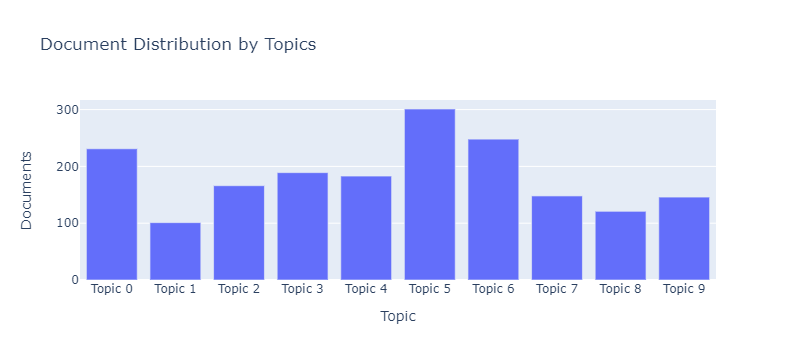

In [141]:
caret_set = setup(data = df_without_duplicates, target='Resume')
rp = create_model('rp', multi_core = True, num_topics=10)
print(rp)
rp_results = assign_model(rp)
#rp_results.head()
plot_model(rp, plot = 'topic_distribution')

In [147]:
df_rp = rp_results.drop(['Name_CV', 'Resume', 'Dominant_Topic'],axis=1)
df_rp.head()

,JD_DataScientist,W2F_DataScientist,JD_JavaDeveloper,W2F_JavaDeveloper,JD_PythonDeveloper,W2F_PythonDeveloper,JD_QualityEngineer,W2F_QualityEngineer,JD_WebUI,W2F_WebUI,...,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,0.045921,0.087375,0.088691,0.083528,0.135774,0.117241,0.100021,0.079132,0.078531,0.076018,...,-2.213594,-0.316227,3.478506,0.948683,-6.008328,5.375871,0.316228,0.316227,-1.581139,0.948684
1,0.065053,0.001996,0.003844,0.003327,0.076874,0.005236,0.005563,0.004684,0.015055,0.008118,...,0.316228,-2.213594,-2.846050,-1.581139,-1.581139,0.316228,2.213594,2.213594,0.948683,2.213594
2,0.032799,0.034671,0.055636,0.015408,0.049082,0.042434,0.038641,0.027655,0.019609,0.022558,...,-2.213594,-3.478505,5.375872,-0.316228,-7.273240,-5.375872,2.846050,-1.581140,2.846050,1.581139
3,0.071480,0.005551,0.000000,0.001542,0.077015,0.002426,0.002578,0.002605,0.000000,0.000000,...,0.316228,1.581139,0.948683,4.110960,-0.316228,1.581139,1.581139,-2.213594,-2.846050,-2.846050
4,0.052963,0.010608,0.013618,0.026517,0.069078,0.034776,0.008620,0.009954,0.029998,0.036666,...,1.897367,-2.529822,2.529822,-3.162277,-1.264911,-0.632455,1.897367,0.000000,-1.264911,-2.529822


## lda - Latent Dirichlet Allocation

In [154]:
#caret_set = setup(data = df_without_duplicates, target='Resume')
lda = create_model('lda', multi_core = True, num_topics=10)
print(lda)
lda_results = assign_model(lda)
lda_results.head()

,Name_CV,JD_DataScientist,W2F_DataScientist,JD_JavaDeveloper,W2F_JavaDeveloper,JD_PythonDeveloper,W2F_PythonDeveloper,JD_QualityEngineer,W2F_QualityEngineer,JD_WebUI,...,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Dominant_Topic,Perc_Dominant_Topic
0,#CV-Aleksandr_Volvachev,0.045921,0.087375,0.088691,0.083528,0.135774,0.117241,0.100021,0.079132,0.078531,...,0.000676,0.124178,0.000676,0.000676,0.652130,0.000676,0.000676,0.000676,Topic 6,0.65
1,1.CV- Ing. Giovanni Pablo Di Sanzo 7-2021 - Ax...,0.065053,0.001996,0.003844,0.003327,0.076874,0.005236,0.005563,0.004684,0.015055,...,0.003850,0.003850,0.429020,0.003850,0.003850,0.540178,0.003852,0.003850,Topic 7,0.54
2,1607428961639490 (1),0.032799,0.034671,0.055636,0.015408,0.049082,0.042434,0.038641,0.027655,0.019609,...,0.001668,0.001669,0.001668,0.431196,0.001668,0.001668,0.001668,0.001669,Topic 1,0.56
3,1626458006198_CV-Tomas Gasso (2) - Ignacio Feu,0.071480,0.005551,0.000000,0.001542,0.077015,0.002426,0.002578,0.002605,0.000000,...,0.003875,0.003876,0.003876,0.003875,0.045697,0.423328,0.138118,0.003875,Topic 7,0.42
4,1626960461674_Bugueiro Ariel - Otoniel Olea Ba...,0.052963,0.010608,0.013618,0.026517,0.069078,0.034776,0.008620,0.009954,0.029998,...,0.549113,0.004767,0.004767,0.004767,0.004767,0.412748,0.004769,0.004767,Topic 2,0.55


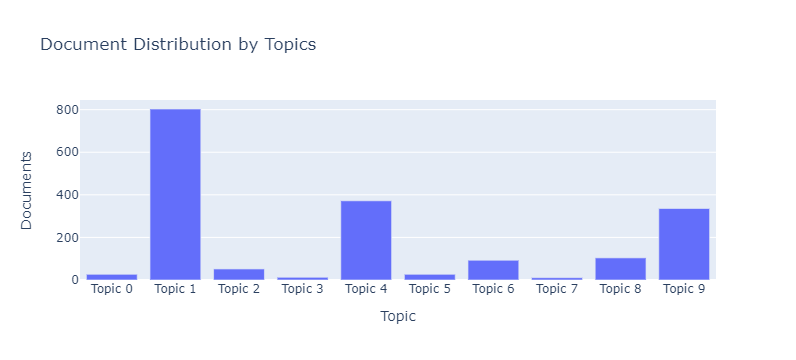

In [133]:
plot_model(lda, plot = 'topic_distribution')

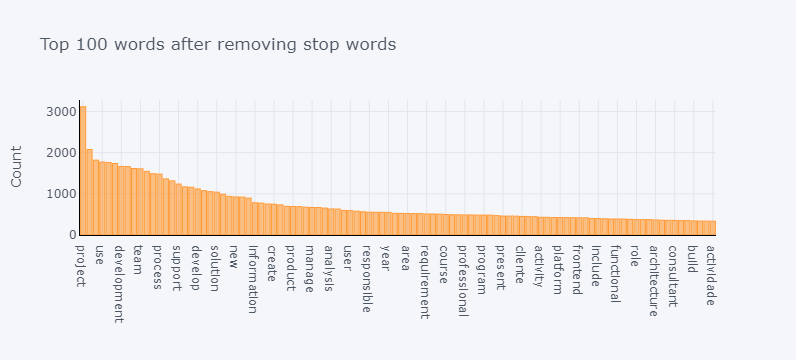

In [114]:
plot_model()

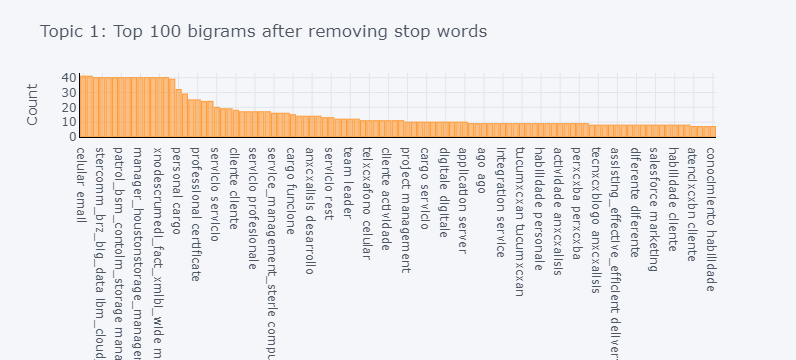

In [115]:
plot_model(lda, plot = 'bigram', topic_num = 'Topic 1')

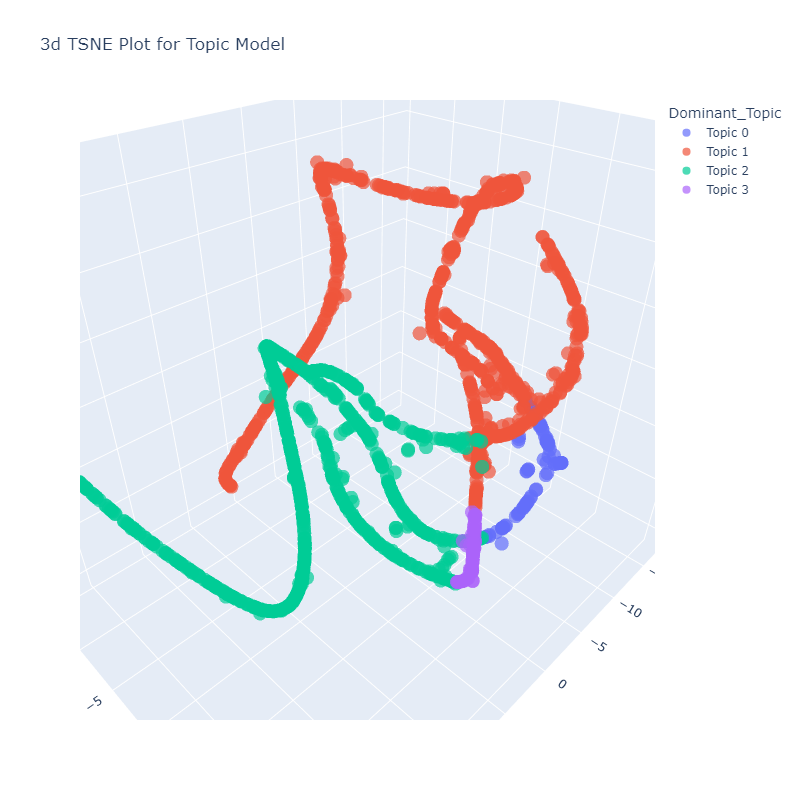

In [116]:
plot_model(lda, plot = 'tsne')

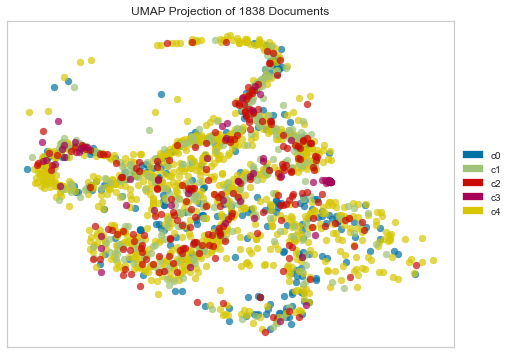

In [117]:
plot_model(lda, plot = 'umap')

In [566]:
evaluate_model(lda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

### Este sirve para ver el número de topicos más importantes.

In [ ]:
tuned_unsupervised = tune_model(model = 'lda', multi_core = True)

IntProgress(value=0, description='Processing: ', max=25)

Output()

### Revisar liga para más detales
https://pycaret.org/plot-model/

### Probar con varios parámetros
https://pycaret.readthedocs.io/en/latest/api/nlp.html

In [119]:
df_lda = lda_results.drop(['Name_CV', 'Resume', 'Dominant_Topic', 'Perc_Dominant_Topic'],axis=1)
df_lda.head()

,JD_DataScientist,W2F_DataScientist,JD_JavaDeveloper,W2F_JavaDeveloper,JD_PythonDeveloper,W2F_PythonDeveloper,JD_QualityEngineer,W2F_QualityEngineer,JD_WebUI,W2F_WebUI,Label,Topic_0,Topic_1,Topic_2,Topic_3
0,0.045921,0.087375,0.088691,0.083528,0.135774,0.117241,0.100021,0.079132,0.078531,0.076018,0.0,0.001756,0.001767,0.867867,0.128610
1,0.065053,0.001996,0.003844,0.003327,0.076874,0.005236,0.005563,0.004684,0.015055,0.008118,0.0,0.010159,0.970245,0.009689,0.009908
2,0.032799,0.034671,0.055636,0.015408,0.049082,0.042434,0.038641,0.027655,0.019609,0.022558,0.0,0.004836,0.291732,0.698902,0.004530
3,0.071480,0.005551,0.000000,0.001542,0.077015,0.002426,0.002578,0.002605,0.000000,0.000000,0.0,0.009820,0.844314,0.136181,0.009685
4,0.052963,0.010608,0.013618,0.026517,0.069078,0.034776,0.008620,0.009954,0.029998,0.036666,0.0,0.426766,0.549304,0.011947,0.011983


## Nota falta Web UI y se bajo mucho el número de casos de Quality_Engineer y de iOS_Mobile, por lo que los tópicos se debe de pegar en el dataframe con todos 3 mil casos  

In [120]:
#class_names = {0:'Data_Scientist', 1:'Java_Developer', 2:'Android_Mobile',3:'iOS_Mobile',4:'Python_Developer',5:'Quality_Engineer',6:'Web_UI'}
class_names = {0:'Data_Scientist', 1:'Java_Developer', 2:'PythonDeveloper',3:'QualityEngineer',4:'WebUI',5:'AndroidMobile',6:'iOSMobile'}
print(df_lda.Label.value_counts().rename(index = class_names))

Data_Scientist     684
PythonDeveloper    652
Java_Developer     424
QualityEngineer     60
WebUI               18
Name: Label, dtype: int64


In [123]:
df_lda

,JD_DataScientist,W2F_DataScientist,JD_JavaDeveloper,W2F_JavaDeveloper,JD_PythonDeveloper,W2F_PythonDeveloper,JD_QualityEngineer,W2F_QualityEngineer,JD_WebUI,W2F_WebUI,Label,Topic_0,Topic_1,Topic_2,Topic_3
0,0.045921,0.087375,0.088691,0.083528,0.135774,0.117241,0.100021,0.079132,0.078531,0.076018,0.0,0.001756,0.001767,0.867867,0.128610
1,0.065053,0.001996,0.003844,0.003327,0.076874,0.005236,0.005563,0.004684,0.015055,0.008118,0.0,0.010159,0.970245,0.009689,0.009908
2,0.032799,0.034671,0.055636,0.015408,0.049082,0.042434,0.038641,0.027655,0.019609,0.022558,0.0,0.004836,0.291732,0.698902,0.004530
3,0.071480,0.005551,0.000000,0.001542,0.077015,0.002426,0.002578,0.002605,0.000000,0.000000,0.0,0.009820,0.844314,0.136181,0.009685
4,0.052963,0.010608,0.013618,0.026517,0.069078,0.034776,0.008620,0.009954,0.029998,0.036666,0.0,0.426766,0.549304,0.011947,0.011983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,0.109784,0.028746,0.118090,0.019162,0.113945,0.011727,0.075644,0.026975,0.092130,0.032730,4.0,0.001075,0.001068,0.996781,0.001077
1834,0.095340,0.050390,0.051751,0.022393,0.085603,0.022026,0.098280,0.014186,0.066499,0.020491,4.0,0.065872,0.003640,0.861158,0.069330
1835,0.088916,0.055870,0.090917,0.034532,0.099366,0.054345,0.079295,0.039875,0.072692,0.045438,4.0,0.000481,0.000477,0.998558,0.000484
1836,0.110958,0.024113,0.090114,0.028575,0.121371,0.029043,0.074649,0.028159,0.107082,0.035735,4.0,0.000739,0.008294,0.972553,0.018414


In [148]:
#df_rp = rp_results.drop(['Name_CV', 'Resume', 'Dominant_Topic'],axis=1)
#df_rp.head()

from pycaret.classification import *
pce_1 = setup(data = df_rp, target = 'Label', session_id = 13, train_size = 0.8)
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.5707,0.7495,0.3349,0.5577,0.5453,0.3384,0.3477,0.1680
rf,Random Forest Classifier,0.5687,0.7424,0.3339,0.5479,0.5443,0.3373,0.3451,0.2500
lda,Linear Discriminant Analysis,0.5633,0.7420,0.3582,0.5837,0.5430,0.3346,0.3476,0.0150
gbc,Gradient Boosting Classifier,0.5449,0.7385,0.3274,0.5295,0.5288,0.3085,0.3124,1.5560
lightgbm,Light Gradient Boosting Machine,0.5449,0.7262,0.3263,0.5228,0.5272,0.3069,0.3110,0.4850
ridge,Ridge Classifier,0.5429,0.0000,0.3080,0.5855,0.4966,0.2831,0.3086,0.0090
lr,Logistic Regression,0.5177,0.6851,0.2899,0.5515,0.4550,0.2408,0.2636,1.2880
qda,Quadratic Discriminant Analysis,0.4633,0.6953,0.3120,0.4917,0.4597,0.2267,0.2351,0.0190
dt,Decision Tree Classifier,0.4401,0.5917,0.3133,0.4432,0.4397,0.1797,0.1804,0.0190
nb,Naive Bayes,0.4054,0.6508,0.3462,0.4858,0.3997,0.1548,0.1671,0.0100


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=13, verbose=0,
                     warm_start=False)

In [121]:
from pycaret.classification import *
pce_1 = setup(data = df_lda, target = 'Label', session_id = 13, train_size = 0.8)
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.5810,0.7499,0.3477,0.5638,0.5596,0.3577,0.3647,0.1110
gbc,Gradient Boosting Classifier,0.5667,0.7480,0.3383,0.5489,0.5505,0.3417,0.3460,0.7390
lightgbm,Light Gradient Boosting Machine,0.5667,0.7380,0.3394,0.5432,0.5502,0.3424,0.3456,0.2150
lda,Linear Discriminant Analysis,0.5660,0.7566,0.3412,0.5737,0.5388,0.3299,0.3418,0.0070
et,Extra Trees Classifier,0.5660,0.7470,0.3427,0.5489,0.5446,0.3345,0.3408,0.0770
ridge,Ridge Classifier,0.5313,0.0000,0.3012,0.5797,0.4877,0.2664,0.2829,0.0050
svm,SVM - Linear Kernel,0.5259,0.0000,0.3153,0.5653,0.4893,0.2699,0.2998,0.0120
lr,Logistic Regression,0.5075,0.7130,0.2800,0.5532,0.4415,0.2248,0.2444,1.1340
knn,K Neighbors Classifier,0.4864,0.6633,0.3051,0.4702,0.4669,0.2216,0.2274,0.0130
dt,Decision Tree Classifier,0.4571,0.6067,0.3006,0.4649,0.4594,0.2068,0.2075,0.0100


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=13, verbose=0,
                       warm_start=False)

## Decision tree model

In [550]:
from pycaret.classification import * 
clf1 = setup(data = df_lda, target = 'Label') 
# train a decision tree model
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.3462,0.0000,0.2543,0.3377,0.3412,0.0705,0.0706
1,0.4231,0.0000,0.2610,0.4309,0.4241,0.1938,0.1948
2,0.4462,0.6172,0.2650,0.4634,0.4544,0.2259,0.2262
3,0.3385,0.5336,0.1914,0.3416,0.3399,0.0655,0.0655
4,0.4538,0.6126,0.2636,0.4465,0.4487,0.2182,0.2188
5,0.4615,0.6245,0.2692,0.4610,0.4605,0.2364,0.2368
6,0.4231,0.6002,0.2460,0.4265,0.4215,0.1878,0.1890
7,0.4651,0.0000,0.3589,0.5142,0.4753,0.2691,0.2747
8,0.3876,0.0000,0.2169,0.4083,0.3969,0.1461,0.1464
9,0.4729,0.0000,0.3547,0.5050,0.4835,0.2720,0.2741


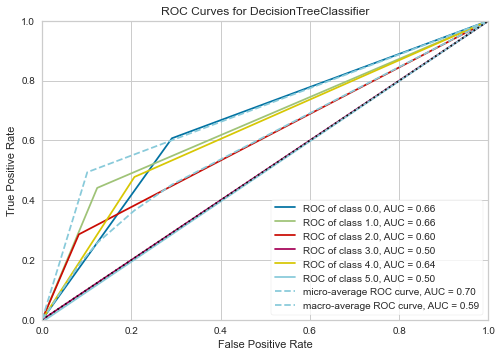

In [552]:
plot_model(dt)

## Knn model

In [571]:
from pycaret.classification import * 
clf1 = setup(data = df_lda, target = 'Label')
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5077,0.0000,0.3379,0.5027,0.4826,0.2791,0.2909
1,0.5538,0.7450,0.2960,0.5135,0.5255,0.3455,0.3529
2,0.4077,0.6396,0.2043,0.3648,0.3767,0.1262,0.1302
3,0.4385,0.6459,0.2313,0.4196,0.4240,0.1851,0.1876
4,0.5154,0.6745,0.2723,0.4672,0.4820,0.2835,0.2916
5,0.4846,0.6645,0.2734,0.4709,0.4684,0.2443,0.2496
6,0.4538,0.6937,0.2303,0.4187,0.4216,0.1936,0.2015
7,0.4574,0.0000,0.2923,0.4255,0.4302,0.1946,0.2002
8,0.4961,0.0000,0.3278,0.4946,0.4806,0.2585,0.2629
9,0.4651,0.0000,0.3058,0.4514,0.4518,0.2161,0.2196


In [572]:
import numpy as np
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5615,0.0000,0.3480,0.5244,0.5317,0.3452,0.3544
1,0.5538,0.7986,0.2830,0.4913,0.5093,0.3330,0.3438
2,0.4538,0.6774,0.2294,0.3905,0.4081,0.1821,0.1892
3,0.4846,0.6615,0.2546,0.4364,0.4572,0.2416,0.2444
4,0.5000,0.7102,0.2530,0.4387,0.4550,0.2510,0.2601
5,0.4769,0.6483,0.2464,0.4611,0.4426,0.2113,0.2230
6,0.5385,0.7265,0.2756,0.4926,0.4941,0.3058,0.3199
7,0.4341,0.0000,0.2490,0.3859,0.3737,0.1288,0.1393
8,0.5039,0.0000,0.3071,0.4491,0.4680,0.2561,0.2627
9,0.4806,0.0000,0.2837,0.4173,0.4308,0.2114,0.2230


### Confusion Matrix
https://github.com/pycaret/pycaret/blob/master/tutorials/Multiclass%20Classification%20Tutorial%20Level%20Beginner%20-%20MCLF101.ipynb

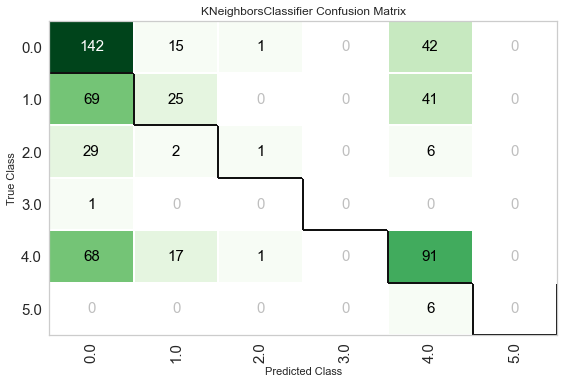

In [573]:
plot_model(tuned_knn, plot = 'confusion_matrix')

### Classification Report

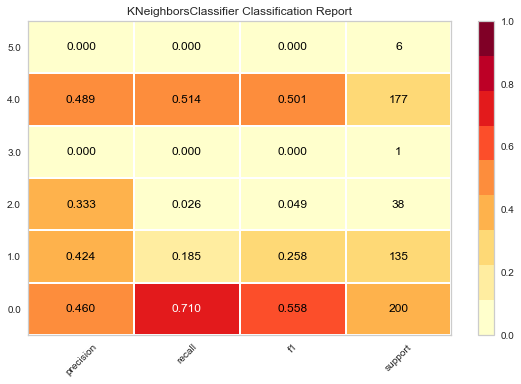

In [574]:
plot_model(tuned_knn, plot = 'class_report')

### Decision Boundary Plot

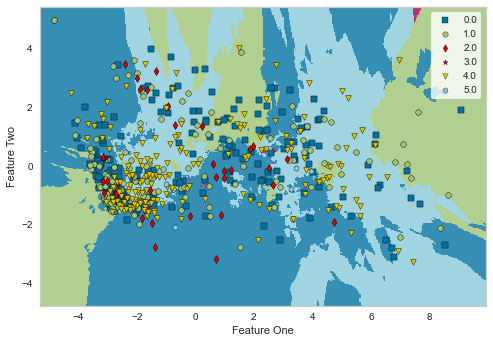

In [575]:
plot_model(tuned_knn, plot='boundary')

### Create models for stacking

In [122]:
# create models for stacking
from pycaret.classification import *
pce_1 = setup(data = df_lda, target = 'Label', session_id = 13, train_size = 0.8)
dt = create_model('dt')
rf = create_model('rf')
ada = create_model('ada')
ridge = create_model('ridge')
knn = create_model('knn')
# stack trained models
stacked_models = stack_models(estimator_list=[dt,rf,ada,ridge,knn])
#stacked_models = stack_models(estimator_list=[dt,rf])

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6054,0.8104,0.3547,0.5841,0.5775,0.3920,0.4044
1,0.5442,0.7602,0.3202,0.5194,0.5217,0.3001,0.3053
2,0.5170,0.7276,0.3069,0.4987,0.4991,0.2591,0.2630
3,0.6327,0.7747,0.3771,0.6136,0.6121,0.4364,0.4432
4,0.6259,0.7905,0.3730,0.6172,0.6047,0.4239,0.4334
5,0.5714,0.7472,0.3345,0.5530,0.5478,0.3401,0.3477
6,0.5986,0.7919,0.3549,0.5856,0.5769,0.3836,0.3925
7,0.6190,0.7768,0.3595,0.5822,0.5895,0.4138,0.4215
8,0.5238,0.7325,0.3090,0.5016,0.5034,0.2722,0.2769
9,0.5238,0.7309,0.3079,0.5636,0.4983,0.2607,0.2737


In [1]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase')

# launch eda
eda(display_format = 'bokeh')

,Description,Value
0,session_id,5651
1,Target,Purchase
2,Target Type,Binary
3,Label Encoded,"CH: 0, MM: 1"
4,Original Data,"(1070, 19)"
5,Missing Values,False
6,Numeric Features,13
7,Categorical Features,5
8,Ordinal Features,False
9,High Cardinality Features,False


Imported v0.1.55. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


Shape of your Data Set loaded: (1070, 19)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Id,1070,int64,0,0.000000,100.000000,0,possible ID column: drop
LoyalCH,553,float64,0,0.000000,51.682243,0,
WeekofPurchase,52,int64,0,0.000000,4.859813,0,
PriceDiff,36,float64,0,0.000000,3.364486,0,
SalePriceMM,18,float64,0,0.000000,1.682243,0,
PctDiscMM,18,float64,0,0.000000,1.682243,0,skewed column: cap or drop possible outliers
ListPriceDiff,18,float64,0,0.000000,1.682243,0,
SalePriceCH,13,float64,0,0.000000,1.214953,0,
PctDiscCH,13,float64,0,0.000000,1.214953,0,skewed column: cap or drop possible outliers
DiscCH,12,float64,0,0.000000,1.121495,0,skewed column: cap or drop possible outliers


    18 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Id']

################ Binary_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='y', options=['LoyalCH', 'SalePriceMM',...], value='LoyalCH')
    [1] ParamFunction(function)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['LoyalCH', 'PriceDiff'], value='LoyalCH')
        [1] Select(name='Y-Axis', options=['LoyalCH', 'PriceDiff'], value='PriceDiff')
        [2] Select(name='Color', options=['None', 'Purchase'], value='None')
    [1] ParamFunction(function)

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['WeekofPurchase', ...], value='WeekofPurchase', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['PriceMM', 'DiscCH', ...], value='PriceMM', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['WeekofPurchase', ...], value='WeekofPurchase')
        [1] Select(name='Y-Axis', options=['LoyalCH', 'PriceDiff'], value='LoyalCH')
    [1] ParamFunction(function)

Time to run AutoViz (in seconds) = 3


In [ ]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase')

# train model
lr = create_model('lr')

# launch dashboard
dashboard(lr)

### Cómo elimino el proceso que actualmente usa un puerto en localhost en Windows?
* https://stackoverflow.com/questions/39632667/how-do-i-kill-the-process-currently-using-a-port-on-localhost-in-windows
* netstat -ano | findstr :<PORT>
* taskkill /PID <PID> /F

In [ ]:
#pip uninstall mlflow 
#pip uninstall waitress -> #waitress 2.1.2
#pip install mlflow

In [1]:
import numpy as np
import pandas as pd
import mlflow
import warnings
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
warnings.filterwarnings("ignore")

In [2]:
from pycaret.datasets import get_data
from pycaret.classification import *

In [ ]:
from  mlflow.tracking import MlflowClient
client = MlflowClient()
experiments = client.list_experiments() # returns a list of mlflow.entities.Experiment
experiments

[<Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/0', creation_time=1664580121187, experiment_id='0', last_update_time=1664814415735, lifecycle_stage='active', name='diabetes0', tags={}>,
 <Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/1', creation_time=1664580257665, experiment_id='1', last_update_time=1664814351338, lifecycle_stage='active', name='diabetes1', tags={}>,
 <Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/2', creation_time=1664580752225, experiment_id='2', last_update_time=1664814354544, lifecycle_stage='active', name='diabetes2', tags={}>,
 <Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/3', creation_time=1664815758415, experiment_id='3', last_update_time=1664815758415, lifecycle_stage='active', name

In [ ]:
# Ejecutarn en consola bash
# init server
# mlflow ui

In [ ]:
# abrir el localhost:5000
# http://localhost:5000/#/experiments/0

In [ ]:
# load dataset
from pycaret.datasets import get_data
data = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data, target = 'Class variable', train_size=0.8, log_experiment = True, experiment_name = 'diabetes0')

# model training
best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.7737,0.8327,0.6286,0.7132,0.6639,0.4947,0.5000,0.0670
lr,Logistic Regression,0.7508,0.8131,0.5504,0.6987,0.6087,0.4303,0.4414,5.7240
rf,Random Forest Classifier,0.7491,0.8078,0.5461,0.6910,0.6051,0.4257,0.4352,0.1600
lightgbm,Light Gradient Boosting Machine,0.7444,0.7950,0.6147,0.6512,0.6298,0.4352,0.4375,0.0920
lda,Linear Discriminant Analysis,0.7443,0.8076,0.5374,0.6871,0.5965,0.4143,0.4253,0.0090
ridge,Ridge Classifier,0.7426,0.0000,0.5232,0.6905,0.5888,0.4073,0.4196,0.0070
et,Extra Trees Classifier,0.7329,0.7753,0.4868,0.6743,0.5614,0.3779,0.3902,0.1390
xgboost,Extreme Gradient Boosting,0.7281,0.7872,0.5831,0.6264,0.6003,0.3956,0.3986,0.4590
ada,Ada Boost Classifier,0.7265,0.7895,0.5461,0.6445,0.5860,0.3845,0.3909,0.0660
knn,K Neighbors Classifier,0.7116,0.7399,0.5318,0.6071,0.5623,0.3501,0.3541,0.0180


In [ ]:
print(best_model)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=6019, verbose=0,
                       warm_start=False)


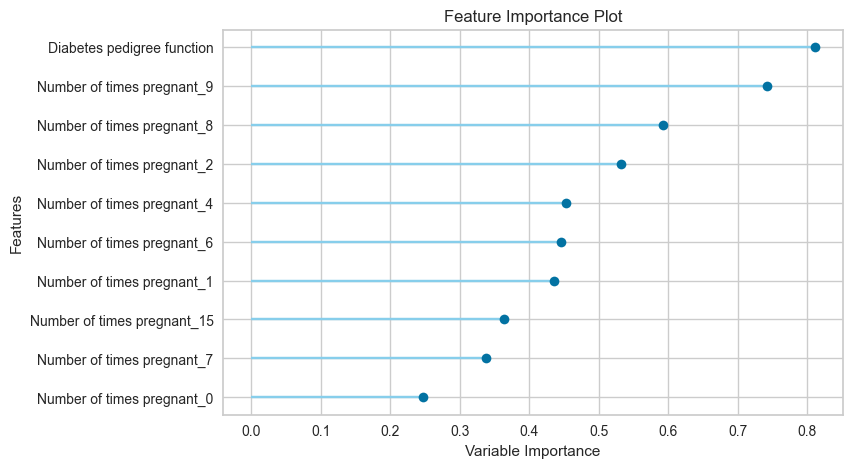

In [ ]:
# check feature importance
#print(best_model)
#plot_model(best_model, plot = 'feature')

In [ ]:
# finalize the model
final_best = finalize_model(best_model)
final_best

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=2587, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
# save model to disk
#save_model(final_best, 'diabetes-pipeline')

# Ejecución de Distintos Modelos

In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',log_experiment = True, experiment_name = 'diabetes1')

# compare models
best = compare_models(include = ['lr', 'dt', 'lightgbm'])

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7803,0.8365,0.6208,0.7407,0.6707,0.5085,0.5165,0.1670
lightgbm,Light Gradient Boosting Machine,0.7355,0.8076,0.6161,0.6509,0.6284,0.4243,0.4279,0.0300
dt,Decision Tree Classifier,0.7188,0.6961,0.6147,0.6195,0.6133,0.3928,0.3957,0.0110


In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',log_experiment = True, experiment_name = 'diabetes2')

# compare models
best = compare_models(probability_threshold = 0.25) #cross_validation=False

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.7768,0.0000,0.5444,0.7120,0.6062,0.4563,0.4709,0.0030
lda,Linear Discriminant Analysis,0.7543,0.8424,0.7755,0.6033,0.6735,0.4842,0.4988,0.0040
gbc,Gradient Boosting Classifier,0.7282,0.8370,0.7814,0.5660,0.6536,0.4433,0.4586,0.0290
xgboost,Extreme Gradient Boosting,0.7266,0.8070,0.6709,0.5714,0.6124,0.4055,0.4122,0.2340
lightgbm,Light Gradient Boosting Machine,0.7265,0.8164,0.6941,0.5744,0.6213,0.4137,0.4241,0.0320
lr,Logistic Regression,0.7263,0.8467,0.7925,0.5627,0.6545,0.4418,0.4619,2.9240
nb,Naive Bayes,0.7057,0.7572,0.2814,0.5840,0.3672,0.2127,0.2396,0.0040
dt,Decision Tree Classifier,0.7002,0.6540,0.5216,0.5556,0.5251,0.3116,0.3194,0.0040
knn,K Neighbors Classifier,0.6985,0.7758,0.7111,0.5289,0.6019,0.3698,0.3847,0.0080
rf,Random Forest Classifier,0.6853,0.8260,0.8503,0.5176,0.6403,0.3949,0.4325,0.0540


## Formas de listar los experimentos existentes

In [10]:
# Forma 1:
!mlflow experiments list

Experiment Id    Name       Artifact Location                                                                     
---------------  ---------  --------------------------------------------------------------------------------------
0                diabetes0  file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/0
1                diabetes1  file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/1
2                diabetes2  file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/2


C:\Users\jorgeantonio.lopez\Anaconda3\envs\Pycaret_Challenge_Reviews\lib\site-packages\mlflow\experiments.py:64: FutureWarning: ``mlflow.tracking.fluent.list_experiments`` is deprecated. This method will be removed in a future release. Use ``search_experiments()`` instead.
  experiments = mlflow.list_experiments(view_type)
C:\Users\jorgeantonio.lopez\Anaconda3\envs\Pycaret_Challenge_Reviews\lib\site-packages\mlflow\tracking\fluent.py:1066: FutureWarning: ``mlflow.tracking.client.MlflowClient.list_experiments`` is deprecated. This method will be removed in a future release. Use ``search_experiments()`` instead.
  return MlflowClient().list_experiments(


In [12]:
# Forma 2:
experiments = mlflow.list_experiments()
experiments

[<Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/0', creation_time=1664580121187, experiment_id='0', last_update_time=1664580121187, lifecycle_stage='active', name='diabetes0', tags={}>,
 <Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/1', creation_time=1664580257665, experiment_id='1', last_update_time=1664580257665, lifecycle_stage='active', name='diabetes1', tags={}>,
 <Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/2', creation_time=1664580752225, experiment_id='2', last_update_time=1664580752225, lifecycle_stage='active', name='diabetes2', tags={}>]

In [7]:
# Forma 3:
# Consulta y comparación de experimentos y ejecuciones con MLflow
# #https://learn.microsoft.com/es-es/azure/machine-learning/how-to-track-experiments-mlflow
#from mlflow.entities import ViewType

#experiments = mlflow.list_experiments(view_type=ViewType.ALL)
experiments = mlflow.list_experiments()
for exp in experiments:
    print(exp.name)

diabetes0
diabetes1
diabetes2


## Buscar experimento por su nombre

In [14]:
exp = mlflow.get_experiment_by_name('diabetes2')
print(exp)

<Experiment: artifact_location='file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/2', creation_time=1664580752225, experiment_id='2', last_update_time=1664580752225, lifecycle_stage='active', name='diabetes2', tags={}>


In [ ]:
# ejecutar en terminal
# mlflow gc --backend-store-uri 'file:///C:/Archivos Globant/Globant/Challenge/Challenge - NLP reviews/mlruns/0'

# Eliminar un experimento de UI MLFLOW

In [24]:
# Enviar experimento a la carpeta de "trash"
# Fuente: https://mlflow.org/docs/latest/python_api/mlflow.html#mlflow.delete_experiment
import mlflow

#experiment_id = mlflow.create_experiment("New Experiment")
experiment_id = '2'
mlflow.delete_experiment(experiment_id)

# Examine the deleted experiment details.
experiment = mlflow.get_experiment(experiment_id)
print("Name: {}".format(experiment.name))
print("Artifact Location: {}".format(experiment.artifact_location))
print("Lifecycle_stage: {}".format(experiment.lifecycle_stage))
print("Last Updated timestamp: {}".format(experiment.last_update_time))

Name: diabetes2
Artifact Location: file:///C:/Archivos%20Globant/Globant/Challenge/Challenge%20-%20NLP%20reviews/mlruns/2
Lifecycle_stage: deleted
Last Updated timestamp: 1664814354544


In [ ]:
# Eliminar toda la carpeta de trash
#rm -rf C:/Archivos Globant/Globant/Challenge/Challenge - NLP reviews/mlruns/.trash/*

## Recuperar un experimento

In [25]:
!mlflow experiments list

C:\Users\jorgeantonio.lopez\Anaconda3\envs\Pycaret_Challenge_Reviews\lib\site-packages\mlflow\experiments.py:64: FutureWarning: ``mlflow.tracking.fluent.list_experiments`` is deprecated. This method will be removed in a future release. Use ``search_experiments()`` instead.
  experiments = mlflow.list_experiments(view_type)
C:\Users\jorgeantonio.lopez\Anaconda3\envs\Pycaret_Challenge_Reviews\lib\site-packages\mlflow\tracking\fluent.py:1066: FutureWarning: ``mlflow.tracking.client.MlflowClient.list_experiments`` is deprecated. This method will be removed in a future release. Use ``search_experiments()`` instead.
  return MlflowClient().list_experiments(


In [ ]:
# Para recuerar un experimento, se debe de correr en la terminal
# mlflow experiments restore --experiment-id '0'
# mlflow experiments restore --experiment-id '1'
# mlflow experiments restore --experiment-id '2'

### create_model

### Esta función entrena y evalúa el rendimiento de un estimador determinado mediante validación cruzada. El resultado de esta función es una cuadrícula de puntuación con puntuaciones de CV por pliegue. Se puede acceder a las métricas evaluadas durante CV mediante la función get_metrics. Las métricas personalizadas se pueden agregar o eliminar mediante las funciones add_metric y remove_metric. Se puede acceder a todos los modelos disponibles utilizando la función de modelos.

In [27]:
# load dataset 
from pycaret.datasets import get_data 
diabetes = get_data('diabetes') 

# init setup
from pycaret.classification import * 
clf1 = setup(data = diabetes, target = 'Class variable', log_experiment = True, experiment_name = 'diabetes3')

# check all metrics used for model evaluation
#metrics_pycaret = get_metrics()
get_metrics()

# add Log Loss metric in pycaret
from sklearn.metrics import log_loss
add_metric('logloss', 'LogLoss', log_loss, greater_is_better=False)

# compare baseline models
#best = compare_models()

# train logistic regression
lr = create_model('lr')

# Access the scoring grid
# The performance metrics/scoring grid you see after the create_model is only displayed and is not returned. 
# #As such, if you want to access that grid as pandas.DataFrame you will have to use pull command after create_model.

# access the scoring grid
dt_results = pull()
print(dt_results)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
Fold,,,,,,,,
0,0.7407,0.7559,0.5500,0.6875,0.6111,0.4202,0.4261,8.9546
1,0.7778,0.8676,0.6000,0.7500,0.6667,0.5031,0.5101,7.6753
2,0.8148,0.8471,0.7000,0.7778,0.7368,0.5946,0.5966,6.3961
3,0.7222,0.7603,0.5500,0.6471,0.5946,0.3854,0.3884,9.5942
4,0.8148,0.8882,0.5500,0.9167,0.6875,0.5673,0.6047,6.3961
5,0.7593,0.8556,0.5789,0.6875,0.6286,0.4524,0.4561,8.3150
6,0.7407,0.8015,0.4211,0.7273,0.5333,0.3710,0.3976,8.9545
7,0.7736,0.8622,0.7368,0.6667,0.7000,0.5189,0.5206,7.8202
8,0.7358,0.7229,0.5263,0.6667,0.5882,0.3977,0.4037,9.1235


      Accuracy     AUC  Recall   Prec.      F1   Kappa     MCC  LogLoss
Fold                                                                   
0       0.7407  0.7559  0.5500  0.6875  0.6111  0.4202  0.4261   8.9546
1       0.7778  0.8676  0.6000  0.7500  0.6667  0.5031  0.5101   7.6753
2       0.8148  0.8471  0.7000  0.7778  0.7368  0.5946  0.5966   6.3961
3       0.7222  0.7603  0.5500  0.6471  0.5946  0.3854  0.3884   9.5942
4       0.8148  0.8882  0.5500  0.9167  0.6875  0.5673  0.6047   6.3961
5       0.7593  0.8556  0.5789  0.6875  0.6286  0.4524  0.4561   8.3150
6       0.7407  0.8015  0.4211  0.7273  0.5333  0.3710  0.3976   8.9545
7       0.7736  0.8622  0.7368  0.6667  0.7000  0.5189  0.5206   7.8202
8       0.7358  0.7229  0.5263  0.6667  0.5882  0.3977  0.4037   9.1235
9       0.8491  0.9628  0.7895  0.7895  0.7895  0.6718  0.6718   5.2135
Mean    0.7729  0.8324  0.6003  0.7317  0.6536  0.4883  0.4976   7.8443
Std     0.0394  0.0686  0.1049  0.0772  0.0732  0.0953  0.0948  

In [29]:
# check type
print(type(dt_results))
# select only Mean and SD
dt_results.loc[['Mean', 'Std']]

<class 'pandas.core.frame.DataFrame'>


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,LogLoss
Fold,,,,,,,,
Mean,0.7729,0.8324,0.6003,0.7317,0.6536,0.4883,0.4976,7.8443
Std,0.0394,0.0686,0.1049,0.0772,0.0732,0.0953,0.0948,1.3613


### Return train score
* The default scoring grid shows the performance metrics on the validation set by fold. If you want to see the performance metrics on the training set by fold as well to examine the over-fitting/under-fitting you can use return_train_score parameter.

* train model without cv: lr = create_model('lr', return_train_score = True)

In [30]:
# see the model
print(lr)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=6433, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


### Train models in a loop
* You can use the create_model function in a loop to train multiple models or even the same model with different configurations and compare their results.

In [32]:
# load dataset 
from pycaret.datasets import get_data 
diabetes = get_data('diabetes') 

# init setup
from pycaret.classification import * 
clf1 = setup(data = diabetes, target = 'Class variable', log_experiment = True, experiment_name = 'diabetes4')

# train models in a loop
lgbs  = [create_model('lightgbm', learning_rate = i) for i in np.arange(0.1,1, 0.1)]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7222,0.7654,0.5789,0.6111,0.5946,0.3836,0.3839
1,0.7037,0.7654,0.4737,0.6000,0.5294,0.3175,0.3223
2,0.7778,0.8602,0.5789,0.7333,0.6471,0.4882,0.4954
3,0.7222,0.7519,0.4211,0.6667,0.5161,0.3350,0.3524
4,0.7593,0.7985,0.7895,0.6250,0.6977,0.5021,0.5116
5,0.7222,0.7218,0.5789,0.6111,0.5946,0.3836,0.3839
6,0.7037,0.7594,0.4211,0.6154,0.5000,0.2998,0.3107
7,0.7547,0.7571,0.5556,0.6667,0.6061,0.4301,0.4339
8,0.6415,0.6857,0.5000,0.4737,0.4865,0.2114,0.2116


In [33]:
print(type(lgbs))

print(len(lgbs))

<class 'list'>
9


### If you want to keep track of metrics as well, as in most cases, this is how you can do it.

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6296,0.7044,0.4000,0.5000,0.4444,0.1718,0.1742
1,0.7963,0.8015,0.7000,0.7368,0.7179,0.5587,0.5591
2,0.7407,0.8000,0.6500,0.6500,0.6500,0.4441,0.4441
3,0.6852,0.7414,0.4737,0.5625,0.5143,0.2839,0.2862
4,0.7593,0.8090,0.7368,0.6364,0.6829,0.4906,0.4940
5,0.6667,0.7203,0.5263,0.5263,0.5263,0.2692,0.2692
6,0.7222,0.7880,0.5789,0.6111,0.5946,0.3836,0.3839
7,0.7547,0.8158,0.6842,0.6500,0.6667,0.4728,0.4732
8,0.7736,0.8111,0.6316,0.7059,0.6667,0.4960,0.4978


<AxesSubplot:>

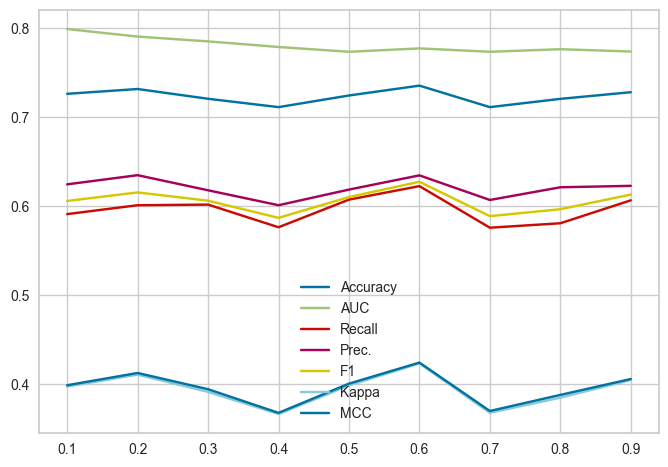

In [34]:
# load dataset 
from pycaret.datasets import get_data 
diabetes = get_data('diabetes') 

# init setup
from pycaret.classification import * 
clf1 = setup(data = diabetes, target = 'Class variable',log_experiment = True, experiment_name = 'diabetes5')

# start a loop
models = []
results = []

for i in np.arange(0.1,1, 0.1):
    model = create_model('lightgbm', learning_rate = i)
    model_results = pull().loc[['Mean']]
    models.append(model)
    results.append(model_results)
    
results = pd.concat(results, axis=0)
results.index = np.arange(0.1,1, 0.1)
results.plot()

## Train custom models
* You can use your own custom models for training or models from other libraries which are not part of pycaret. As long as their API is consistent with sklearn, it will work like a breeze.

In [ ]:
#pip install gplearn

In [5]:
from gplearn.genetic import SymbolicClassifier

In [4]:
# load dataset 
from pycaret.datasets import get_data 
diabetes = get_data('diabetes') 

# init setup
#from pycaret.classification import * 
clf1 = setup(data = diabetes, target = 'Class variable',log_experiment = True, experiment_name = 'diabetes6')

# import custom model
from gplearn.genetic import SymbolicClassifier
sc = SymbolicClassifier()

# train custom model
sc_trained = create_model(sc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6667,0.6586,0.1579,0.6000,0.2500,0.1212,0.1660
1,0.6296,0.5759,0.2105,0.4444,0.2857,0.0769,0.0867
2,0.6481,0.5722,0.0526,0.5000,0.0952,0.0302,0.0608
3,0.7037,0.7368,0.3158,0.6667,0.4286,0.2615,0.2948
4,0.6667,0.6586,0.2632,0.5556,0.3571,0.1692,0.1908
5,0.7222,0.6451,0.3684,0.7000,0.4828,0.3170,0.3476
6,0.6481,0.6887,0.1053,0.5000,0.1739,0.0587,0.0877
7,0.6981,0.6508,0.1111,1.0000,0.2000,0.1417,0.2761
8,0.6604,0.6889,0.1667,0.5000,0.2500,0.0966,0.1210


In [5]:
print(type(sc_trained))
print(sc_trained)

<class 'gplearn.genetic.SymbolicClassifier'>
add(sub(div(sub(X5, div(X3, X12)), div(X4, X20)), X8), sub(X13, X14))


In [1]:
import numpy as np
import pandas as pd
import mlflow
import warnings
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
warnings.filterwarnings("ignore")
from pycaret.datasets import get_data
from pycaret.classification import *

In [2]:
from pycaret.datasets import get_data
from pycaret.classification import *

# Optimize

### tune_model
* This function tunes the hyperparameters of the model. The output of this function is a scoring grid with cross-validated scores by fold. The best model is selected based on the metric defined in optimize parameter. Metrics evaluated during cross-validation can be accessed using the get_metrics function. Custom metrics can be added or removed using add_metric and remove_metric function.

In [20]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(data = boston, target = 'medv', log_experiment = True, experiment_name = 'boston1')

all_metrics = get_metrics()

# train model
dt = create_model('dt', random_state=7743, )
# Mean	2.9743	21.2542	4.3761	0.7029	0.1883	0.1467


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.3222,26.0872,5.1076,0.6717,0.2034,0.1533
1,3.5917,24.0414,4.9032,0.7298,0.2164,0.1689
2,3.7333,31.6672,5.6274,0.6626,0.2669,0.2161
3,2.9528,16.4586,4.0569,0.7867,0.1885,0.1373
4,2.1286,10.4889,3.2387,0.8153,0.1257,0.0968
5,3.0286,14.7663,3.8427,0.6471,0.2268,0.1909
6,2.9600,14.6851,3.8321,0.7807,0.1568,0.1481
7,2.3057,10.2340,3.1991,0.7384,0.1533,0.1124
8,3.3629,24.4083,4.9405,0.6918,0.1950,0.1522


In [18]:
all_metrics

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Custom
ID,,,,,,,,
mae,MAE,MAE,<function mean_absolute_error at 0x000001AF0C5...,neg_mean_absolute_error,pred,{},False,False
mse,MSE,MSE,<function mean_squared_error at 0x000001AF0C51...,neg_mean_squared_error,pred,{},False,False
rmse,RMSE,RMSE,<function mean_squared_error at 0x000001AF0C51...,neg_root_mean_squared_error,pred,{'squared': False},False,False
r2,R2,R2,<function r2_score at 0x000001AF0C51F9D0>,r2,pred,{},True,False
rmsle,RMSLE,RMSLE,<function RMSLEMetricContainer.__init__.<local...,"make_scorer(root_mean_squared_log_error, great...",pred,{},False,False
mape,MAPE,MAPE,<function MAPEMetricContainer.__init__.<locals...,"make_scorer(mean_absolute_percentage_error, gr...",pred,{},False,False


# Choosing the metric
* When you are tuning the hyperparameters of the model, you must know which metric to optimize for. That can be defined under optimize parameter. By default, it is set to Accuracy for classification experiments and R2 for regression.

In [21]:
# tune model
tuned_dt = tune_model(dt, optimize = 'MAE')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.1002,26.5843,5.1560,0.6655,0.1786,0.1334
1,4.0036,30.3431,5.5085,0.6590,0.2315,0.1885
2,2.7956,11.9848,3.4619,0.8723,0.1983,0.1669
3,2.9152,15.1809,3.8963,0.8033,0.1501,0.1280
4,2.7068,20.8364,4.5647,0.6331,0.1658,0.1303
5,2.3494,9.4399,3.0724,0.7744,0.1897,0.1517
6,3.4706,18.6819,4.3223,0.7210,0.1839,0.1785
7,2.4634,9.9026,3.1468,0.7469,0.1416,0.1153
8,2.6527,10.5414,3.2467,0.8669,0.1620,0.1310


In [ ]:
#Mean	2.9263	18.5267	4.1947	0.7443	0.1849	0.1452

In [22]:
print(dt)
print(tuned_dt)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=7743, splitter='best')
DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=8,
                      max_features=1.0, max_leaf_nodes=None,
                      min_impurity_decrease=0, min_impurity_split=None,
                      min_samples_leaf=6, min_samples_split=10,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=7743, splitter='best')


# Passing custom grid

* The tuning grid for hyperparameters is already defined by PyCaret for all the models in the library. However, if you wish you can define your own search space by passing a custom grid using custom_grid parameter. 

In [23]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv',log_experiment = True, experiment_name = 'boston2')

# train model
dt = create_model('dt')

# define search space
params = {"max_depth": np.random.randint(1, (len(boston.columns)*.85),20),
          "max_features": np.random.randint(1, len(boston.columns),20),
          "min_samples_leaf": [2,3,4,5,6]}
          
# tune model
tuned_dt = tune_model(dt, custom_grid = params)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2.4496,9.2342,3.0388,0.8599,0.1545,0.1293
1,2.9681,24.3962,4.9393,0.7696,0.1806,0.1485
2,3.0483,18.1136,4.2560,0.5847,0.1937,0.1520
3,3.7321,43.6450,6.6064,0.5000,0.2285,0.1474
4,2.9333,15.7665,3.9707,0.7984,0.1529,0.1305
5,2.5323,10.4000,3.2249,0.9122,0.1597,0.1377
6,2.7317,11.8744,3.4459,0.9013,0.1582,0.1301
7,2.9558,19.2822,4.3912,0.8380,0.2340,0.1822
8,3.5553,25.4158,5.0414,0.6372,0.1991,0.1684


# Changing the search algorithm

* PyCaret integrates seamlessly with many different libraries for hyperparameter tuning. This gives you access to many different types of search algorithms including random, bayesian, optuna, TPE, and a few others. All of this just by changing a parameter. By default, PyCaret using RandomGridSearch from the sklearn and you can change that by using search_library and search_algorithm parameter in the tune_model function.

In [6]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv',log_experiment = True, experiment_name = 'boston3')

# train model
dt = create_model('dt')

# search_library: str, default = 'scikit-learn'
#    The search library used for tuning hyperparameters. Possible values:
# 'scikit-learn' - default, requires no further installation https://github.com/scikit-learn/scikit-learn
# 'scikit-optimize' - pip install scikit-optimize https://scikit-optimize.github.io/stable/
# 'tune-sklearn' - pip install tune-sklearn ray[tune] https://github.com/ray-project/tune-sklearn
# 'optuna' - pip install optuna https://optuna.org/

# tune model sklearn
tune_model(dt, search_library = 'scikit-learn')

# tune model optuna
tune_model(dt, search_library = 'optuna')

# tune model scikit-optimize
tune_model(dt, search_library = 'scikit-optimize')

# tune model tune-sklearn
#tune_model(dt, search_library = 'tune-sklearn', search_algorithm = 'bayesian')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.2048,19.6541,4.4333,0.7612,0.1818,0.1493
1,2.5797,12.3701,3.5171,0.7917,0.1795,0.1492
2,3.4366,22.0631,4.6971,0.7367,0.2294,0.1710
3,2.3855,13.2620,3.6417,0.8512,0.1399,0.1056
4,3.9643,39.6618,6.2978,0.3667,0.2560,0.2020
5,3.3838,23.1348,4.8099,0.7174,0.1658,0.1400
6,2.5410,10.3005,3.2094,0.9249,0.1527,0.1228
7,3.8370,26.7444,5.1715,0.7805,0.2030,0.1790
8,2.7735,15.9830,3.9979,0.7637,0.1727,0.1442


DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=13,
                      max_features=0.5260679247644262, max_leaf_nodes=None,
                      min_impurity_decrease=0.00010709152597120749,
                      min_impurity_split=None, min_samples_leaf=3,
                      min_samples_split=9, min_weight_fraction_leaf=0.0,
                      presort='deprecated', random_state=3027, splitter='best')

# Access the tuner

* By default PyCaret's tune_model function only returns the best model as selected by the tuner. Sometimes you may need access to the tuner object as it may contain important attributes, you can use return_tuner parameter.

In [9]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv', log_experiment = True, experiment_name = 'boston4')

# train model
dt = create_model('dt')

# tune model and return tuner
tuned_model, tuner = tune_model(dt, return_tuner=True)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.0544,15.0764,3.8828,0.8172,0.2023,0.1779
1,2.5267,13.8284,3.7187,0.8464,0.1846,0.1203
2,2.6530,14.5952,3.8204,0.8569,0.1999,0.1530
3,2.4795,12.0782,3.4754,0.8352,0.1247,0.0979
4,3.1465,22.7698,4.7718,0.7113,0.2152,0.1412
5,2.4671,10.6423,3.2622,0.8648,0.1568,0.1290
6,2.4667,15.3127,3.9131,0.7798,0.1803,0.1418
7,3.5955,31.9539,5.6528,0.6524,0.2006,0.1621
8,2.9857,14.7593,3.8418,0.6954,0.1865,0.1417


In [10]:
type(tuned_model), type(tuner)

(sklearn.tree._classes.DecisionTreeRegressor,
 sklearn.model_selection._search.RandomizedSearchCV)

In [11]:
print(tuner)

RandomizedSearchCV(cv=KFold(n_splits=10, random_state=None, shuffle=False),
                   error_score=nan,
                   estimator=Pipeline(memory=None,
                                      steps=[('empty_step', 'passthrough'),
                                             ('actual_estimator',
                                              DecisionTreeRegressor(ccp_alpha=0.0,
                                                                    criterion='mse',
                                                                    max_depth=None,
                                                                    max_features=None,
                                                                    max_leaf_nodes=None,
                                                                    min_impurity_decrease=0.0,
                                                                    min_impurity_split=None,
                                                                    min_samples

# Automatically choose better

* Often times the tune_model will not improve the model performance. In fact, it may end up making performance worst than the model with default hyperparameters. This may be problematic when you are not actively experimenting in the Notebook rather you have a python script that runs a workflow of create_model --> tune_model or compare_models --> tune_model. To overcome this issue, you can use choose_better. When set to True it will always return a better performing model meaning that if hyperparameter tuning doesn't improve the performance, it will return the input model.

In [12]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv', log_experiment = True, experiment_name = 'boston5')

# train model
dt = create_model('dt')

# tune model
dt = tune_model(dt, choose_better = True)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.5268,41.2503,6.4226,0.4859,0.2171,0.1657
1,2.7526,12.5633,3.5445,0.8338,0.1663,0.1292
2,4.7028,54.7335,7.3982,0.6417,0.2602,0.2071
3,3.5583,31.8064,5.6397,0.5735,0.2109,0.1549
4,2.7543,11.6677,3.4158,0.8785,0.1286,0.1121
5,2.8265,31.5377,5.6158,0.4149,0.2183,0.1627
6,2.6909,12.6775,3.5605,0.7827,0.2115,0.1662
7,1.9940,6.3952,2.5289,0.9011,0.1328,0.1099
8,3.4077,36.9851,6.0815,0.4460,0.2244,0.1534


In [8]:
print(dt)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=8,
                      max_features='sqrt', max_leaf_nodes=None,
                      min_impurity_decrease=0, min_impurity_split=None,
                      min_samples_leaf=3, min_samples_split=9,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=4972, splitter='best')


## ensemble_model
* This function ensembles a given estimator. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the get_metrics function. Custom metrics can be added or removed using add_metric and remove_metric function.

# Method: Bagging
* Bagging, also known as Bootstrap aggregating, is a machine learning ensemble meta-algorithm designed to improve the stability and accuracy of machine learning algorithms used in statistical classification and regression. It also reduces variance and helps to avoid overfitting. Although it is usually applied to decision tree methods, it can be used with any type of method. Bagging is a special case of the model averaging approach.

# Method: Boosting
* Boosting is an ensemble meta-algorithm for primarily reducing bias and variance in supervised learning. Boosting is in the family of machine learning algorithms that convert weak learners to strong ones. A weak learner is defined to be a classifier that is only slightly correlated with the true classification (it can label examples better than random guessing). In contrast, a strong learner is a classifier that is arbitrarily well-correlated with the true classification.

# Choosing the method
* There are two possible ways you can ensemble your machine learning model with ensemble_model. You can define this in the method parameter.

In [13]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv', log_experiment = True, experiment_name = 'boston6')

# train model
dt = create_model('dt')

# ensemble model
bagged_dt = ensemble_model(dt, method = 'Bagging') # by default method = "Bagging", yo can charge this for Boosting

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2.3467,12.3589,3.5155,0.8429,0.1485,0.1079
1,2.8464,29.0971,5.3942,0.6541,0.1876,0.1343
2,2.1192,8.4061,2.8993,0.8943,0.1070,0.0915
3,1.8744,7.4780,2.7346,0.9115,0.1204,0.0965
4,2.8411,18.6229,4.3154,0.7819,0.1954,0.1289
5,2.5060,11.3716,3.3722,0.8176,0.1664,0.1308
6,2.4086,10.2714,3.2049,0.8448,0.1612,0.1410
7,2.1300,7.3867,2.7178,0.9208,0.1318,0.1083
8,2.3809,10.5832,3.2532,0.9021,0.1272,0.1085


In [15]:
print(type(bagged_dt))
print(bagged_dt)

<class 'sklearn.ensemble._bagging.BaggingRegressor'>
BaggingRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                      criterion='mse',
                                                      max_depth=None,
                                                      max_features=None,
                                                      max_leaf_nodes=None,
                                                      min_impurity_decrease=0.0,
                                                      min_impurity_split=None,
                                                      min_samples_leaf=1,
                                                      min_samples_split=2,
                                                      min_weight_fraction_leaf=0.0,
                                                      presort='deprecated',
                                                      random_state=8249,
                                               

In [16]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv', log_experiment = True, experiment_name = 'boston7')

# train model
dt = create_model('dt')

# ensemble model
boosted_dt = ensemble_model(dt, method = 'Boosting')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1.7833,6.0322,2.4561,0.9397,0.1120,0.0912
1,1.8667,5.9583,2.4410,0.8191,0.1440,0.1082
2,2.2972,12.3919,3.5202,0.6475,0.2013,0.1485
3,1.9611,7.4883,2.7365,0.9050,0.1158,0.0896
4,2.6600,10.6689,3.2663,0.8491,0.1636,0.1434
5,2.7057,12.5077,3.5366,0.8716,0.1659,0.1436
6,3.0543,22.6129,4.7553,0.7501,0.2316,0.1664
7,3.0543,18.0346,4.2467,0.8119,0.2123,0.1551
8,3.2886,27.4877,5.2429,0.7644,0.1591,0.1126


In [17]:
print(type(boosted_dt))
print(boosted_dt)

<class 'sklearn.ensemble._weight_boosting.AdaBoostRegressor'>
AdaBoostRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                       criterion='mse',
                                                       max_depth=None,
                                                       max_features=None,
                                                       max_leaf_nodes=None,
                                                       min_impurity_decrease=0.0,
                                                       min_impurity_split=None,
                                                       min_samples_leaf=1,
                                                       min_samples_split=2,
                                                       min_weight_fraction_leaf=0.0,
                                                       presort='deprecated',
                                                       random_state=7767,
                          

# Increasing the estimators
* By default, PyCaret uses 10 estimators for both Bagging or Boosting. You can increase that by changing n_estimators parameter.

In [18]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv')

# train model
dt = create_model('dt')

# ensemble model
ensemble_model(dt, n_estimators = 100)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,1.6676,5.2817,2.2982,0.9405,0.1184,0.0877
1,2.2541,9.3205,3.0530,0.8266,0.1624,0.1350
2,2.7018,25.0309,5.0031,0.7717,0.1568,0.1000
3,2.0269,7.9090,2.8123,0.8864,0.1262,0.0958
4,2.7197,16.6734,4.0833,0.8742,0.1908,0.1455
5,2.4562,9.9270,3.1507,0.8676,0.1245,0.1077
6,3.0263,27.8922,5.2813,0.3970,0.2085,0.1619
7,3.2103,20.9075,4.5725,0.5040,0.2185,0.1793
8,2.1528,9.9343,3.1519,0.8784,0.1755,0.1207


BaggingRegressor(base_estimator=DecisionTreeRegressor(ccp_alpha=0.0,
                                                      criterion='mse',
                                                      max_depth=None,
                                                      max_features=None,
                                                      max_leaf_nodes=None,
                                                      min_impurity_decrease=0.0,
                                                      min_impurity_split=None,
                                                      min_samples_leaf=1,
                                                      min_samples_split=2,
                                                      min_weight_fraction_leaf=0.0,
                                                      presort='deprecated',
                                                      random_state=934,
                                                      splitter='best'),
                 bootstrap=Tr

# Automatically choose better
* Often times the ensemble_model will not improve the model performance. In fact, it may end up making performance worst than the model with ensembling. This may be problematic when you are not actively experimenting in the Notebook rather you have a python script that runs a workflow of create_model --> ensemble_model or compare_models --> ensemble_model. To overcome this issue, you can use choose_better. When set to True it will always return a better performing model meaning that if hyperparameter tuning doesn't improve the performance, it will return the input model.

In [19]:
# load dataset
from pycaret.datasets import get_data 
boston = get_data('boston') 

# init setup
from pycaret.regression import * 
reg1 = setup(boston, target = 'medv')

# train model
lr = create_model('lr')

# ensemble model
ensemble_model(lr, choose_better = True)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,5.0235,49.2704,7.0193,0.6681,0.2758,0.2248
1,3.5992,20.7163,4.5515,0.6113,0.1963,0.1716
2,3.6113,33.6672,5.8023,0.6415,0.3511,0.1947
3,2.6939,12.3839,3.5191,0.8041,0.1733,0.1207
4,3.0933,18.0526,4.2488,0.7151,0.2103,0.1536
5,3.3040,21.9542,4.6855,0.6920,0.2021,0.1706
6,2.8116,16.8673,4.1070,0.4402,0.2997,0.1500
7,3.5531,23.2412,4.8209,0.7277,0.2071,0.1851
8,2.8214,15.7621,3.9701,0.8083,0.1758,0.1390


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=-1, normalize=False)

Notice that with choose_better = True the model returned from the ensemble_model is a simple LinearRegression instead of BaggedRegressor. This is because the performance of the model didn't improve after ensembling and hence input model is returned.

## blend_models
* This function trains a Soft Voting / Majority Rule classifier for select models passed in the estimator_list parameter. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the get_metrics function. Custom metrics can be added or removed using add_metric and remove_metric function.

In [22]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', log_experiment = True, experiment_name = 'diabetes7')

# train a few models
#lr = create_model('lr')
dt = create_model('dt')
knn = create_model('knn')
ridge = create_model('ridge')

# blend models
blender = blend_models([dt, knn,ridge]) # Changing the fold param: fold = 5

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7593,0.0000,0.4737,0.7500,0.5806,0.4236,0.4456
1,0.7778,0.0000,0.5789,0.7333,0.6471,0.4882,0.4954
2,0.7778,0.0000,0.6842,0.6842,0.6842,0.5128,0.5128
3,0.7963,0.0000,0.6500,0.7647,0.7027,0.5493,0.5535
4,0.7778,0.0000,0.6000,0.7500,0.6667,0.5031,0.5101
5,0.6296,0.0000,0.4500,0.5000,0.4737,0.1892,0.1898
6,0.7222,0.0000,0.3500,0.7778,0.4828,0.3284,0.3773
7,0.7736,0.0000,0.5789,0.7333,0.6471,0.4838,0.4911
8,0.6604,0.0000,0.5263,0.5263,0.5263,0.2616,0.2616


In [23]:
print(type(blender))
print(blender)

<class 'sklearn.ensemble._voting.VotingClassifier'>
VotingClassifier(estimators=[('dt',
                              DecisionTreeClassifier(ccp_alpha=0.0,
                                                     class_weight=None,
                                                     criterion='gini',
                                                     max_depth=None,
                                                     max_features=None,
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     presort='deprecated',
                       

# Dynamic input estimators
* You can also automatically generate the list of input estimators using the compare_models function. The benefit of this is that you do not have the change your script at all. Every time the top N models are used as an input list.

In [24]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', log_experiment = True, experiment_name = 'diabetes8')

# blend models
blender = blend_models(compare_models(n_select = 3))

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7778,0.0000,0.5789,0.7333,0.6471,0.4882,0.4954
1,0.7593,0.0000,0.4211,0.8000,0.5517,0.4081,0.4474
2,0.7593,0.0000,0.6842,0.6500,0.6667,0.4785,0.4788
3,0.6296,0.0000,0.4500,0.5000,0.4737,0.1892,0.1898
4,0.7222,0.0000,0.4500,0.6923,0.5455,0.3582,0.3754
5,0.7593,0.0000,0.7000,0.6667,0.6829,0.4891,0.4895
6,0.8519,0.0000,0.7500,0.8333,0.7895,0.6757,0.6779
7,0.8491,0.0000,0.6316,0.9231,0.7500,0.6473,0.6712
8,0.7170,0.0000,0.6316,0.6000,0.6154,0.3917,0.3921


* Notice here what happens. We passed compare_models(n_select = 3) as an input to blend_models. What happened internally is that the compare_models function got executed first and the top 3 models are then passed as an input to the blend_models function. 

In [25]:
print(blender)


VotingClassifier(estimators=[('ada',
                              AdaBoostClassifier(algorithm='SAMME.R',
                                                 base_estimator=None,
                                                 learning_rate=1.0,
                                                 n_estimators=50,
                                                 random_state=7703)),
                             ('ridge',
                              RidgeClassifier(alpha=1.0, class_weight=None,
                                              copy_X=True, fit_intercept=True,
                                              max_iter=None, normalize=False,
                                              random_state=7703, solver='auto',
                                              tol=0.001)),
                             ('rf',
                              RandomForestClassifier(bootstrap=True...
                                                     max_depth=None,
                                

* In this example, the top 3 models as evaluated by the compare_models are AdaBoostClassifier, RidgeClassifier and RandomForestClassifier

# Changing the method
* When method = 'soft', it predicts the class label based on the argmax of the sums of the predicted probabilities, which is recommended for an ensemble of well-calibrated classifiers

In [29]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
#lr = create_model('lr')
dt = create_model('dt')
knn = create_model('knn')
rf = create_model('rf')

#method: str, default = 'auto'
# 'hard' uses predicted class labels for majority rule voting. 
# 'soft', predicts the class label based on the argmax of the sums of the predicted probabilities, which is recommended for an ensemble of well-calibrated classifiers. 
# Default value, 'auto', will try to use 'soft' and fall back to 'hard' if the former is not supported.

# blend models
blender_soft = blend_models([dt,knn,rf], method = 'soft')



,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7407,0.8015,0.6316,0.6316,0.6316,0.4316,0.4316
1,0.7407,0.7466,0.4211,0.7273,0.5333,0.3710,0.3976
2,0.7593,0.8045,0.6842,0.6500,0.6667,0.4785,0.4788
3,0.6481,0.6759,0.3684,0.5000,0.4242,0.1792,0.1835
4,0.6852,0.7353,0.5789,0.5500,0.5641,0.3180,0.3182
5,0.7593,0.8338,0.5263,0.7143,0.6061,0.4384,0.4490
6,0.7222,0.7774,0.6316,0.6000,0.6154,0.3982,0.3985
7,0.6792,0.7698,0.6667,0.5217,0.5854,0.3301,0.3367
8,0.7358,0.7619,0.5556,0.6250,0.5882,0.3948,0.3963


* When the method = 'hard' , it uses the predictions (hard labels) from input models instead of probabilities.

In [30]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
#lr = create_model('lr')
dt = create_model('dt')
knn = create_model('knn')
rf = create_model('rf')

# blend models
blender_hard = blend_models([dt,knn,rf], method = 'hard')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8333,0.0000,0.7368,0.7778,0.7568,0.6301,0.6307
1,0.7778,0.0000,0.5789,0.7333,0.6471,0.4882,0.4954
2,0.7407,0.0000,0.4737,0.6923,0.5625,0.3874,0.4014
3,0.6481,0.0000,0.4737,0.5000,0.4865,0.2192,0.2194
4,0.7593,0.0000,0.5500,0.7333,0.6286,0.4558,0.4661
5,0.7222,0.0000,0.5500,0.6471,0.5946,0.3854,0.3884
6,0.7963,0.0000,0.6500,0.7647,0.7027,0.5493,0.5535
7,0.8113,0.0000,0.6842,0.7647,0.7222,0.5800,0.5821
8,0.6792,0.0000,0.4737,0.5625,0.5143,0.2775,0.2797


* The default method is set to auto which means it will try to use soft method and fall back to hard if the former is not supported, this may happen when one of your input models does not support predict_proba attribute.

# Changing the weights
* By default, all the input models are given equal weight when blending them but you can explicitly pass the weights to be given to each input model.

In [3]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
lr = create_model('lr')
dt = create_model('dt')
knn = create_model('knn')

# blend models
blender_weighted = blend_models([lr,dt,knn], weights = [0.5,0.2,0.3])

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.7222,0.7238,0.5000,0.6000,0.5455,0.3478,0.3508
2,0.7407,0.7901,0.6111,0.6111,0.6111,0.4167,0.4167
3,0.7037,0.7855,0.3889,0.5833,0.4667,0.2727,0.2835
4,0.7778,0.8380,0.5556,0.7143,0.6250,0.4706,0.4781
5,0.7222,0.8086,0.3889,0.6364,0.4828,0.3077,0.3251
6,0.7963,0.8164,0.6111,0.7333,0.6667,0.5217,0.5262
7,0.7925,0.8159,0.6667,0.7059,0.6857,0.5310,0.5315
8,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


* You can also tune the weights of the blender using the tune_model.

In [16]:
#models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [24]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
lr = create_model('lr',solver='lbfgs')
dt = create_model('dt')
knn = create_model('knn')
#nb = create_model('nb')

# blend models
blender_weighted = blend_models([dt,knn,lr], weights = [0.5,0.2,0.3])

# tune blender
tuned_blender = tune_model(blender_weighted)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.7222,0.7835,0.4211,0.6667,0.5161,0.3350,0.3524
3,0.8333,0.8647,0.7895,0.7500,0.7692,0.6389,0.6394
4,0.7037,0.7669,0.5263,0.5882,0.5556,0.3344,0.3355
5,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.7547,0.8313,0.6316,0.6667,0.6486,0.4605,0.4609


In [25]:
print(tuned_blender)

VotingClassifier(estimators=[('dt',
                              DecisionTreeClassifier(ccp_alpha=0.0,
                                                     class_weight=None,
                                                     criterion='gini',
                                                     max_depth=None,
                                                     max_features=None,
                                                     max_leaf_nodes=None,
                                                     min_impurity_decrease=0.0,
                                                     min_impurity_split=None,
                                                     min_samples_leaf=1,
                                                     min_samples_split=2,
                                                     min_weight_fraction_leaf=0.0,
                                                     presort='deprecated',
                                                     random_state=1434,
   

# Automatically choose better
 
* Often times the blend_models will not improve the model performance. In fact, it may end up making performance worst than the model with blending. This may be problematic when you are not actively experimenting in the Notebook rather you have a python script that runs a workflow of compare_models --> blend_models. To overcome this issue, you can use choose_better. When set to True it will always return a better performing model meaning that if blending the models doesn't improve the performance, it will return the single best performing input model.

In [29]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
lr = create_model('lr',solver='lbfgs')
dt = create_model('dt')
knn = create_model('knn')
nb = create_model('nb')

# blend models
blend_models([dt,knn,nb,lr], choose_better = True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.7407,0.8045,0.4737,0.6923,0.5625,0.3874,0.4014
3,0.6667,0.7654,0.4211,0.5333,0.4706,0.2322,0.2357
4,0.7037,0.7188,0.2632,0.7143,0.3846,0.2408,0.2929
5,0.6481,0.5895,0.3889,0.4667,0.4242,0.1739,0.1754
6,0.7593,0.8225,0.6111,0.6471,0.6286,0.4507,0.4511
7,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.7358,0.8587,0.6111,0.6111,0.6111,0.4111,0.4111


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

* Notice that because choose_better=True the final model returned by this function is LogisticRegression instead of VotingClassifier because the performance of Logistic Regression was most optimized out of all the given input models plus the blender.

# stack_models
* This function trains a meta-model over select estimators passed in the estimator_list parameter. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the get_metrics function. Custom metrics can be added or removed using add_metric and remove_metric function.

In [5]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
#lr = create_model('lr',solver='lbfgs')
dt = create_model('dt')
knn = create_model('knn')
nb = create_model('nb')

# stack models
stacker = stack_models([knn,nb,dt]) #Changing the fold param : fold = 5

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.7407,0.8997,0.5000,0.6429,0.5625,0.3824,0.3884
5,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.7963,0.8580,0.6667,0.7059,0.6857,0.5352,0.5357
7,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [7]:
print(stacker)

StackingClassifier(cv=5,
                   estimators=[('knn',
                                KNeighborsClassifier(algorithm='auto',
                                                     leaf_size=30,
                                                     metric='minkowski',
                                                     metric_params=None,
                                                     n_jobs=-1, n_neighbors=5,
                                                     p=2, weights='uniform')),
                               ('nb',
                                GaussianNB(priors=None, var_smoothing=1e-09)),
                               ('dt',
                                DecisionTreeClassifier(ccp_alpha=0.0,
                                                       class_weight=None,
                                                       criterion='gini',
                                                       max_depth=None,
                                                   

# Dynamic input estimators
* You can also automatically generate the list of input estimators using the compare_models function. The benefit of this is that you do not have the change your script at all. Every time the top N models are used as an input list.


In [3]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# stack models
stacker = stack_models(compare_models(n_select = 3))

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7222,0.8632,0.4737,0.6429,0.5455,0.3520,0.3605
1,0.7963,0.7955,0.5789,0.7857,0.6667,0.5248,0.5375
2,0.8148,0.8361,0.7368,0.7368,0.7368,0.5940,0.5940
3,0.7407,0.8241,0.3684,0.7778,0.5000,0.3538,0.3989
4,0.7963,0.8120,0.6842,0.7222,0.7027,0.5479,0.5484
5,0.7593,0.8496,0.5263,0.7143,0.6061,0.4384,0.4490
6,0.7037,0.7564,0.5263,0.5882,0.5556,0.3344,0.3355
7,0.8491,0.9206,0.7778,0.7778,0.7778,0.6635,0.6635
8,0.6981,0.7190,0.4444,0.5714,0.5000,0.2886,0.2933


* Notice here what happens. We passed compare_models(n_select = 3) as an input to stack_models. What happened internally is that the compare_models function got executed first and the top 3 models are then passed as an input to the stack_models function. 

In [4]:
print(stacker)

StackingClassifier(cv=5,
                   estimators=[('xgboost',
                                XGBClassifier(base_score=0.5, booster='gbtree',
                                              callbacks=None,
                                              colsample_bylevel=1,
                                              colsample_bynode=1,
                                              colsample_bytree=1,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None, gamma=0,
                                              gpu_id=-1,
                                              grow_policy='depthwise',
                                              importance_type=None,
                                              interaction_constraints='',
                                              learning_rate=0.300000012...
                           

* In this example, the top 3 models as evaluated by the compare_models are LogisticRegression, RandomForestClassifier, and LGBMClassifier.

# Changing the method
* There are a few different methods you can explicitly choose for stacking or pass auto to be automatically determined. When set to auto, it will invoke, for each model, predict_proba, decision_function or predict function in that order. Alternatively, you can define the method explicitly.

In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
lr = create_model('lr')
dt = create_model('dt')
knn = create_model('knn')

# stack models
stacker = stack_models([lr, dt, knn], method = 'predict')

# Changing the meta-model
* When no meta_model is passed explicitly, LogisticRegression is used for Classification experiments and LinearRegression is used for Regression experiments. You can also pass a specific model to be used as a meta-model.

In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
lr = create_model('lr')
dt = create_model('dt')
knn = create_model('knn')

# train meta-model
lightgbm = create_model('lightgbm')

# stack models
stacker = stack_models([lr, dt, knn], meta_model = lightgbm)

In [ ]:
print(stacker.final_estimator_)

# Restacking
* There are two ways you can stack models. (i) only the predictions of input models will be used as training data for meta-model, (ii) predictions as well as the original training data is used for training meta-model.

In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a few models
lr = create_model('lr')
dt = create_model('dt')
knn = create_model('knn')

# stack models
stacker = stack_models([lr, dt, knn], restack = False)

# optimize_threshold
* This function optimizes the probability threshold for a trained model. It iterates over performance metrics at different probability_threshold with a step size defined in grid_interval parameter. This function will display a plot of the performance metrics at each probability threshold and returns the best model based on the metric defined under optimize parameter.

In [16]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# train a model
knn = create_model('knn', probability_threshold= 0.6)

# optimize threshold
optimized_knn = optimize_threshold(knn)

print(optimized_knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7593,0.7755,0.5000,0.6923,0.5806,0.4179,0.4288
1,0.6667,0.6003,0.2778,0.5000,0.3571,0.1562,0.1685
2,0.7593,0.7593,0.5000,0.6923,0.5806,0.4179,0.4288
3,0.6296,0.7023,0.3684,0.4667,0.4118,0.1469,0.1491
4,0.6667,0.6737,0.4737,0.5294,0.5000,0.2512,0.2520
5,0.7037,0.7248,0.6316,0.5714,0.6000,0.3656,0.3668
6,0.8148,0.8421,0.6842,0.7647,0.7222,0.5840,0.5860
7,0.6981,0.7214,0.5556,0.5556,0.5556,0.3270,0.3270
8,0.7925,0.8151,0.6667,0.7059,0.6857,0.5310,0.5315


CustomProbabilityThresholdClassifier(algorithm='auto',
                                     classifier=KNeighborsClassifier(algorithm='auto',
                                                                     leaf_size=30,
                                                                     metric='minkowski',
                                                                     metric_params=None,
                                                                     n_jobs=-1,
                                                                     n_neighbors=5,
                                                                     p=2,
                                                                     weights='uniform'),
                                     leaf_size=30, metric='minkowski',
                                     metric_params=None, n_jobs=-1,
                                     n_neighbors=5, p=2,
                                     probability_threshold=0.6000000000000

In [17]:
print(optimized_knn)

CustomProbabilityThresholdClassifier(algorithm='auto',
                                     classifier=KNeighborsClassifier(algorithm='auto',
                                                                     leaf_size=30,
                                                                     metric='minkowski',
                                                                     metric_params=None,
                                                                     n_jobs=-1,
                                                                     n_neighbors=5,
                                                                     p=2,
                                                                     weights='uniform'),
                                     leaf_size=30, metric='minkowski',
                                     metric_params=None, n_jobs=-1,
                                     n_neighbors=5, p=2,
                                     probability_threshold=0.6000000000000

# calibrate_model
* This function calibrates the probability of a given model using isotonic or logistic regression. The output of this function is a scoring grid with CV scores by fold. Metrics evaluated during CV can be accessed using the get_metrics function. Custom metrics can be added or removed using add_metric and remove_metric function.

* https://scikit-learn.org/stable/auto_examples/calibration/plot_calibration_curve.html#sphx-glr-auto-examples-calibration-plot-calibration-curve-py

* Eje X: La probabilidad pronosticada promedio para cada contenedor 
* Eje Y: La fracción de clases positivas en cada contenedor en el eje y.

In [119]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',session_id=123)

# train a model
dt = create_model('dt',random_state=42) #,probability_threshold = 0.5

# calibrate model
calibrated_dt = calibrate_model(dt, method='sigmoid')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.5741,0.6235,0.0556,0.1429,0.0800,-0.1311,-0.1559
1,0.6667,0.7106,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.7222,0.7253,0.2778,0.7143,0.4000,0.2623,0.3119
3,0.6852,0.7153,0.1667,0.6000,0.2609,0.1356,0.1807
4,0.6481,0.7153,0.1667,0.4286,0.2400,0.0656,0.0780
5,0.7778,0.8403,0.3889,0.8750,0.5385,0.4194,0.4792
6,0.7407,0.7731,0.3333,0.7500,0.4615,0.3226,0.3686
7,0.6792,0.7556,0.1111,0.6667,0.1905,0.1035,0.1692
8,0.7547,0.8119,0.3333,0.8571,0.4800,0.3579,0.4263


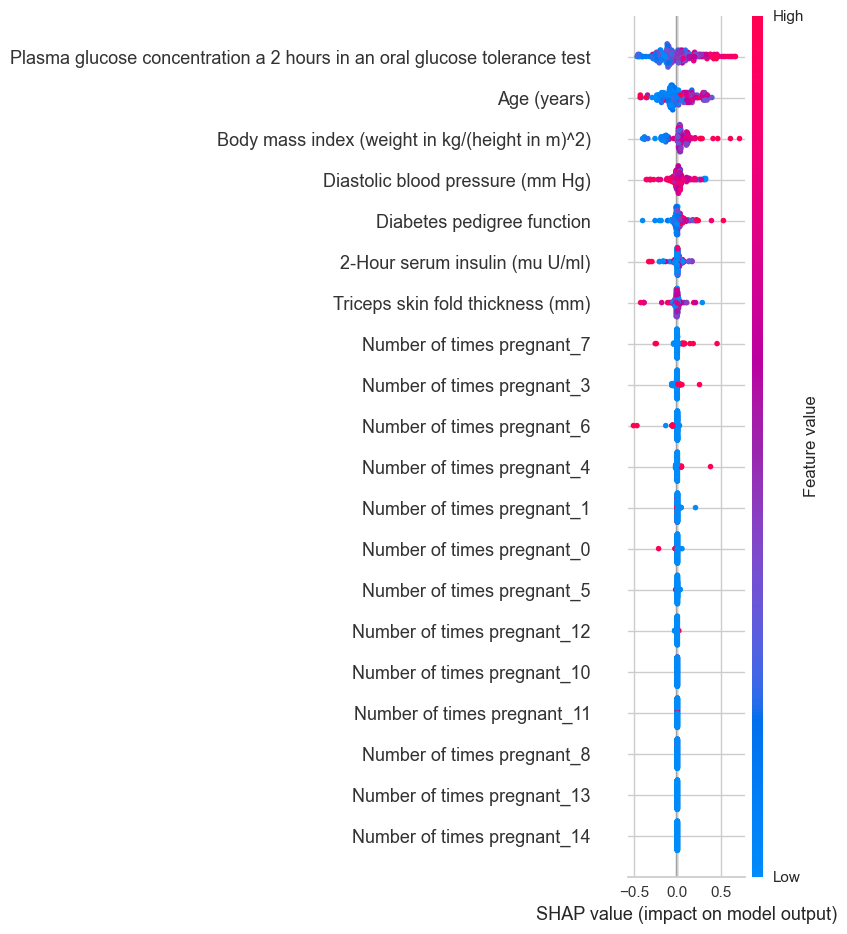

In [115]:
interpret_model(dt)

In [ ]:
#evaluate_model(dt)

In [120]:
print('type:',type(calibrated_dt))
print('classifier_:',calibrated_dt.calibrated_classifiers_)
#print('probability_threshold:',calibrated_dt.probability_threshold)
print('score:',calibrated_dt.score)
print('set_params:',calibrated_dt.set_params)

type: <class 'sklearn.calibration.CalibratedClassifierCV'>
classifier_: [<sklearn.calibration._CalibratedClassifier object at 0x0000018270E5DCD0>, <sklearn.calibration._CalibratedClassifier object at 0x0000018270E5D3D0>, <sklearn.calibration._CalibratedClassifier object at 0x00000182755F39A0>, <sklearn.calibration._CalibratedClassifier object at 0x00000182755F33A0>, <sklearn.calibration._CalibratedClassifier object at 0x00000182755F3FA0>]
score: <bound method ClassifierMixin.score of CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features=None,
                                                             max_leaf_nodes=None,
                                     

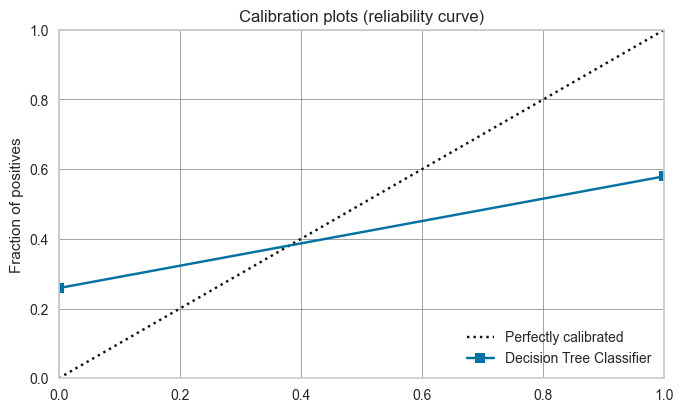

In [121]:
# Before Calibration
plot_model(dt, plot='calibration')

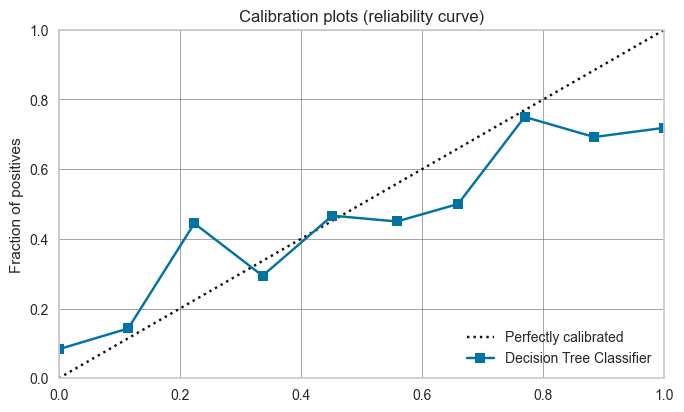

In [118]:
# After Calibration
plot_model(calibrated_dt, plot='calibration')

In [130]:
len(calibrated_dt.calibrated_classifiers_)

5

In [124]:
print(calibrated_dt)

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features=None,
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=1,
                                                             min_samples_split=2,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort='deprecated',
               

In [136]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',session_id=123)

# train a model
lr = create_model('lr',random_state=42,probability_threshold = 0.6) #,probability_threshold = 0.5

# calibrate model
calibrated_lr = calibrate_model(lr, method='sigmoid')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7037,0.7330,0.4444,0.5714,0.5000,0.2941,0.2988
1,0.7037,0.7855,0.1667,0.7500,0.2727,0.1724,0.2500
2,0.7222,0.8519,0.3333,0.6667,0.4444,0.2857,0.3162
3,0.7593,0.7901,0.4444,0.7273,0.5517,0.4000,0.4227
4,0.6667,0.6944,0.2222,0.5000,0.3077,0.1290,0.1474
5,0.7778,0.8256,0.5000,0.7500,0.6000,0.4545,0.4725
6,0.7407,0.8241,0.2778,0.8333,0.4167,0.3000,0.3750
7,0.7170,0.7952,0.2778,0.7143,0.4000,0.2591,0.3086
8,0.8491,0.8540,0.6111,0.9167,0.7333,0.6339,0.6592


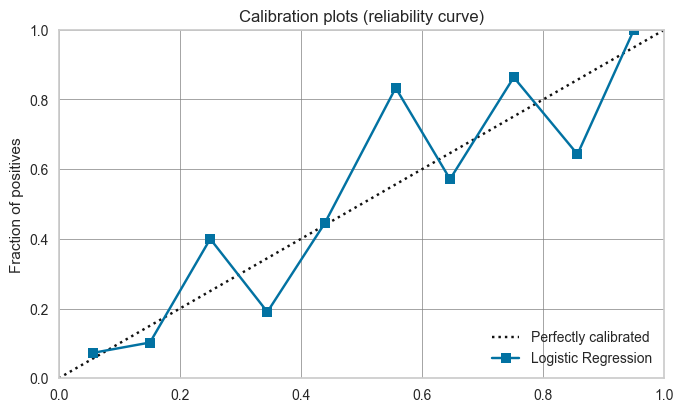

In [137]:
# Before Calibration
plot_model(lr, plot='calibration')

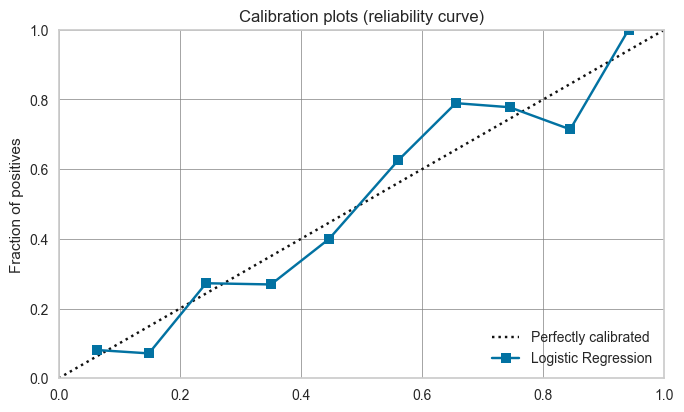

In [138]:
# After Calibration
plot_model(calibrated_lr, plot='calibration')

In [142]:
print('type:',type(calibrated_lr))
print('classifier_:',len(calibrated_lr.calibrated_classifiers_))
print('probability_threshold:',calibrated_lr.probability_threshold)
print('score:',calibrated_lr.score)
print('set_params:',calibrated_lr.set_params)

type: <class 'pycaret.internal.meta_estimators.CustomProbabilityThresholdClassifier'>
classifier_: 5
probability_threshold: 0.6
score: <bound method ClassifierMixin.score of CustomProbabilityThresholdClassifier(base_estimator=LogisticRegression(C=1.0,
                                                                       class_weight=None,
                                                                       dual=False,
                                                                       fit_intercept=True,
                                                                       intercept_scaling=1,
                                                                       l1_ratio=None,
                                                                       max_iter=1000,
                                                                       multi_class='auto',
                                                                       n_jobs=None,
                                             

In [98]:
# Importing dataset
from pycaret.datasets import get_data
credit = get_data('credit')

# Importing module and initializing setup
from pycaret.classification import *
clf1 = setup(data = credit, target ='default')

# create a model
xgboost = create_model('xgboost')

# optimize threshold for trained model
optimize_threshold(xgboost, true_negative = 1500, false_negative = -5000)


,Description,Value
0,session_id,7178
1,Target,default
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(24000, 24)"
5,Missing Values,False
6,Numeric Features,14
7,Categorical Features,9
8,Ordinal Features,False
9,High Cardinality Features,False


IntProgress(value=0, description='Processing: ', max=4)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,13:14:45
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Extreme Gradient Boosting


,Fold,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC


KeyboardInterrupt: 

# Analyze 
* https://pycaret.gitbook.io/docs/get-started/functions/analyze

# plot_model
* This function analyzes the performance of a trained model on the hold-out set. It may require re-training the model in certain cases.

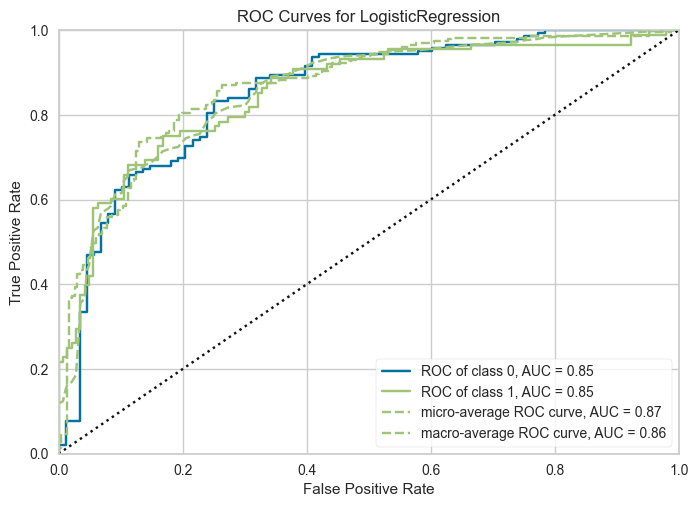

In [151]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', session_id=123)

# creating a model
lr = create_model('lr', random_state=42,probability_threshold = 0.5)

# plot model
plot_model(lr, plot = 'auc') 

#plot_model(lr, plot = 'auc', scale = 3) # Change the scale: The resolution scale of the figure can be changed with scale parameter.

# plot model
#plot_model(lr, plot = 'auc', save = True) # Save the plot: You can save the plot as a png file using the save parameter.

# plot model
#plot_model(lr, plot = 'confusion_matrix', plot_kwargs = {'percent' : True}) # Customize the plot: PyCaret uses Yellowbrick for most of the plotting work. 
                                                                             # Any argument that is acceptable for Yellowbrick visualizers can be passed as plot_kwargs parameter.

# plot model
#plot_model(lr, plot = 'auc', use_train_data = True) # Use train data: If you want to assess the model plot on the train data, you can pass 
                                                    # use_train_data=True in the plot_model function.



Examples by module
Classification - Plot Name

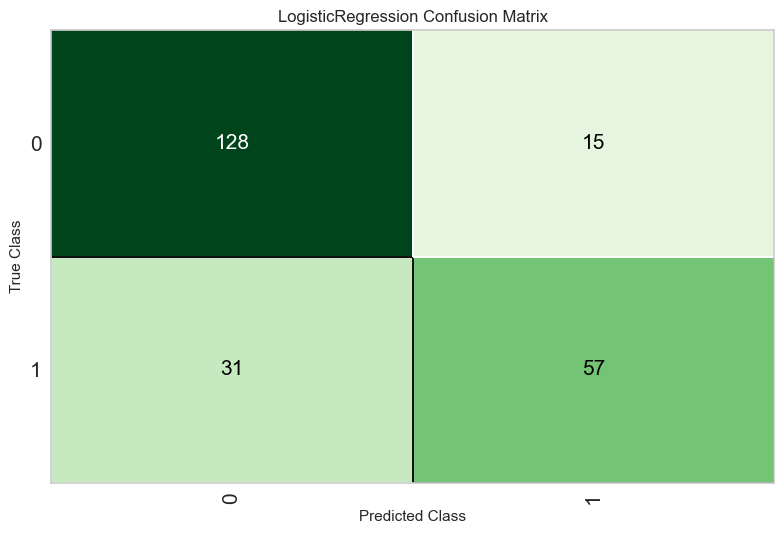

In [153]:
#plot_model(lr, plot = 'auc')
plot_model(lr, plot = 'confusion_matrix')
#plot_model(lr, plot = 'pr')
#plot_model(lr, plot = 'error')
#plot_model(lr, plot = 'class_report')
#plot_model(lr, plot = 'rfe')
#plot_model(lr, plot = 'learning')
#plot_model(lr, plot = 'vc')


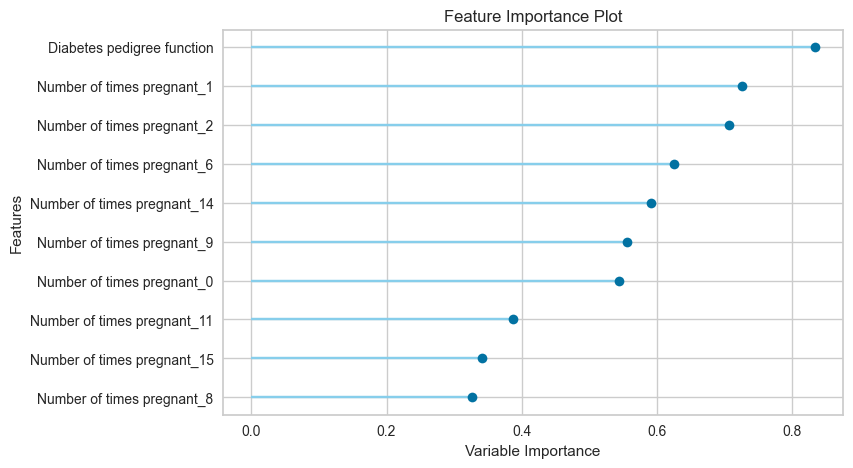

In [148]:
plot_model(lr, plot = 'feature')
#plot_model(lr, plot = 'maniflod')
#plot_model(lr, plot = 'calibration')
#plot_model(lr, plot = 'dimension')
#plot_model(lr, plot = 'boundary')
#plot_model(lr, plot = 'lift')
#plot_model(lr, plot = 'gain')
#plot_model(lr, plot = 'ks')
#plot_model(lr, plot = 'parameter')


# Regression - Name Plot
* Residuals Plot                -> ‘residuals’
* Prediction Error Plot        -> ‘error’
* Cooks Distance Plot          -> ‘cooks’
* Recursive Feature Selection  -> ‘rfe’
* Learning Curve               -> ‘learning’
* Validation Curve             -> ‘vc’
* Manifold Learning            -> ‘manifold’
* Feature Importance (top 10)  -> ‘feature’
* Feature Importance (all)     -> 'feature_all'
* Model Hyperparameter         -> ‘parameter’

# Clustering - Name Plot
* Cluster PCA Plot (2d)	-> ‘cluster’
* Cluster TSnE (3d) ->	‘tsne’
* Elbow Plot -> ‘elbow’
* Silhouette Plot -> ‘silhouette’
* Distance Plot -> ‘distance’
* Distribution Plot -> ‘distribution’

# interpret_model
* This function analyzes the predictions generated from a trained model. Most plots in this function are implemented based on the SHAP (Shapley Additive exPlanations). For more info on this, please see https://shap.readthedocs.io/en/latest/

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7963,0.8842,0.6842,0.7222,0.7027,0.5479,0.5484
1,0.7407,0.7398,0.4211,0.7273,0.5333,0.3710,0.3976
2,0.7222,0.8302,0.6111,0.5789,0.5946,0.3836,0.3839
3,0.7222,0.7145,0.4444,0.6154,0.5161,0.3284,0.3369
4,0.7037,0.8009,0.5556,0.5556,0.5556,0.3333,0.3333
5,0.7222,0.8287,0.6667,0.5714,0.6154,0.4000,0.4029
6,0.7963,0.8441,0.6667,0.7059,0.6857,0.5352,0.5357
7,0.7925,0.8667,0.6667,0.7059,0.6857,0.5310,0.5315
8,0.7358,0.8381,0.6667,0.6000,0.6316,0.4266,0.4280


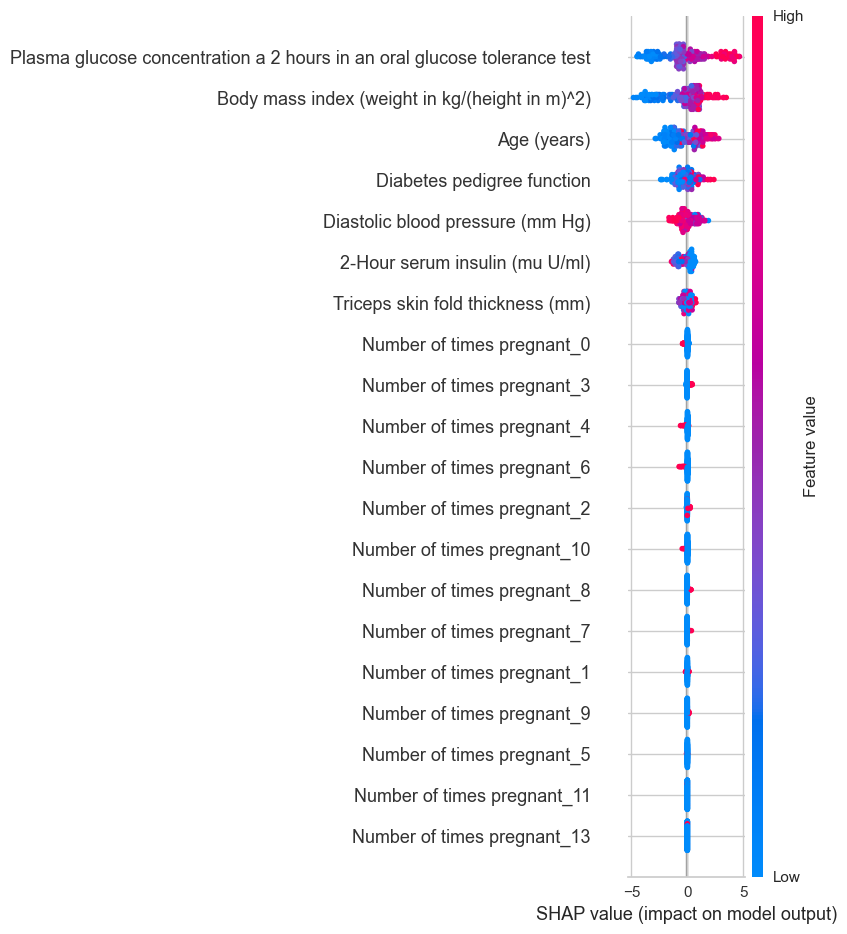

In [154]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost)

# interpret model
#interpret_model(xgboost, save = True) #Save the plot: You can save the plot as a png file using the save parameter
                                       # When save=True no plot is displayed in the Notebook. 

# Change plot type
* There are a few different plot types available that can be changed by the plot parameter.
* Correlation

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8519,0.8752,0.8421,0.7619,0.8000,0.6828,0.6850
1,0.7222,0.7113,0.5789,0.6111,0.5946,0.3836,0.3839
2,0.7778,0.8511,0.7368,0.6667,0.7000,0.5242,0.5259
3,0.8148,0.8211,0.7895,0.7143,0.7500,0.6035,0.6054
4,0.7222,0.7338,0.5263,0.6250,0.5714,0.3682,0.3711
5,0.7593,0.7685,0.4444,0.7273,0.5517,0.4000,0.4227
6,0.8889,0.9336,0.7778,0.8750,0.8235,0.7429,0.7456
7,0.6226,0.7016,0.4444,0.4444,0.4444,0.1587,0.1587
8,0.7170,0.8032,0.7222,0.5652,0.6341,0.4089,0.4171


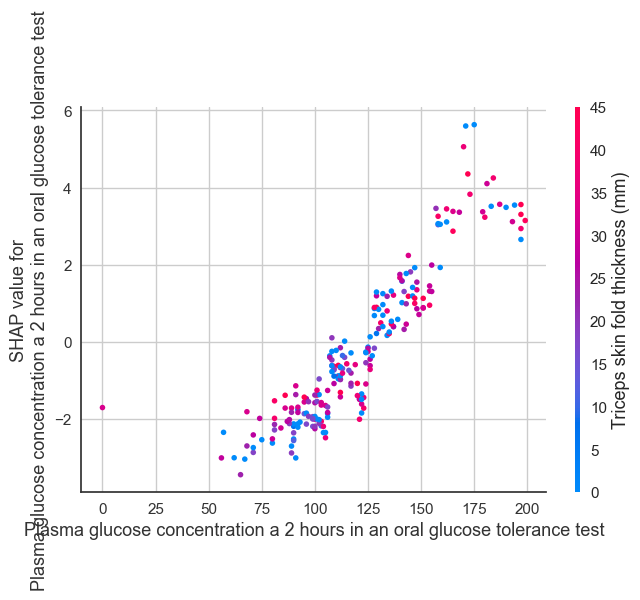

In [158]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'correlation')

* By default, PyCaret uses the first feature in the dataset but that can be changed using feature parameter.

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8519,0.9143,0.7368,0.8235,0.7778,0.6672,0.6695
1,0.7037,0.7248,0.5789,0.5789,0.5789,0.3504,0.3504
2,0.6852,0.7684,0.5263,0.5556,0.5405,0.3014,0.3016
3,0.6852,0.6842,0.5789,0.5500,0.5641,0.3180,0.3182
4,0.7407,0.8117,0.6111,0.6111,0.6111,0.4167,0.4167
5,0.7037,0.7870,0.6667,0.5455,0.6000,0.3684,0.3731
6,0.7593,0.8086,0.3889,0.7778,0.5185,0.3810,0.4216
7,0.7547,0.7841,0.5000,0.6923,0.5806,0.4136,0.4246
8,0.6792,0.7714,0.6111,0.5238,0.5641,0.3127,0.3151


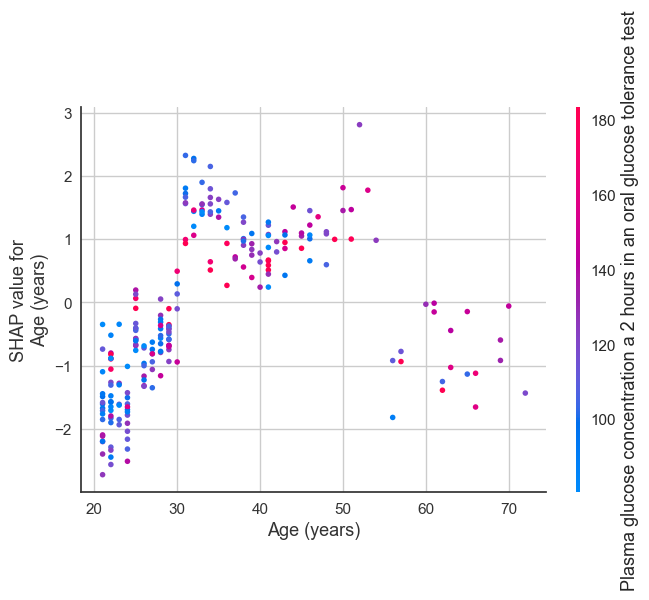

In [160]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'correlation', feature = 'Age (years)')

* Partial Dependence Plot

In [162]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'pdp')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6667,0.7623,0.5000,0.5000,0.5000,0.2500,0.2500
1,0.7963,0.8256,0.5263,0.8333,0.6452,0.5123,0.5389
2,0.6296,0.6812,0.3684,0.4667,0.4118,0.1469,0.1491
3,0.7037,0.7669,0.5789,0.5789,0.5789,0.3504,0.3504
4,0.7222,0.7534,0.5263,0.6250,0.5714,0.3682,0.3711
5,0.7778,0.8391,0.6842,0.6842,0.6842,0.5128,0.5128
6,0.7407,0.7429,0.4737,0.6923,0.5625,0.3874,0.4014
7,0.6604,0.7397,0.5556,0.5000,0.5263,0.2628,0.2636
8,0.7547,0.8048,0.6667,0.6316,0.6486,0.4605,0.4609


* By default, PyCaret uses the first available feature in the dataset but this can be changed using the feature parameter.

In [1]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'pdp', feature = 'Age (years)')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8519,0.9213,0.7222,0.8125,0.7647,0.6571,0.6596
1,0.7407,0.8086,0.6111,0.6111,0.6111,0.4167,0.4167
2,0.7037,0.6898,0.5000,0.5625,0.5294,0.3143,0.3154
3,0.7037,0.6898,0.5556,0.5556,0.5556,0.3333,0.3333
4,0.7778,0.8117,0.7222,0.6500,0.6842,0.5135,0.5152
5,0.7222,0.7593,0.4444,0.6154,0.5161,0.3284,0.3369
6,0.7407,0.7701,0.6667,0.6000,0.6316,0.4324,0.4339
7,0.8302,0.7663,0.5882,0.8333,0.6897,0.5775,0.5941
8,0.7170,0.7435,0.5294,0.5625,0.5455,0.3402,0.3406


* Morris Sensitivity Analysis

In [2]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'msa')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7037,0.7485,0.4444,0.5714,0.5000,0.2941,0.2988
1,0.7778,0.7361,0.4444,0.8000,0.5714,0.4375,0.4719
2,0.6667,0.7886,0.5000,0.5000,0.5000,0.2500,0.2500
3,0.6852,0.7978,0.4444,0.5333,0.4848,0.2609,0.2631
4,0.7037,0.7639,0.5000,0.5625,0.5294,0.3143,0.3154
5,0.7222,0.8194,0.5000,0.6000,0.5455,0.3478,0.3508
6,0.6667,0.7114,0.4444,0.5000,0.4706,0.2286,0.2294
7,0.7547,0.8651,0.5000,0.6923,0.5806,0.4136,0.4246
8,0.6415,0.7429,0.5556,0.4762,0.5128,0.2319,0.2336


* Permutation Feature Importance
* ImportError: interpret-community library not found. pip install interpret-community to generate pfi plot in interpret_model function.

In [3]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'pfi')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6481,0.6500,0.5000,0.5263,0.5128,0.2377,0.2379
1,0.7222,0.7941,0.6000,0.6316,0.6154,0.3982,0.3985
2,0.7778,0.8286,0.5263,0.7692,0.6250,0.4749,0.4921
3,0.7963,0.7564,0.4737,0.9000,0.6207,0.4992,0.5472
4,0.7407,0.8045,0.5789,0.6471,0.6111,0.4176,0.4190
5,0.7963,0.8782,0.5263,0.8333,0.6452,0.5123,0.5389
6,0.7222,0.7594,0.5263,0.6250,0.5714,0.3682,0.3711
7,0.9245,0.9241,0.8947,0.8947,0.8947,0.8359,0.8359
8,0.7358,0.7446,0.6842,0.6190,0.6500,0.4387,0.4401


24it [00:00, 100.29it/s]


* Reason Plot

In [4]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'reason')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7222,0.8436,0.7368,0.5833,0.6512,0.4255,0.4336
1,0.7407,0.8075,0.5789,0.6471,0.6111,0.4176,0.4190
2,0.6667,0.7218,0.4737,0.5294,0.5000,0.2512,0.2520
3,0.7778,0.8406,0.5789,0.7333,0.6471,0.4882,0.4954
4,0.7963,0.8617,0.6316,0.7500,0.6857,0.5367,0.5410
5,0.7222,0.7925,0.7368,0.5833,0.6512,0.4255,0.4336
6,0.6667,0.7398,0.4211,0.5333,0.4706,0.2322,0.2357
7,0.6981,0.8344,0.4211,0.6154,0.5000,0.2945,0.3054
8,0.7358,0.8111,0.6316,0.6316,0.6316,0.4257,0.4257


* When you generate reason plot without passing the specific index of test data, you will get the interactive plot displayed with the ability to select the x and y-axis. This will only be possible if you are using Jupyter Notebook or an equivalent environment. If you want to see this plot for a specific observation, you will have to pass the index in the observation parameter.

* Next, the observation = 1 means index 1 from the test set.

In [5]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, plot = 'reason', observation = 1)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6667,0.7238,0.5000,0.5000,0.5000,0.2500,0.2500
1,0.7222,0.7191,0.6667,0.5714,0.6154,0.4000,0.4029
2,0.7963,0.8796,0.6667,0.7059,0.6857,0.5352,0.5357
3,0.6111,0.6327,0.2778,0.3846,0.3226,0.0597,0.0613
4,0.7222,0.7731,0.6111,0.5789,0.5946,0.3836,0.3839
5,0.7037,0.7158,0.5789,0.5789,0.5789,0.3504,0.3504
6,0.7222,0.7970,0.6316,0.6000,0.6154,0.3982,0.3985
7,0.6792,0.7206,0.6111,0.5238,0.5641,0.3127,0.3151
8,0.6981,0.7762,0.5000,0.5625,0.5294,0.3083,0.3095


# Use train data
* By default, all the plots are generated on the test dataset. If you want to generate plots using a train data set (not recommended) you can use use_train_data parameter.

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6667,0.7130,0.5000,0.5000,0.5000,0.2500,0.2500
1,0.7222,0.7269,0.5000,0.6000,0.5455,0.3478,0.3508
2,0.8333,0.9028,0.7778,0.7368,0.7568,0.6301,0.6307
3,0.6852,0.6898,0.4444,0.5333,0.4848,0.2609,0.2631
4,0.7407,0.7762,0.5000,0.6429,0.5625,0.3824,0.3884
5,0.6852,0.6898,0.5556,0.5263,0.5405,0.3014,0.3016
6,0.8519,0.8580,0.7222,0.8125,0.7647,0.6571,0.6596
7,0.7547,0.7683,0.7222,0.6190,0.6667,0.4744,0.4780
8,0.7170,0.7651,0.5000,0.6000,0.5455,0.3424,0.3454


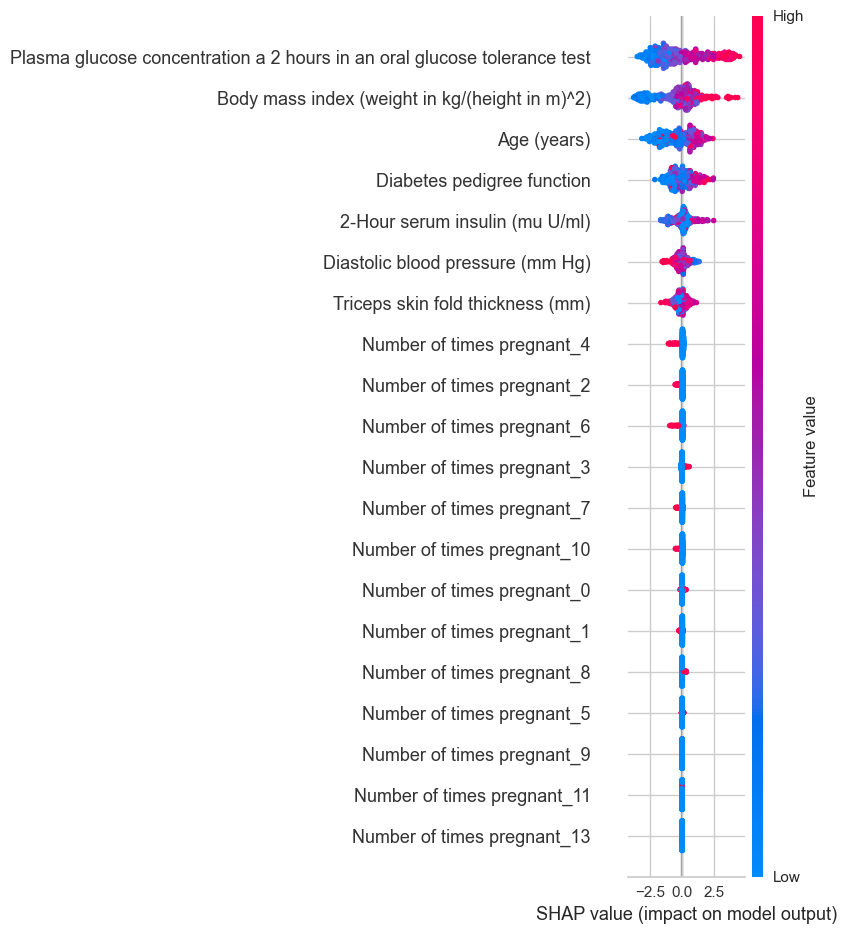

In [6]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable',silent = True)

# creating a model
xgboost = create_model('xgboost')

# interpret model
interpret_model(xgboost, use_train_data = True)

# dashboard
* The dashboard function generates the interactive dashboard for a trained model. The dashboard is implemented using ExplainerDashboard (explainerdashboard.readthedocs.io)
Dashboard Example

In [7]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase',silent = True)

# train model
lr = create_model('lr')

# launch dashboard
dashboard(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7867,0.8630,0.6667,0.7692,0.7143,0.5455,0.5490
1,0.8667,0.9444,0.6667,1.0000,0.8000,0.7059,0.7385
2,0.7867,0.8456,0.6897,0.7407,0.7143,0.5444,0.5453
3,0.8133,0.9070,0.8621,0.7143,0.7813,0.6209,0.6293
4,0.8933,0.9445,0.8966,0.8387,0.8667,0.7779,0.7791
5,0.7733,0.8606,0.6552,0.7308,0.6909,0.5128,0.5147
6,0.8800,0.9310,0.8276,0.8571,0.8421,0.7454,0.7457
7,0.8800,0.9183,0.8276,0.8571,0.8421,0.7454,0.7457
8,0.8243,0.8559,0.7586,0.7857,0.7719,0.6291,0.6294


Note: model_output='probability' is currently not supported for linear classifiers models with shap. So defaulting to model_output='logodds' If you really need probability outputs use shap='kernel' instead.
Note: shap values for shap='linear' get calculated against X_background, but paramater X_background=None, so using X instead...
Generating self.shap_explainer = shap.LinearExplainer(model, X)...
Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
For this type of model and model_output interactions don't work, so setting shap_interaction=False...
The explainer object has no decision_trees property. so setting decision_trees=False...
Generating layout...
Calculating shap values...
Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Ca

 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:8050
 * Running on http://10.231.94.126:8050
Press CTRL+C to quit
10.231.94.126 - - [05/Oct/2022 15:54:20] "GET / HTTP/1.1" 200 -
10.231.94.126 - - [05/Oct/2022 15:54:21] "GET /_dash-component-suites/dash/deps/prop-types@15.v2_6_2m1664508845.8.1.min.js HTTP/1.1" 200 -
10.231.94.126 - - [05/Oct/2022 15:54:21] "GET /assets/bootstrap.min.css?m=1664509129.1456676 HTTP/1.1" 200 -
10.231.94.126 - - [05/Oct/2022 15:54:21] "GET /_dash-component-suites/dash/deps/polyfill@7.v2_6_2m1664508845.12.1.min.js HTTP/1.1" 200 -
10.231.94.126 - - [05/Oct/2022 15:54:21] "GET /_dash-component-suites/dash/deps/react-dom@16.v2_6_2m1664508845.14.0.min.js HTTP/1.1" 200 -
10.231.94.126 - - [05/Oct/2022 15:54:21] "GET /_dash-component-suites/dash/deps/react@16.v2_6_2m1664508845.14.0.min.js HTTP/1.1" 200 -
10.231.94.126 - - [05/Oct/2022 15:54:21] "GET /_dash-component-suites/dash_bootstrap_components/_components/dash_bootstrap_components.v1_2_1m1

# deep_check
* This function runs a full suite check over a trained model using the deepchecks library.
* ImportError: It appears that deepchecks is not installed. Do: pip install deepchecks
* This function is in experimental mode. deepchecks require scikit-learn>1.0 version, whereas pycaret requires scikit-learn==0.23.2. Hence after installing deepchecks you must uninstall scikit-learn and reinstall scikit-learn==0.23.2 otherwise you will get an error with pycaret. The future version of pycaret will be scikit-learn>1.0 compatible. 

In [8]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase',silent = True)

# train model
lr = create_model('lr')

# deep check model
deep_check(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8400,0.9183,0.6897,0.8696,0.7692,0.6493,0.6595
1,0.8800,0.9078,0.7586,0.9167,0.8302,0.7387,0.7466
2,0.9067,0.9543,0.8966,0.8667,0.8814,0.8045,0.8048
3,0.8400,0.8761,0.7857,0.7857,0.7857,0.6581,0.6581
4,0.8000,0.8845,0.6786,0.7600,0.7170,0.5631,0.5653
5,0.8133,0.8731,0.6786,0.7917,0.7308,0.5892,0.5933
6,0.8400,0.8670,0.8929,0.7353,0.8065,0.6723,0.6815
7,0.8533,0.9248,0.7857,0.8148,0.8000,0.6843,0.6846
8,0.8108,0.8882,0.7500,0.7500,0.7500,0.5978,0.5978


ImportError: It appears that deepchecks is not installed. Do: pip install deepchecks

# eda
* This function generates automated Exploratory Data Analysis (EDA) using the AutoViz library. You must install Autoviz separately pip install autoviz to use this function.
EDA Example

In [9]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase',silent = True)

# launch eda
eda(display_format = 'bokeh')

,Description,Value
0,session_id,2006
1,Target,Purchase
2,Target Type,Binary
3,Label Encoded,"CH: 0, MM: 1"
4,Original Data,"(1070, 19)"
5,Missing Values,False
6,Numeric Features,13
7,Categorical Features,5
8,Ordinal Features,False
9,High Cardinality Features,False


Imported v0.1.55. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


Shape of your Data Set loaded: (1070, 19)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Id,1070,int64,0,0.000000,100.000000,0,possible ID column: drop
LoyalCH,553,float64,0,0.000000,51.682243,0,
WeekofPurchase,52,int64,0,0.000000,4.859813,0,
PriceDiff,36,float64,0,0.000000,3.364486,0,
SalePriceMM,18,float64,0,0.000000,1.682243,0,
PctDiscMM,18,float64,0,0.000000,1.682243,0,skewed column: cap or drop possible outliers
ListPriceDiff,18,float64,0,0.000000,1.682243,0,
SalePriceCH,13,float64,0,0.000000,1.214953,0,
PctDiscCH,13,float64,0,0.000000,1.214953,0,skewed column: cap or drop possible outliers
DiscCH,12,float64,0,0.000000,1.121495,0,skewed column: cap or drop possible outliers


    18 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Id']

################ Binary_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='y', options=['LoyalCH', 'SalePriceMM',...], value='LoyalCH')
    [1] ParamFunction(function)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['LoyalCH', 'PriceDiff'], value='LoyalCH')
        [1] Select(name='Y-Axis', options=['LoyalCH', 'PriceDiff'], value='PriceDiff')
        [2] Select(name='Color', options=['None', 'Purchase'], value='None')
    [1] ParamFunction(function)

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['WeekofPurchase', ...], value='WeekofPurchase', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['ListPriceDiff', ...], value='ListPriceDiff', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['WeekofPurchase', ...], value='WeekofPurchase')
        [1] Select(name='Y-Axis', options=['LoyalCH', 'PriceDiff'], value='LoyalCH')
    [1] ParamFunction(function)

Time to run AutoViz (in seconds) = 5


* You can also run this function with display_format = 'svg'.

In [10]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase',silent=True)

# launch eda
eda(display_format = 'svg')

,Description,Value
0,session_id,1974
1,Target,Purchase
2,Target Type,Binary
3,Label Encoded,"CH: 0, MM: 1"
4,Original Data,"(1070, 19)"
5,Missing Values,False
6,Numeric Features,13
7,Categorical Features,5
8,Ordinal Features,False
9,High Cardinality Features,False


Shape of your Data Set loaded: (1070, 19)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Id,1070,int64,0,0.000000,100.000000,0,possible ID column: drop
LoyalCH,553,float64,0,0.000000,51.682243,0,
WeekofPurchase,52,int64,0,0.000000,4.859813,0,
PriceDiff,36,float64,0,0.000000,3.364486,0,
SalePriceMM,18,float64,0,0.000000,1.682243,0,
PctDiscMM,18,float64,0,0.000000,1.682243,0,skewed column: cap or drop possible outliers
ListPriceDiff,18,float64,0,0.000000,1.682243,0,
SalePriceCH,13,float64,0,0.000000,1.214953,0,
PctDiscCH,13,float64,0,0.000000,1.214953,0,skewed column: cap or drop possible outliers
DiscCH,12,float64,0,0.000000,1.121495,0,skewed column: cap or drop possible outliers


    18 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Id']

################ Binary_Classification problem #####################
Total Number of Scatter Plots = 66
All Plots done
Time to run AutoViz = 16 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


# check_fairness
* There are many approaches to conceptualizing fairness. The check_fairness function follows the approach known as group fairness, which asks: which groups of individuals are at risk for experiencing harm. check_fairness provides fairness-related metrics between different groups (also called sub-population).
* ImportError: It appears that fairlearn is not installed. Do: pip install fairlearn

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8548,0.9105,0.6202,0.7316,0.6713,0.5790,0.5822
1,0.8526,0.9101,0.6294,0.7191,0.6712,0.5768,0.5789
2,0.8561,0.9177,0.6073,0.7438,0.6687,0.5780,0.5828
3,0.8609,0.9078,0.6092,0.7615,0.6769,0.5896,0.5956
4,0.8455,0.9018,0.5982,0.7102,0.6494,0.5513,0.5546
5,0.8473,0.9041,0.6147,0.7082,0.6582,0.5605,0.5628
6,0.8565,0.9114,0.5835,0.7608,0.6604,0.5715,0.5796
7,0.8460,0.9004,0.5945,0.7137,0.6486,0.5511,0.5548
8,0.8543,0.8940,0.5817,0.7530,0.6563,0.5658,0.5734


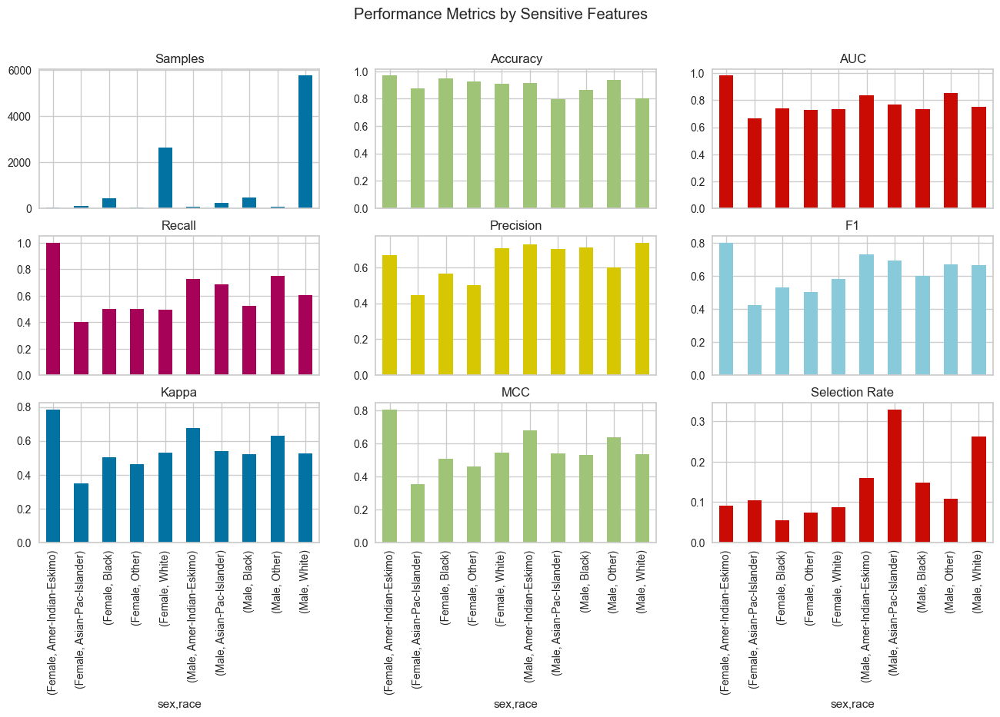

In [4]:
# load dataset
from pycaret.datasets import get_data
income = get_data('income')

# init setup
from pycaret.classification import *
exp_name = setup(data = income,  target = 'income >50K', silent=True)

# train model
lr = create_model('lr')

# check model fairness
lr_fairness = check_fairness(lr, sensitive_features = ['sex', 'race'])

In [8]:
lr_fairness

Samples  Accuracy       AUC    Recall Precision  \
sex    race                                                                 
Female Amer-Indian-Eskimo      33  0.969697  0.983871       1.0  0.666667   
       Asian-Pac-Islander      87  0.873563  0.667532       0.4  0.444444   
       Black                  429  0.946387  0.737593       0.5  0.565217   
       Other                   27  0.925926      0.73       0.5       0.5   
       White                 2623  0.911933  0.731565   0.49226   0.70354   
Male   Amer-Indian-Eskimo      69  0.913043  0.837774  0.727273  0.727273   
       Asian-Pac-Islander     225  0.795556   0.76828  0.684211  0.702703   
       Black                  469  0.861407  0.733972  0.521277  0.710145   
       Other                   46  0.934783   0.85119      0.75       0.6   
       White                 5761  0.804027  0.750747  0.602821  0.736737   

                                 F1     Kappa       MCC Selection Rate  
sex    race                                                             
Female Amer-Indian-Eskimo       0.8  0.784314  0.803219       0.090909  
       Asian-Pac-Islander  0.421053  0.350305  0.350918       0.103448  
       Black               0.530612  0.502295  0.503357       0.053613  
       Other                    0.5      0.46      0.46       0.074074  
       White               0.579235  0.531763   0.54235       0.086161  
Male   Amer-Indian-Eskimo  0.727273  0.675549  0.675549        0.15942  
       Asian-Pac-Islander  0.693333  0.540041  0.540149       0.328889  
       Black               0.601227  0.519732  0.528833       0.147122  
       Other               0.666667  0.631016  0.635844       0.108696  
       White               0.663086  0.526853  0.532124        0.26176

# get_leaderboard
* This function returns the leaderboard of all models trained in the current setup

In [9]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent=True)

# compare models
top3 = compare_models(n_select = 3)

# tune top 3 models
tuned_top3 = [tune_model(i) for i in top3]

# ensemble top 3 tuned models
ensembled_top3 = [ensemble_model(i) for i in tuned_top3]

# blender
blender = blend_models(tuned_top3)

# stacker
stacker = stack_models(tuned_top3)

# check leaderboard
get_leaderboard()

,Model Name,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Index,,,,,,,,,
0,Logistic Regression,"(DataTypes_Auto_infer(categorical_features=[],...",0.7470,0.8141,0.5682,0.6975,0.6215,0.4339,0.4431
1,K Neighbors Classifier,"(DataTypes_Auto_infer(categorical_features=[],...",0.7078,0.7327,0.5318,0.6100,0.5641,0.3467,0.3511
2,Naive Bayes,"(DataTypes_Auto_infer(categorical_features=[],...",0.6705,0.7406,0.1818,0.6107,0.2754,0.1451,0.1864
3,Decision Tree Classifier,"(DataTypes_Auto_infer(categorical_features=[],...",0.6797,0.6484,0.5371,0.5600,0.5432,0.2990,0.3021
4,SVM - Linear Kernel,"(DataTypes_Auto_infer(categorical_features=[],...",0.6180,0.0000,0.3763,0.3573,0.3226,0.1260,0.1480
5,Ridge Classifier,"(DataTypes_Auto_infer(categorical_features=[],...",0.7321,0.0000,0.5471,0.6781,0.5979,0.4002,0.4112
6,Random Forest Classifier,"(DataTypes_Auto_infer(categorical_features=[],...",0.7302,0.7872,0.5368,0.6681,0.5915,0.3929,0.4013
7,Quadratic Discriminant Analysis,"(DataTypes_Auto_infer(categorical_features=[],...",0.4937,0.5612,0.6100,0.3846,0.4299,0.0373,0.0519
8,Ada Boost Classifier,"(DataTypes_Auto_infer(categorical_features=[],...",0.7283,0.7741,0.5834,0.6367,0.6049,0.3992,0.4029


# You can also access the trained Pipeline with this. 

In [10]:
# check leaderboard
lb = get_leaderboard()

# select top model
lb.iloc[0]['Model']

Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[],
                                      target='Class variable',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numer...
                ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                ('dfs', 'passthrough'), ('pca', 'passthrough'),
                ['trained_model',
                 LogisticRegression(C=1.0, class_weight=None, dual=Fa

# assign_model
* This function assigns labels to the training dataset using the trained model. It is available for Clustering, Anomaly Detection, and NLP modules.
Clustering

* Clustering

In [13]:
# load dataset
from pycaret.datasets import get_data
jewellery = get_data('jewellery')

# init setup
from pycaret.clustering import *
clu1 = setup(data = jewellery, silent=True)

# train a model
kmeans = create_model('kmeans')

# assign model
assign_model(kmeans)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.7207,5011.8113,0.4114,0,0,0


,Age,Income,SpendingScore,Savings,Cluster
0,58,77769,0.791329,6559.829923,Cluster 1
1,59,81799,0.791082,5417.661426,Cluster 1
2,62,74751,0.702657,9258.992965,Cluster 1
3,59,74373,0.765680,7346.334504,Cluster 1
4,87,17760,0.348778,16869.507130,Cluster 2
...,...,...,...,...,...
500,28,101206,0.387441,14936.775389,Cluster 3
501,93,19934,0.203140,17969.693769,Cluster 2
502,90,35297,0.355149,16091.401954,Cluster 2
503,91,20681,0.354679,18401.088445,Cluster 2


* Anomaly Detection

In [15]:
# load dataset
from pycaret.datasets import get_data
anomaly = get_data('anomaly')

# init setup
from pycaret.anomaly import *
ano1 = setup(data = anomaly, silent=True)

# train a model
iforest = create_model('iforest')

# assign model
assign_model(iforest)

,Col1,Col2,Col3,Col4,Col5,Col6,Col7,Col8,Col9,Col10,Anomaly,Anomaly_Score
0,0.263995,0.764929,0.138424,0.935242,0.605867,0.518790,0.912225,0.608234,0.723782,0.733591,0,-0.017142
1,0.546092,0.653975,0.065575,0.227772,0.845269,0.837066,0.272379,0.331679,0.429297,0.367422,0,-0.069873
2,0.336714,0.538842,0.192801,0.553563,0.074515,0.332993,0.365792,0.861309,0.899017,0.088600,0,-0.003613
3,0.092108,0.995017,0.014465,0.176371,0.241530,0.514724,0.562208,0.158963,0.073715,0.208463,1,0.052212
4,0.325261,0.805968,0.957033,0.331665,0.307923,0.355315,0.501899,0.558449,0.885169,0.182754,0,-0.013240
...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.305055,0.656837,0.331665,0.822525,0.907127,0.882276,0.855732,0.584786,0.808640,0.242762,0,-0.093572
996,0.812627,0.864258,0.616604,0.167966,0.811223,0.938071,0.418462,0.472306,0.348347,0.671129,0,-0.075753
997,0.250967,0.138627,0.919703,0.461234,0.886555,0.869888,0.800908,0.530324,0.779433,0.234952,0,-0.058208
998,0.502436,0.936820,0.580062,0.540773,0.151995,0.059452,0.225220,0.242755,0.279385,0.538755,0,-0.063462


* Natural Language Processing

In [6]:
# load dataset
from pycaret.datasets import get_data
kiva = get_data('kiva')

# init setup
from pycaret.nlp import *
nlp1 = setup(data = kiva, target = 'en')

# train a model
lda = create_model('lda')

# assign model
assign_model(lda)

,country,en,gender,loan_amount,nonpayment,sector,status,Topic_0,Topic_1,Topic_2,Topic_3,Dominant_Topic,Perc_Dominant_Topic
0,Dominican Republic,group woman look receive small loan take small...,F,1225,partner,Retail,0,0.110354,0.080068,0.051296,0.758281,Topic 3,0.76
1,Dominican Republic,walk forward group entrepreneur seek second lo...,F,1975,lender,Clothing,0,0.202606,0.075861,0.114310,0.607224,Topic 3,0.61
2,Dominican Republic,group people hope start business group look re...,F,2175,partner,Clothing,0,0.077294,0.000911,0.071272,0.850523,Topic 3,0.85
3,Dominican Republic,vive live group woman look receive loan young ...,F,1425,partner,Clothing,0,0.102066,0.000747,0.120536,0.776651,Topic 3,0.78
4,Dominican Republic,vive large group people hope take loan many se...,F,4025,partner,Food,0,0.112570,0.000699,0.069925,0.816806,Topic 3,0.82
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6813,Kenya,year old mother married driver child school go...,F,550,lender,Food,1,0.431610,0.000453,0.080086,0.487851,Topic 3,0.49
6814,Kenya,ateso year old marry child school fishmong mai...,F,1000,lender,Food,1,0.442988,0.000766,0.114291,0.441955,Topic 0,0.44
6815,Kenya,member active group pemci repay third loan pre...,F,325,lender,Retail,1,0.278262,0.000465,0.294398,0.426874,Topic 3,0.43
6816,Kenya,pemci successfully finish loan first loan enab...,F,450,partner,Retail,0,0.633761,0.000711,0.075557,0.289972,Topic 0,0.63


* Word Token Frequency - 'frequency'
* Word Distribution Plot - 'distribution'
* Bigram Frequency Plot - 'bigram'
* Trigram Frequency Plot - 'trigram'
* Sentiment Polarity Plot - 'sentiment'
* Part of Speech Frequency - 'pos'
* t-SNE (3d) Dimension Plot - 'tsne'
* Topic Model (pyLDAvis) - 'topic_model'
* Topic Infer Distribution - 'topic_distribution'
* Wordcloud - 'wordcloud'
* UMAP Dimensionality Plot - 'umap'

In [5]:
# Correccion de error ModuleNotFounError: No modeule named 'pyLDAvis.gensim'
# https://towardsdatascience.com/topic-modeling-on-pycaret-redux-46cd8e4869f4
import pyLDAvis
import pyLDAvis.gensim_models #as gensimvis
pyLDAvis.enable_notebook()

In [7]:
plot_model(lda, plot='topic_model')


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.248523  0.109430       1        1  55.993196
0      0.044508  0.260233       2        1  27.675170
2      0.273382 -0.077937       3        1  10.978420
1     -0.069367 -0.291726       4        1   5.353214, topic_info=                                            Term          Freq         Total  \
6360                                       steer   2843.000000   2843.000000   
15                                         group   3225.000000   3225.000000   
218                                       school   5250.000000   5250.000000   
477                                        stock   2415.000000   2415.000000   
74                                        member   1885.000000   1885.000000   
19                                          loan  12141.000000  12141.000000   
82                                          sell   7343.000000   7343.000000   
99                                          also   4482.000000   4482.000000   
5                                       business  14054.000000  14054.000000   
584                                         milk   1086.000000   1086.000000   
616                                         farm   1166.000000   1166.000000   
50                                           buy   5889.000000   5889.000000   
34                                         small   2571.000000   2571.000000   
7                                          child   9157.000000   9157.000000   
16                                        income   3385.000000   3385.000000   
141                                         work   3543.000000   3543.000000   
45                                         woman   1888.000000   1888.000000   
0                                           able   5718.000000   5718.000000   
42                                           use   4197.000000   4197.000000   
451                                          fee   1373.000000   1373.000000   
1626                                      farmer    945.000000    945.000000   
133                                         make   3510.000000   3510.000000   
7663                                   dairy_cow    735.000000    735.000000   
399                                          pay   2071.000000   2071.000000   
506                                    vegetable    720.000000    720.000000   
214                                         grow   1528.000000   1528.000000   
408                                       enable   1233.000000   1233.000000   
619                                        marry   2016.000000   2016.000000   
393                                         rice    564.000000    564.000000   
329                                      request   1907.000000   1907.000000   
62                                         first   1644.128656   1645.544184   
549                                         home   1178.458479   1179.844547   
224                                         save   1082.861797   1084.270197   
391                                         rent    889.181968    890.568070   
30                                        second    850.547820    851.934438   
361                                       decide    791.755325    793.141264   
752                                        build    748.123109    749.537207   
389                                         item    727.747602    729.131048   
136                                        money   1362.506974   1365.145675   
189                                         come    648.073800    649.472747   
179                                     continue    601.019220    602.409081   
104                                     clothing    587.038348    588.413313   
120                                        store    571.741404    573.116378   
163                                        house    571.292524    572.671629   
94                               

# Deploy
* MLOps and deployment related functions in PyCaret
* predict_model
* This function generates the label using a trained model.  When data is None, it predicts label and score on the holdout set. 
* Hold-out predictions

In [16]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent= True)

# create a model
xgboost = create_model('xgboost')

# predict on hold-out
predict_model(xgboost)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8704,0.9275,0.7222,0.8667,0.7879,0.6957,0.7016
1,0.7778,0.7886,0.5000,0.7500,0.6000,0.4545,0.4725
2,0.7037,0.7685,0.6667,0.5455,0.6000,0.3684,0.3731
3,0.7407,0.8642,0.4444,0.6667,0.5333,0.3636,0.3780
4,0.7593,0.8441,0.6667,0.6316,0.6486,0.4658,0.4661
5,0.7593,0.7269,0.6111,0.6471,0.6286,0.4507,0.4511
6,0.7407,0.7361,0.5556,0.6250,0.5882,0.4000,0.4015
7,0.6604,0.7141,0.5294,0.4737,0.5000,0.2441,0.2449
8,0.7358,0.8268,0.5294,0.6000,0.5625,0.3744,0.3759


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.7446,0.7958,0.5934,0.7105,0.6467,0.4492,0.4537


,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Number of times pregnant_0,Number of times pregnant_1,Number of times pregnant_10,...,Number of times pregnant_3,Number of times pregnant_4,Number of times pregnant_5,Number of times pregnant_6,Number of times pregnant_7,Number of times pregnant_8,Number of times pregnant_9,Class variable,Label,Score
0,145.0,88.0,34.0,165.0,30.299999,0.771,53.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,1,0.9986
1,105.0,84.0,0.0,0.0,27.900000,0.741,62.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0.9367
2,97.0,60.0,23.0,0.0,28.200001,0.443,22.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9985
3,115.0,64.0,22.0,0.0,30.799999,0.421,21.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9970
4,136.0,70.0,0.0,0.0,31.200001,1.182,22.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0,0.6954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,100.0,66.0,20.0,90.0,32.900002,0.867,28.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0.9962
227,112.0,66.0,0.0,0.0,37.799999,0.261,41.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1,0,0.8232
228,94.0,70.0,27.0,115.0,43.500000,0.347,21.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9796
229,125.0,50.0,40.0,167.0,33.299999,0.962,28.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.9191


* Unseen data predictions

In [17]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent= True)

# create a model
xgboost = create_model('xgboost')

# predict on new data
new_data = diabetes.copy()
new_data.drop('Class variable', axis = 1, inplace = True)
predict_model(xgboost, data = new_data)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8333,0.9120,0.8333,0.7143,0.7692,0.6400,0.6447
1,0.7407,0.8333,0.6111,0.6111,0.6111,0.4167,0.4167
2,0.7593,0.8194,0.7222,0.6190,0.6667,0.4800,0.4835
3,0.7222,0.8376,0.4211,0.6667,0.5161,0.3350,0.3524
4,0.7593,0.8677,0.5263,0.7143,0.6061,0.4384,0.4490
5,0.7222,0.7654,0.5789,0.6111,0.5946,0.3836,0.3839
6,0.7963,0.8466,0.7895,0.6818,0.7317,0.5689,0.5729
7,0.6981,0.8032,0.5556,0.5556,0.5556,0.3270,0.3270
8,0.7170,0.8254,0.5000,0.6000,0.5455,0.3424,0.3454


,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Label,Score
0,6,148,72,35,0,33.6,0.627,50,1,0.9842
1,1,85,66,29,0,26.6,0.351,31,0,0.9923
2,8,183,64,0,0,23.3,0.672,32,1,0.9668
3,1,89,66,23,94,28.1,0.167,21,0,0.9999
4,0,137,40,35,168,43.1,2.288,33,1,0.9808
...,...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0,0.9863
764,2,122,70,27,0,36.8,0.340,27,0,0.9794
765,5,121,72,23,112,26.2,0.245,30,0,0.8435
766,1,126,60,0,0,30.1,0.349,47,1,0.9656


# Probability by class
* NOTE: This is only applicable for the Classification use-cases. 

In [18]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent=True)

# create a model
xgboost = create_model('xgboost')

# predict on new data
new_data = diabetes.copy()
new_data.drop('Class variable', axis = 1, inplace = True)
predict_model(xgboost, raw_score = True, data = new_data)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7963,0.8226,0.5789,0.7857,0.6667,0.5248,0.5375
1,0.7222,0.7534,0.5789,0.6111,0.5946,0.3836,0.3839
2,0.7222,0.7474,0.5789,0.6111,0.5946,0.3836,0.3839
3,0.6296,0.6662,0.6316,0.4800,0.5455,0.2426,0.2492
4,0.7963,0.8180,0.7895,0.6818,0.7317,0.5689,0.5729
5,0.7963,0.8441,0.6500,0.7647,0.7027,0.5493,0.5535
6,0.7222,0.8044,0.6000,0.6316,0.6154,0.3982,0.3985
7,0.7170,0.8050,0.6842,0.5909,0.6341,0.4054,0.4083
8,0.7736,0.8266,0.6316,0.7059,0.6667,0.4960,0.4978


,Number of times pregnant,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Label,Score_0,Score_1
0,6,148,72,35,0,33.6,0.627,50,1,0.0120,0.9880
1,1,85,66,29,0,26.6,0.351,31,0,0.9948,0.0052
2,8,183,64,0,0,23.3,0.672,32,0,0.9393,0.0607
3,1,89,66,23,94,28.1,0.167,21,0,0.9983,0.0017
4,0,137,40,35,168,43.1,2.288,33,1,0.0375,0.9625
...,...,...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0,0.9701,0.0299
764,2,122,70,27,0,36.8,0.340,27,0,0.9817,0.0183
765,5,121,72,23,112,26.2,0.245,30,0,0.9940,0.0060
766,1,126,60,0,0,30.1,0.349,47,1,0.0341,0.9659


# Setting probability threshold
* NOTE: This is only applicable for the Classification use-cases (binary only).
* The threshold for converting predicted probability to the class labels. Unless this parameter is set, it will default to the value set during model creation. If that wasn’t set, the default will be 0.5 for all classifiers. Only applicable for binary classification.

In [19]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent=True)

# create a model
xgboost = create_model('xgboost')

# probability threshold 0.3
predict_model(xgboost, probability_threshold = 0.3)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7407,0.8349,0.7222,0.5909,0.6500,0.4474,0.4531
1,0.7963,0.8346,0.8421,0.6667,0.7442,0.5787,0.5896
2,0.7778,0.8286,0.7368,0.6667,0.7000,0.5242,0.5259
3,0.7037,0.8030,0.4737,0.6000,0.5294,0.3175,0.3223
4,0.8148,0.9038,0.8421,0.6957,0.7619,0.6126,0.6201
5,0.6296,0.6737,0.4211,0.4706,0.4444,0.1680,0.1685
6,0.7778,0.8571,0.5263,0.7692,0.6250,0.4749,0.4921
7,0.6604,0.7127,0.3889,0.5000,0.4375,0.1997,0.2029
8,0.6981,0.7302,0.6667,0.5455,0.6000,0.3614,0.3661


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.7056,0.7749,0.6220,0.5795,0.6000,0.3676,0.3682


,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Number of times pregnant_0,Number of times pregnant_1,Number of times pregnant_10,...,Number of times pregnant_3,Number of times pregnant_4,Number of times pregnant_5,Number of times pregnant_6,Number of times pregnant_7,Number of times pregnant_8,Number of times pregnant_9,Class variable,Label,Score
0,104.0,64.0,37.0,64.0,33.599998,0.510,22.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0.9938
1,180.0,66.0,39.0,0.0,42.000000,1.893,25.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1,0.9154
2,150.0,78.0,29.0,126.0,35.200001,0.692,54.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1,1,0.8466
3,95.0,85.0,25.0,36.0,37.400002,0.247,24.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0.9996
4,194.0,80.0,0.0,0.0,26.100000,0.551,67.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,1,0.7070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,147.0,75.0,0.0,0.0,29.900000,0.434,28.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,1,0.7369
227,146.0,78.0,0.0,0.0,38.500000,0.520,67.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,1,0.3099
228,117.0,90.0,19.0,71.0,25.200001,0.313,21.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9999
229,122.0,76.0,27.0,200.0,35.900002,0.483,26.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9998


# Comparison between different thresholds on the hold-out data

In [21]:
# probability
type(predict_model(xgboost))

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.7273,0.7749,0.5854,0.6234,0.6038,0.3962,0.3966


pandas.core.frame.DataFrame

In [22]:
# probability threshold 0.3
type(predict_model(xgboost, probability_threshold = 0.3))

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.7056,0.7749,0.6220,0.5795,0.6000,0.3676,0.3682


pandas.core.frame.DataFrame

# Monitor data drift
* An interactive drift report can be generated by using drift_report parameter.
* ImportError: It appears that evidently (required for `drift_report=True`) is not installed. Do: pip install evidently
* Extreme Gradient Boosting_Drift_Report_Classification.html saved successfully.

In [3]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent=True)

# create a model
xgboost = create_model('xgboost')

# predict on new data
predict_model(xgboost, drift_report = True)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7593,0.8133,0.6111,0.6471,0.6286,0.4507,0.4511
1,0.6296,0.6728,0.3889,0.4375,0.4118,0.1429,0.1434
2,0.7593,0.8596,0.6111,0.6471,0.6286,0.4507,0.4511
3,0.7407,0.8148,0.4444,0.6667,0.5333,0.3636,0.3780
4,0.6852,0.7531,0.4444,0.5333,0.4848,0.2609,0.2631
5,0.7778,0.8458,0.6471,0.6471,0.6471,0.4849,0.4849
6,0.6852,0.6407,0.3529,0.5000,0.4138,0.2073,0.2131
7,0.7358,0.7941,0.5294,0.6000,0.5625,0.3744,0.3759
8,0.6415,0.5833,0.2941,0.4167,0.3448,0.1081,0.1112


Extreme Gradient Boosting_Drift_Report_Classification.html saved successfully.


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Extreme Gradient Boosting,0.7619,0.8173,0.6452,0.7317,0.6857,0.4953,0.4978


,Plasma glucose concentration a 2 hours in an oral glucose tolerance test,Diastolic blood pressure (mm Hg),Triceps skin fold thickness (mm),2-Hour serum insulin (mu U/ml),Body mass index (weight in kg/(height in m)^2),Diabetes pedigree function,Age (years),Number of times pregnant_0,Number of times pregnant_1,Number of times pregnant_10,...,Number of times pregnant_3,Number of times pregnant_4,Number of times pregnant_5,Number of times pregnant_6,Number of times pregnant_7,Number of times pregnant_8,Number of times pregnant_9,Class variable,Label,Score
0,179.0,95.0,31.0,0.0,34.200001,0.164,60.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,1,0.9099
1,127.0,88.0,11.0,155.0,34.500000,0.598,28.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9089
2,107.0,80.0,0.0,0.0,24.600000,0.856,34.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0.8897
3,73.0,0.0,0.0,0.0,21.100000,0.342,25.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9986
4,146.0,85.0,27.0,100.0,28.900000,0.189,27.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0.8673
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,166.0,72.0,19.0,175.0,25.799999,0.587,51.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1,0,0.5697
227,130.0,96.0,0.0,0.0,22.600000,0.268,21.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9973
228,113.0,50.0,10.0,85.0,29.500000,0.626,25.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9223
229,102.0,52.0,0.0,0.0,25.100000,0.078,21.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0.9947


# finalize_model
* This function trains a given model on the entire dataset including the hold-out set.

In [4]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable', silent=True)

# create a model
rf = create_model('rf')

# finalize a model
finalize_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7037,0.7840,0.6111,0.5500,0.5789,0.3514,0.3525
1,0.7778,0.8395,0.5000,0.7500,0.6000,0.4545,0.4725
2,0.8333,0.8819,0.6667,0.8000,0.7273,0.6087,0.6139
3,0.7778,0.7971,0.6111,0.6875,0.6471,0.4857,0.4875
4,0.7407,0.8356,0.3889,0.7000,0.5000,0.3438,0.3708
5,0.7778,0.7762,0.3889,0.8750,0.5385,0.4194,0.4792
6,0.6296,0.7546,0.3333,0.4286,0.3750,0.1176,0.1195
7,0.7925,0.8476,0.6667,0.7059,0.6857,0.5310,0.5315
8,0.8302,0.8127,0.6667,0.8000,0.7273,0.6055,0.6108


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=2364, verbose=0,
                       warm_start=False)

* This function doesn't change any parameter of the model. It only refits on the entire dataset including the hold-out set.

# deploy_model
* This function deploys the entire ML pipeline on the cloud.

In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# create a model
lr = create_model('lr')

# finalize a model
final_lr = finalize_model(lr)

# deploy a model
deploy_model(final_lr, model_name = 'lr_aws', platform = 'aws', authentication = { 'bucket': 'pycaret-test'})

# AWS
* Before deploying a model to an AWS S3 (‘aws’), environment variables must be configured using the command-line interface. To configure * * AWS environment variables, type aws configure in your python command line. The following information is required which can be generated using the Identity and Access Management (IAM) portal of your amazon console account:
* AWS Access Key ID
* AWS Secret Key Access
* Default Region Name (can be seen under Global settings on your AWS console)
* Default output format (must be left blank)

# GCP
* To deploy a model on Google Cloud Platform ('gcp'), the project must be created using the command-line or GCP console. Once the project is created, you must create a service account and download the service account key as a JSON file to set environment variables in your local environment.
* Learn more about it: https://cloud.google.com/docs/authentication/production

# Azure
* To deploy a model on Microsoft Azure ('azure'), environment variables for the connection string must be set in your local environment. Go to settings of storage account on Azure portal to access the connection string required.
* AZURE_STORAGE_CONNECTION_STRING (required as environment variable)
* Learn more about it: https://docs.microsoft.com/en-us/azure/storage/blobs/storage-quickstart-blobs-python?toc=%2Fpython%2Fazure%2FTOC.json

# save_model
* This function saves the transformation pipeline and a trained model object into the current working directory as a pickle file for later use.


In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# create a model
dt = create_model('dt')

# save pipeline
save_model(dt, 'dt_pipeline')

# load_model
* This function loads a previously saved pipeline.

In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# create a model
dt = create_model('dt')

# save pipeline
save_model(dt, 'dt_pipeline')

# load pipeline
load_model('dt_pipeline')

# save_config
* This function saves all the global variables to a pickle file, allowing to later resume without rerunning the setup function.

In [ ]:
# load dataset
from pycaret.datasets import get_data
diabetes = get_data('diabetes')

# init setup
from pycaret.classification import *
clf1 = setup(data = diabetes, target = 'Class variable')

# save config
save_config('my_config')

# load_config
* This function loads global variables from a pickle file into the Python environment.

In [ ]:
from pycaret.classification import load_config
load_config('my_config')

# convert_model
* This function transpiles the trained machine learning model's decision function in different programming languages such as Python, C, Java, Go, C#, etc. It is very useful if you want to deploy models into environments where you can't install your normal Python stack to support model inference.

In [ ]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase')

# train a model
lr = create_model('lr')

# convert a model
convert_model(lr, 'java')

# create_api
* This function takes an input model and creates a POST API for inference. It only creates the API and doesn't run it automatically. To run the API, you must run the Python file using !python.

In [ ]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase')

# train a model
lr = create_model('lr')

# create api
create_api(lr, 'lr_api')

# run api
!python lr_api.py

# create_docker
* This function creates a Dockerfile and requirements.txt for productionalizing API end-point.

In [ ]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase')

# train a model
lr = create_model('lr')

# create api
create_api(lr, 'lr_api')

# create docker
create_docker('lr_api')

# create_app
* This function creates a basic gradio app for inference. It will later be expanded for other app types such Streamlit.

In [ ]:
# load dataset
from pycaret.datasets import get_data
juice = get_data('juice')

# init setup
from pycaret.classification import *
exp_name = setup(data = juice,  target = 'Purchase')

# train a model
lr = create_model('lr')

# create app
create_app(lr)

# Conclusion
* Using PyCaret’s NLP module, we’ve seen how we could quickly go from getting the data to insights in just a few lines of code.


In [1]:
import numpy as np
import pandas as pd
import mlflow
import warnings
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
warnings.filterwarnings("ignore")

In [2]:
from pycaret.datasets import get_data
from pycaret.classification import *

In [ ]:
plot_model(lda, plot='topic_distribution')
plot_model(lda, plot='topic_model')
plot_model(lda, plot='wordcloud', topic_num = 'Topic 5')
plot_model(lda, plot='frequency', topic_num = 'Topic 5')
plot_model(lda, plot='bigram', topic_num = 'Topic 5')
plot_model(lda, plot='trigram', topic_num = 'Topic 5')
plot_model(lda, plot='distribution', topic_num = 'Topic 5')